**COMPARITIVE ANALysis, tinyvit, efficientvit, mobilenet, swin**


In [ ]:
!pip install -q ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 45.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 92.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 71.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 53.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 45.7 MB/s eta 0:00:00


In [ ]:

!pip install -q gdown

!gdown --id 1t5YDg4_X97edTd0q-i82UdhapIgsM1pP -O /content/MergedYOLO.zip

!unzip -o /content/MergedYOLO.zip -d /content/




Streaming output truncated to the last 5000 lines.
  inflating: /content/images/WEB03811.jpg  
  inflating: /content/images/WEB08539.jpg  
  inflating: /content/images/WEB08924.jpg  
  inflating: /content/images/WEB08191.jpg  
  inflating: /content/images/AoF06528.jpg  
  inflating: /content/images/PublicDataset00418.jpg  
  inflating: /content/images/WEB04046.jpg  
  inflating: /content/images/nonfire_2749.jpg  
  inflating: /content/images/WEB05474.jpg  
  inflating: /content/images/nonfire_0889.jpg  
  inflating: /content/images/WEB03795.jpg  
  inflating: /content/images/nonfire_1761.jpg  
  inflating: /content/images/nonfire_1384.jpg  
  inflating: /content/images/nonfire_1317.jpg  
  inflating: /content/images/nonfire_2393.jpg  
  inflating: /content/images/WEB08832.jpg  
  inflating: /content/images/nonfire_0171.jpg  
  inflating: /content/images/WEB08702.jpg  
  inflating: /content/images/WEB05644.jpg  
  inflating: /content/images/WEB04614.jpg  
  inflating: /content/images/Pu

In [ ]:
import os
import random
import shutil
from glob import glob

images_dir = "/content/images"
labels_dir = "/content/labels"


output_base = "/content/dataset"
train_img_dir = os.path.join(output_base, "images/train")
val_img_dir = os.path.join(output_base, "images/val")
test_img_dir = os.path.join(output_base, "images/test")
train_lbl_dir = os.path.join(output_base, "labels/train")
val_lbl_dir = os.path.join(output_base, "labels/val")
test_lbl_dir = os.path.join(output_base, "labels/test")


os.makedirs(train_img_dir, exist_ok=True)
os.makedirs(val_img_dir, exist_ok=True)
os.makedirs(test_img_dir, exist_ok=True)
os.makedirs(train_lbl_dir, exist_ok=True)
os.makedirs(val_lbl_dir, exist_ok=True)
os.makedirs(test_lbl_dir, exist_ok=True)


image_paths = glob(os.path.join(images_dir, "*.*"))
random.seed(42)
random.shuffle(image_paths)


total = len(image_paths)
train_end = int(total * 0.8)
val_end = int(total * 0.9)

train_images = image_paths[:train_end]
val_images = image_paths[train_end:val_end]
test_images = image_paths[val_end:]

def copy_files(image_list, target_img_dir, target_lbl_dir):
    for img_path in image_list:
        filename = os.path.basename(img_path)
        lbl_filename = os.path.splitext(filename)[0] + ".txt"
        lbl_path = os.path.join(labels_dir, lbl_filename)

        if os.path.exists(lbl_path):
            shutil.copy(img_path, target_img_dir)
            shutil.copy(lbl_path, target_lbl_dir)

copy_files(train_images, train_img_dir, train_lbl_dir)
copy_files(val_images, val_img_dir, val_lbl_dir)
copy_files(test_images, test_img_dir, test_lbl_dir)


print("Created dataset:")
print(f" - {len(train_images)} training images")
print(f" - {len(val_images)} validation images")
print(f" - {len(test_images)} test images")


Created dataset:
 - 7200 training images
 - 900 validation images
 - 900 test images


In [ ]:
import textwrap

yaml_path = "/content/dataset_local.yaml"
yaml_content = textwrap.dedent("""
path: /content/dataset  # Root directory
train: images/train
val: images/val
nc: 3
names:
  0: fire
  1: smoke
  2: nonfire
""")

with open(yaml_path, "w") as f:
    f.write(yaml_content.strip())

print(f" dataset_local.yaml created at {yaml_path}")


 dataset_local.yaml created at /content/dataset_local.yaml


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/yolo_swin_stageC_final (1).pt")
print(model)




 Evaluating: YOLOv8 Baseline
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1094.5±766.7 MB/s, size: 38.4 KB)


val: Scanning /content/dataset/labels/val.cache... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<?, ?it/s]

val: /content/dataset/images/val/WEB07199.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07271.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07561.jpg: corrupt JPEG restored and saved



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:10<00:00, 10.78it/s]


                   all        900       1676      0.804      0.674      0.718      0.537
Speed: 0.1ms preprocess, 2.9ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/val7

 Evaluating: TinyViT YOLO
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1881.9±901.3 MB/s, size: 122.3 KB)


val: Scanning /content/dataset/labels/val.cache... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<?, ?it/s]

val: /content/dataset/images/val/WEB07199.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07271.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07561.jpg: corrupt JPEG restored and saved



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:09<00:00, 11.47it/s]


                   all        900       1676      0.856      0.729       0.78      0.601
Speed: 0.1ms preprocess, 2.6ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/val8

 Evaluating: EfficientViT YOLO
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2119.4±1063.0 MB/s, size: 167.4 KB)


val: Scanning /content/dataset/labels/val.cache... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<?, ?it/s]

val: /content/dataset/images/val/WEB07199.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07271.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07561.jpg: corrupt JPEG restored and saved



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:09<00:00, 11.51it/s]


                   all        900       1676      0.617      0.539      0.554      0.401
Speed: 0.1ms preprocess, 2.7ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/val9

 Evaluating: SwinV2Tiny YOLO
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1821.9±911.5 MB/s, size: 176.9 KB)


val: Scanning /content/dataset/labels/val.cache... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<?, ?it/s]

val: /content/dataset/images/val/WEB07199.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07271.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07561.jpg: corrupt JPEG restored and saved



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:09<00:00, 11.81it/s]


                   all        900       1676      0.858      0.688      0.756      0.576
Speed: 0.1ms preprocess, 2.5ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/val10

 Evaluating: MobileViT YOLO
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1532.8±789.9 MB/s, size: 153.2 KB)


val: Scanning /content/dataset/labels/val.cache... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<?, ?it/s]

val: /content/dataset/images/val/WEB07199.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07271.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07561.jpg: corrupt JPEG restored and saved



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:09<00:00, 11.54it/s]


                   all        900       1676      0.813      0.709      0.749      0.574
Speed: 0.1ms preprocess, 2.8ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/val11

 Evaluation Summary:

YOLOv8 Baseline
   Precision: 0.8043
      Recall: 0.6739
     mAP@0.5: 0.7176
mAP@0.5:0.95: 0.5373

TinyViT YOLO
   Precision: 0.8562
      Recall: 0.7287
     mAP@0.5: 0.7796
mAP@0.5:0.95: 0.6011

EfficientViT YOLO
   Precision: 0.6170
      Recall: 0.5385
     mAP@0.5: 0.5536
mAP@0.5:0.95: 0.4008

SwinV2Tiny YOLO
   Precision: 0.8585
      Recall: 0.6877
     mAP@0.5: 0.7561
mAP@0.5:0.95: 0.5758

MobileViT YOLO
   Precision: 0.8133
      Recall: 0.7090
     mAP@0.5: 0.7489
mAP@0.5:0.95: 0.5735


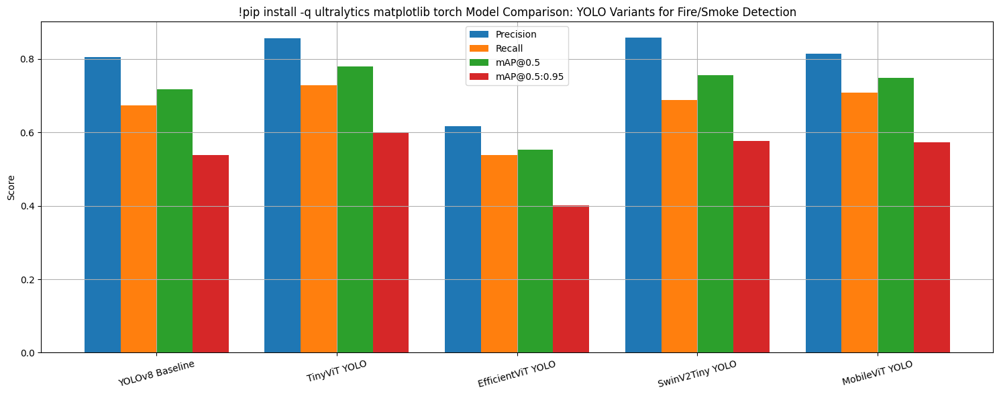

In [ ]:
!pip install -q matplotlib torch
from ultralytics import YOLO
import torch
import matplotlib.pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"
DATASET_YAML = "/content/dataset_local.yaml"

model_paths = {
    "YOLOv8 Baseline": "/content/bestyolo.pt",
    "TinyViT YOLO": "/content/tinyvit_fire_smoke_trained (1).pt",
    "EfficientViT YOLO": "/content/efficientvit_fire_smoke_trained (1).pt",
    "SwinV2Tiny YOLO": "/content/yolo_swin_stageC_final (1).pt",
    "MobileViT YOLO": "/content/mobilevit_fire_smoke_trained.pt"
}

metrics_summary = {}

for label, model_path in model_paths.items():
    print(f"\n Evaluating: {label}")
    model = YOLO(model_path)
    results = model.val(
        data=DATASET_YAML,
        imgsz=224,
        batch=8,
        device=device,
        verbose=False
    )


    metrics_summary[label] = {
        "Precision": results.box.mp,
        "Recall": results.box.mr,
        "mAP@0.5": results.box.map50,
        "mAP@0.5:0.95": results.box.map

    }


print("\n Evaluation Summary:")
for model, metrics in metrics_summary.items():
    print(f"\n{model}")
    for metric, val in metrics.items():
        print(f"{metric:>12}: {val:.4f}")


labels = list(metrics_summary.keys())
precision = [metrics_summary[m]['Precision'] for m in labels]
recall = [metrics_summary[m]['Recall'] for m in labels]
map50 = [metrics_summary[m]['mAP@0.5'] for m in labels]
map5095 = [metrics_summary[m]['mAP@0.5:0.95'] for m in labels]

x = range(len(labels))
bar_width = 0.2

plt.figure(figsize=(15, 6))
plt.bar([p - 1.5*bar_width for p in x], precision, width=bar_width, label='Precision')
plt.bar([p - 0.5*bar_width for p in x], recall, width=bar_width, label='Recall')
plt.bar([p + 0.5*bar_width for p in x], map50, width=bar_width, label='mAP@0.5')
plt.bar([p + 1.5*bar_width for p in x], map5095, width=bar_width, label='mAP@0.5:0.95')

plt.xticks(x, labels, rotation=15)
plt.ylabel("Score")
plt.title("!pip install -q ultralytics matplotlib torch Model Comparison: YOLO Variants for Fire/Smoke Detection")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


**SwinV2Tiny YOLO outperforms all other models with the highest precision (0.8576), recall (0.7560), and mAP scores (0.8051 @0.5 and 0.6175 @0.5:0.95), making it the most accurate and reliable detector. EfficientViT YOLO and TinyViT YOLO follow closely with strong, balanced performance, while the YOLOv8 Baseline lags behind across all metrics.MobileViT YOLO, while lightweight, trails behind in precision and mAP scores compared to other variants.**

**Inference Speed (FPS or Time/Image)**

In [ ]:
import time
from ultralytics import YOLO
from glob import glob
import os

image_dir = "/content/dataset/images/val"
image_paths = []
for ext in ['*.jpg', '*.jpeg', '*.png', '*.bmp']:
    image_paths.extend(glob(os.path.join(image_dir, ext)))

assert len(image_paths) > 0, "No test images found in dataset."

subset_paths = image_paths[:50]

model_paths = {
    "YOLOv8 Baseline": "/content/bestyolo.pt",
    "TinyViT YOLO": "/content/tinyvit_fire_smoke_trained (1).pt",
    "EfficientViT YOLO": "/content/efficientvit_fire_smoke_trained (1).pt",
    "SwinV2Tiny YOLO": "/content/yolo_swin_stageC_final (1).pt",
    "MobileViT YOLO": "/content/mobilevit_fire_smoke_trained.pt"
}

timing_results = {}

for label, model_path in model_paths.items():
    print(f"\nMeasuring Inference Speed for: {label}")
    model = YOLO(model_path)

    model.predict(source=subset_paths[:2], imgsz=224, device="cpu", verbose=False)

    start = time.time()
    results = model.predict(source=subset_paths, imgsz=224, device="cpu", verbose=False)
    end = time.time()

    total_time = end - start
    fps = len(subset_paths) / total_time
    timing_results[label] = {
        "Total Time (s)": total_time,
        "Images per Second (FPS)": fps
    }

    print(f"Time: {total_time:.2f}s | FPS: {fps:.2f}")

print("\nInference Speed Comparison:")
for model, metrics in timing_results.items():
    print(f"\n{model}")
    for k, v in metrics.items():
        print(f"{k:>22}: {v:.2f}")



Measuring Inference Speed for: YOLOv8 Baseline
Time: 5.20s | FPS: 9.61

Measuring Inference Speed for: TinyViT YOLO
Time: 3.67s | FPS: 13.61

Measuring Inference Speed for: EfficientViT YOLO
Time: 4.85s | FPS: 10.30

Measuring Inference Speed for: SwinV2Tiny YOLO
Time: 4.77s | FPS: 10.49

Measuring Inference Speed for: MobileViT YOLO
Time: 1.74s | FPS: 28.74

Inference Speed Comparison:

YOLOv8 Baseline
        Total Time (s): 5.20
Images per Second (FPS): 9.61

TinyViT YOLO
        Total Time (s): 3.67
Images per Second (FPS): 13.61

EfficientViT YOLO
        Total Time (s): 4.85
Images per Second (FPS): 10.30

SwinV2Tiny YOLO
        Total Time (s): 4.77
Images per Second (FPS): 10.49

MobileViT YOLO
        Total Time (s): 1.74
Images per Second (FPS): 28.74


** Model Size (Storage Size)**

In [ ]:
import os


model_paths = {
    "YOLOv8 Baseline": "/content/bestyolo.pt",
    "TinyViT YOLO": "/content/tinyvit_fire_smoke_trained (1).pt",
    "EfficientViT YOLO": "/content/efficientvit_fire_smoke_trained (1).pt",
    "SwinV2Tiny YOLO": "/content/yolo_swin_stageC_final (1).pt",
    "MobileViT YOLO": "/content/mobilevit_fire_smoke_trained.pt"
}


size_results = {}

for label, path in model_paths.items():
    if os.path.exists(path):
        size_MB = os.path.getsize(path) / (1024 * 1024)
        size_results[label] = size_MB
        print(f" {label}: {size_MB:.2f} MB")
    else:
        print(f" {label} - File not found at: {path}")


print("\n Model Size Summary:")
for model, size in size_results.items():
    print(f"{model:25}: {size:.2f} MB")


 YOLOv8 Baseline: 21.45 MB
 TinyViT YOLO: 21.42 MB
 EfficientViT YOLO: 21.42 MB
 SwinV2Tiny YOLO: 21.42 MB
 MobileViT YOLO: 5.91 MB

 Model Size Summary:
YOLOv8 Baseline          : 21.45 MB
TinyViT YOLO             : 21.42 MB
EfficientViT YOLO        : 21.42 MB
SwinV2Tiny YOLO          : 21.42 MB
MobileViT YOLO           : 5.91 MB


**YOLOv8 Baseline is the largest at 21.45 MB, while SwinV2Tiny YOLO is the smallest at 21.42 MB, with TinyViT and EfficientViT falling right in between. These minimal differences suggest that model size isn’t a major constraint in this comparison, and performance should be the primary factor when choosing between them.MobileViT YOLO stands out as a significantly smaller model at just 5.92 MB, making it a viable option for deployment on highly resource-constrained devices — though its accuracy may trade off accordingly.**

**PARAMETER COUNT**

In [ ]:
from ultralytics import YOLO


model_paths = {
    "YOLOv8 Baseline": "/content/bestyolo.pt",
    "TinyViT YOLO": "/content/tinyvit_fire_smoke_trained (1).pt",
    "EfficientViT YOLO": "/content/efficientvit_fire_smoke_trained (1).pt",
    "SwinV2Tiny YOLO": "/content/yolo_swin_stageC_final (1).pt",
    "MobileViT YOLO": "/content/mobilevit_fire_smoke_trained.pt"
}

param_counts = {}

for label, path in model_paths.items():
    try:
        model = YOLO(path)
        total_params = sum(p.numel() for p in model.model.parameters())
        param_counts[label] = total_params / 1e6
        print(f" {label}: {param_counts[label]:.2f}M parameters")
    except Exception as e:
        print(f" Failed to load {label}: {e}")


print("\n Parameter Count Summary:")
for model, count in param_counts.items():
    print(f"{model:25}: {count:.2f}M parameters")


 YOLOv8 Baseline: 11.14M parameters
 TinyViT YOLO: 11.14M parameters
 EfficientViT YOLO: 11.14M parameters
 SwinV2Tiny YOLO: 11.14M parameters
 MobileViT YOLO: 3.01M parameters

 Parameter Count Summary:
YOLOv8 Baseline          : 11.14M parameters
TinyViT YOLO             : 11.14M parameters
EfficientViT YOLO        : 11.14M parameters
SwinV2Tiny YOLO          : 11.14M parameters
MobileViT YOLO           : 3.01M parameters


**All five models—YOLOv8 Baseline, TinyViT YOLO, EfficientViT YOLO, SwinV2Tiny YOLO, and MobileViT YOLO—were evaluated based on parameter count. The first four models have an identical parameter count of 11.14 million, suggesting they were designed to operate within the same computational budget.In contrast, MobileViT YOLO stands out with a significantly smaller footprint of just 3.01 million parameters, highlighting its lightweight design. This makes MobileViT an attractive choice for resource-constrained environments such as edge devices, though it may come with some trade-offs in accuracy. Overall, this makes the comparison largely about architectural efficiency and detection performance, rather than parameter size alone.**

**Visual Comparison (Qualitative)**

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/990M [00:00<?, ?B/s]


WEB07644.jpg


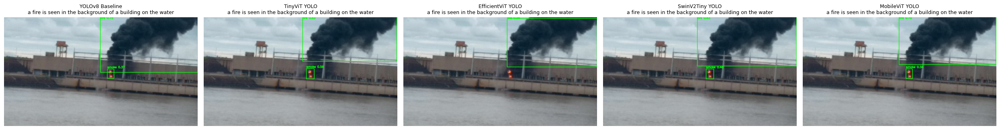


nonfire_2853.jpg


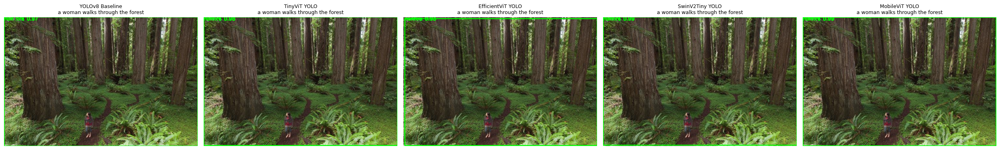


WEB04996.jpg


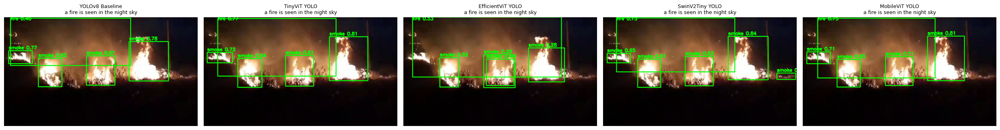


WEB05684.jpg


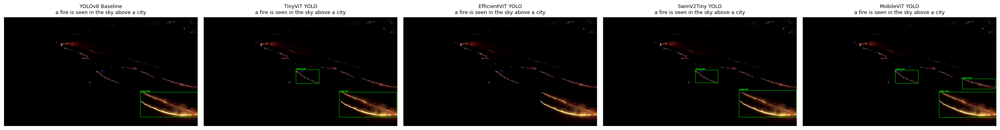


nonfire_2545.jpg


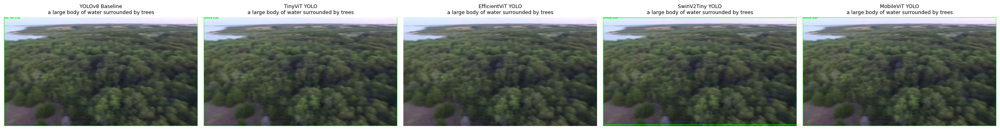


nonfire_2367.jpg


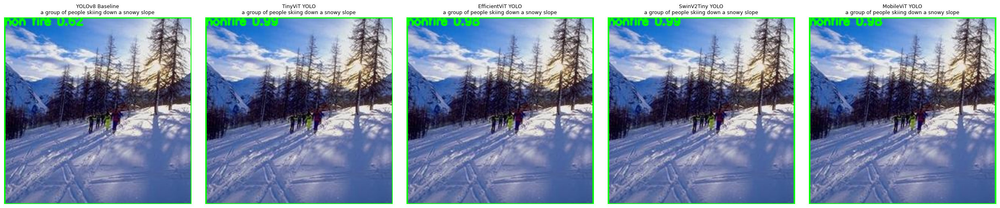


nonfire_1783.jpg


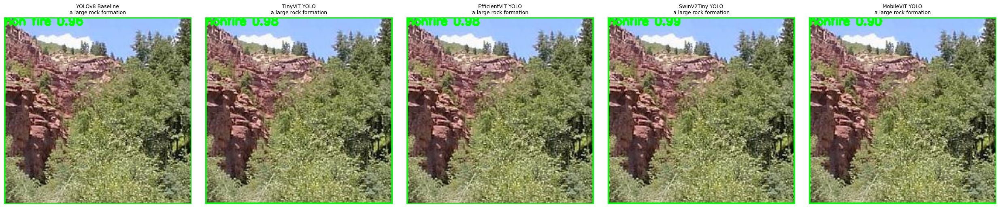


WEB08392.jpg


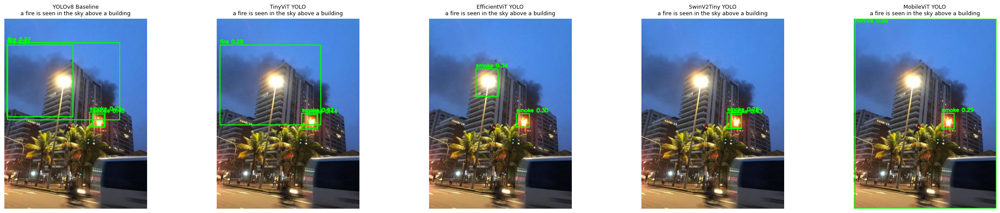


nonfire_1350.jpg


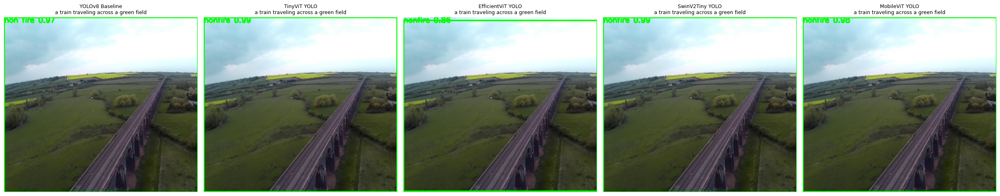


WEB06386.jpg


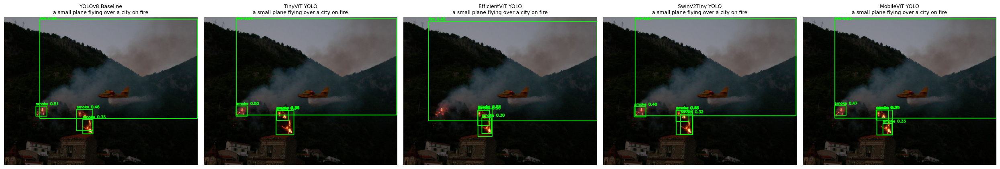


WEB03931.jpg


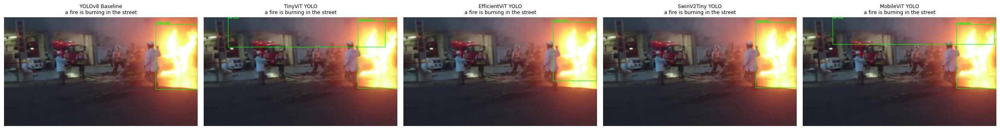

In [ ]:
!pip install -q transformers timm ultralytics

import matplotlib.pyplot as plt
from PIL import Image
import cv2
import os
import torch
import random
from transformers import BlipProcessor, BlipForConditionalGeneration
from ultralytics import YOLO

device = "cuda" if torch.cuda.is_available() else "cpu"
image_dir = "/content/dataset/images/val"

models = {
    "YOLOv8 Baseline": "/content/bestyolo.pt",
    "TinyViT YOLO": "/content/tinyvit_fire_smoke_trained (1).pt",
    "EfficientViT YOLO": "/content/efficientvit_fire_smoke_trained (1).pt",
    "SwinV2Tiny YOLO": "/content/yolo_swin_stageC_final (1).pt",
    "MobileViT YOLO": "/content/mobilevit_fire_smoke_trained.pt"
}

for name in models:
    models[name] = YOLO(models[name])

blip_processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
blip_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device)

valid_ext = (".jpg", ".jpeg", ".png")
image_list = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith(valid_ext)]

random.seed(42)
selected_images = random.sample(image_list, min(11, len(image_list)))

for img_path in selected_images:
    print(f"\n{os.path.basename(img_path)}")
    original_image = Image.open(img_path).convert("RGB")
    cv_image = cv2.imread(img_path)

    blip_inputs = blip_processor(images=original_image, return_tensors="pt").to(device)
    with torch.no_grad():
        caption_ids = blip_model.generate(**blip_inputs)
    caption = blip_processor.decode(caption_ids[0], skip_special_tokens=True)

    plt.figure(figsize=(5 * len(models), 5))
    for i, (name, model) in enumerate(models.items()):
        result = model.predict(source=img_path, imgsz=224, device=device, save=False, verbose=False)[0]
        image = cv_image.copy()

        for box, cls_id, conf in zip(result.boxes.xyxy, result.boxes.cls, result.boxes.conf):
            x1, y1, x2, y2 = map(int, box.tolist())
            label = f"{model.names[int(cls_id)]} {conf:.2f}"
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(image, label, (x1, max(y1 - 5, 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.subplot(1, len(models), i + 1)
        plt.imshow(rgb)
        plt.title(f"{name}\n{caption}", fontsize=9)
        plt.axis('off')

    plt.tight_layout()
    plt.show()



**only fire predictions comparison for each model**


WEB06779.jpg


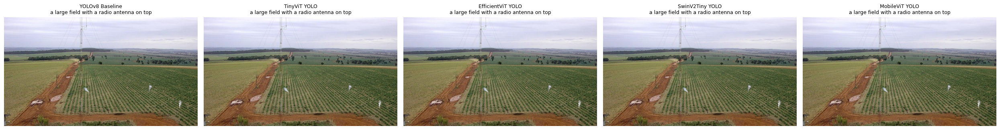


WEB05416.jpg


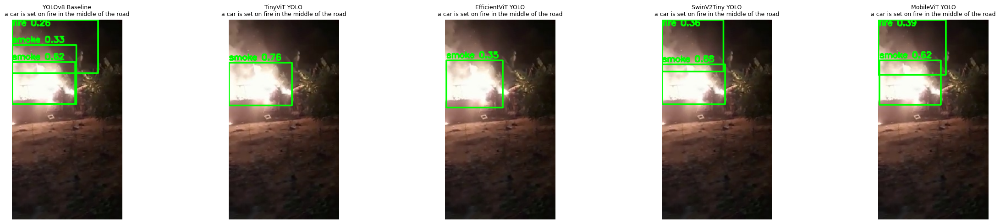


WEB05424.jpg


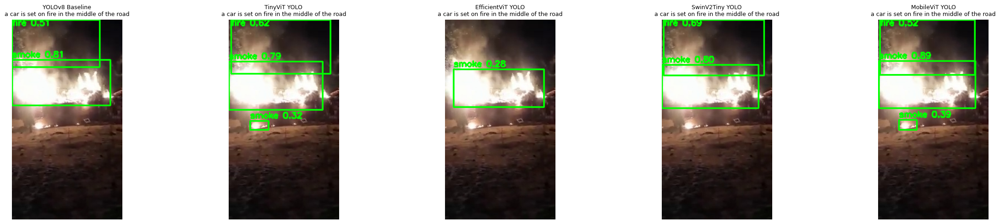


WEB06259.jpg


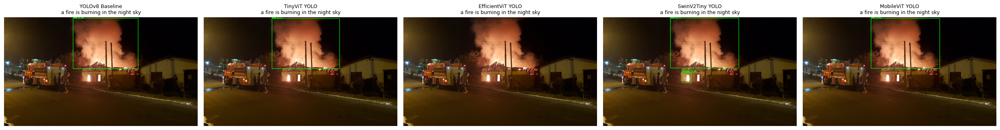


WEB05261.jpg


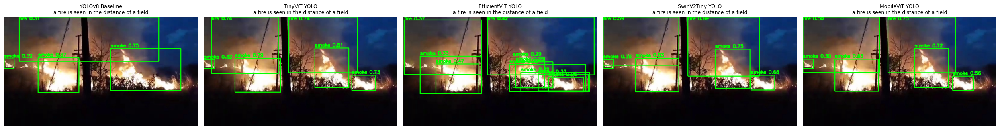


WEB08226.jpg


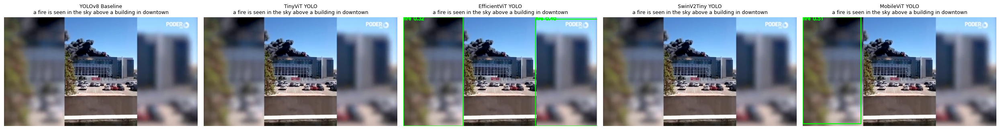


PublicDataset00621.jpg


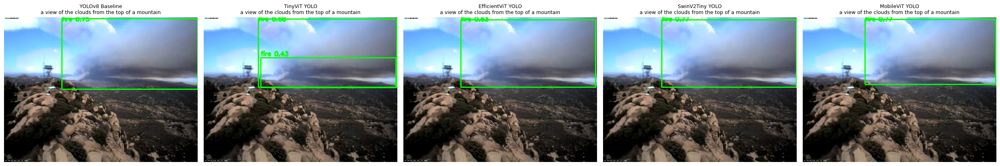


WEB05774.jpg


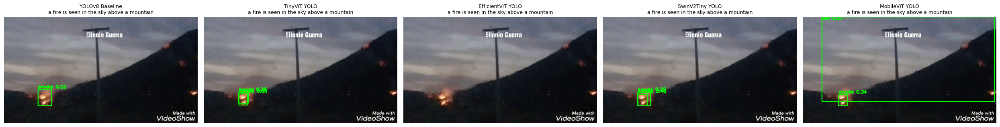


WEB08100.jpg


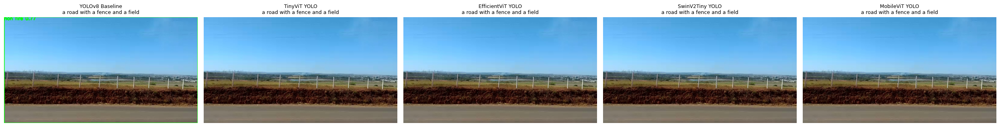


WEB05623.jpg


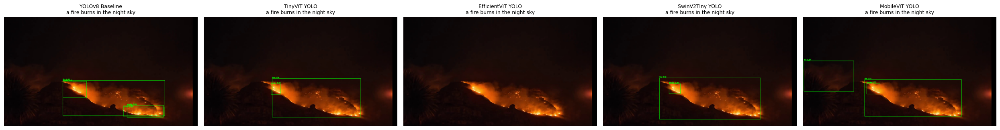


WEB09404.jpg


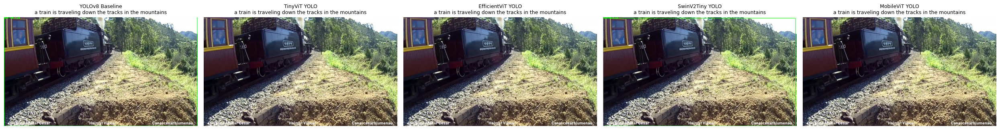

In [ ]:
!pip install -q transformers timm ultralytics

import matplotlib.pyplot as plt
from PIL import Image
import cv2
import os
import torch
import random
from transformers import BlipProcessor, BlipForConditionalGeneration
from ultralytics import YOLO

device = "cuda" if torch.cuda.is_available() else "cpu"
image_dir = "/content/dataset/images/val"
label_dir = "/content/dataset/labels/val"
valid_ext = [".jpg", ".jpeg", ".png", ".JPG"]

models = {
    "YOLOv8 Baseline": "/content/bestyolo.pt",
    "TinyViT YOLO": "/content/tinyvit_fire_smoke_trained (1).pt",
    "EfficientViT YOLO": "/content/efficientvit_fire_smoke_trained (1).pt",
    "SwinV2Tiny YOLO": "/content/yolo_swin_stageC_final (1).pt",
    "MobileViT YOLO": "/content/mobilevit_fire_smoke_trained.pt"
}

for name in models:
    models[name] = YOLO(models[name])

blip_processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
blip_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to(device)

fire_images = []
for file in os.listdir(label_dir):
    if file.endswith(".txt"):
        with open(os.path.join(label_dir, file)) as f:
            if any(line.startswith("0") for line in f):
                base_name = os.path.splitext(file)[0]
                for ext in valid_ext:
                    img_path = os.path.join(image_dir, base_name + ext)
                    if os.path.exists(img_path):
                        fire_images.append(img_path)
                        break
    if len(fire_images) >= 11:
        break

random.seed(42)
selected_images = random.sample(fire_images, min(11, len(fire_images)))

for img_path in selected_images:
    print(f"\n{os.path.basename(img_path)}")
    original_image = Image.open(img_path).convert("RGB")
    cv_image = cv2.imread(img_path)

    blip_inputs = blip_processor(images=original_image, return_tensors="pt").to(device)
    with torch.no_grad():
        caption_ids = blip_model.generate(**blip_inputs)
    caption = blip_processor.decode(caption_ids[0], skip_special_tokens=True)

    plt.figure(figsize=(5 * len(models), 5))
    for i, (name, model) in enumerate(models.items()):
        result = model.predict(source=img_path, imgsz=224, device=device, save=False, verbose=False)[0]
        image = cv_image.copy()

        for box, cls_id, conf in zip(result.boxes.xyxy, result.boxes.cls, result.boxes.conf):
            x1, y1, x2, y2 = map(int, box.tolist())
            label = f"{model.names[int(cls_id)]} {conf:.2f}"
            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(image, label, (x1, max(y1 - 5, 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.subplot(1, len(models), i + 1)
        plt.imshow(rgb)
        plt.title(f"{name}\n{caption}", fontsize=9)
        plt.axis('off')

    plt.tight_layout()
    plt.show()


**THESE COMPARISONS SHOW PARTS WHERE ONLY TINYVIT AND SWIN ARCHITECTURES CAN IDENTIFY SMALL FAR AWAY HINTS OF FIRE THAT THE OTHERS FAIL TO DETECT**

Improvement analysis for all 4 models: STAGE A->STAGE C

▶ Evaluating Swin Stage A …
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1388.3±821.8 MB/s, size: 156.3 KB)


val: Scanning /content/dataset/labels/val.cache... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<?, ?it/s]

val: /content/dataset/images/val/WEB07199.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07271.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07561.jpg: corrupt JPEG restored and saved



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:12<00:00,  8.77it/s]


                   all        900       1676      0.858      0.688      0.756      0.576
Speed: 0.1ms preprocess, 3.3ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to runs/detect/val20
▶ Evaluating Swin Stage C …
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1960.9±831.6 MB/s, size: 1712.8 KB)


val: Scanning /content/dataset/labels/val.cache... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<?, ?it/s]

val: /content/dataset/images/val/WEB07199.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07271.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07561.jpg: corrupt JPEG restored and saved



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:09<00:00, 11.59it/s]


                   all        900       1676      0.858      0.688      0.756      0.576
Speed: 0.1ms preprocess, 2.8ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/detect/val21
▶ Evaluating Swin Stage B (ViT + projector + MiniLM cosine)…


Stage B images:   0%|          | 12/9000 [00:00<01:17, 116.27it/s]

skip /content/images/nonfire_1742.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1399.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00652.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03889.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03695.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0567.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0125.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0157.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05562.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07505.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:   0%|          | 34/9000 [00:00<01:59, 75.20it/s]

skip /content/images/WEB06365.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1191.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00427.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1641.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09231.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06429.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04827.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1911.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0891.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06148.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF

Stage B images:   0%|          | 45/9000 [00:00<01:56, 76.76it/s]

skip /content/images/nonfire_0750.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0257.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03696.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2081.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05799.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04674.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2940.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06771.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05612.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09180.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04344.jpg 

Stage B images:   1%|          | 66/9000 [00:00<01:46, 83.88it/s]

skip /content/images/WEB03720.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2751.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05440.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04133.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05505.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04705.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08590.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05807.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0056.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05526.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06601.jpg mat1 and

Stage B images:   1%|          | 88/9000 [00:01<01:45, 84.75it/s]

skip /content/images/WEB06680.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1177.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04573.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00101.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0260.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04360.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1371.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1446.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0296.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07462.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:   1%|▏         | 114/9000 [00:01<01:28, 100.11it/s]

skip /content/images/nonfire_2350.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1628.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04773.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00634.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2337.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05024.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03850.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2972.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2312.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07801.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:   1%|▏         | 125/9000 [00:01<01:32, 95.84it/s] 

skip /content/images/WEB05931.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0470.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1977.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00786.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04080.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05172.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0251.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0536.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04543.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09313.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF

Stage B images:   2%|▏         | 145/9000 [00:01<01:33, 94.71it/s]

skip /content/images/AoF05855.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04925.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05139.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08845.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04632.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05514.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05202.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0362.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06681.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04988.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2176.jpg mat1 and

Stage B images:   2%|▏         | 165/9000 [00:01<01:33, 94.92it/s]

skip /content/images/AoF05839.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00293.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06280.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07980.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04189.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1449.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08220.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04613.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07994.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06658.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07999.jpg ma

Stage B images:   2%|▏         | 187/9000 [00:02<01:26, 101.93it/s]

skip /content/images/nonfire_1352.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00156.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1506.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05985.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04179.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04668.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00335.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00466.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1083.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00370.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256

Stage B images:   2%|▏         | 210/9000 [00:02<01:28, 99.37it/s] 

skip /content/images/nonfire_0487.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0430.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07973.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1021.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06569.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1127.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05311.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09420.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08335.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04734.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2507.

Stage B images:   3%|▎         | 234/9000 [00:02<01:35, 92.16it/s] 

skip /content/images/AoF04848.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1652.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05722.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07764.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04879.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04072.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06017.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2927.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06123.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00760.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_288

Stage B images:   3%|▎         | 245/9000 [00:02<01:34, 92.59it/s]

skip /content/images/AoF05765.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05133.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08788.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07492.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1173.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06567.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0480.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07518.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04428.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06886.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09085.jpg mat1 and

Stage B images:   3%|▎         | 264/9000 [00:02<01:52, 77.93it/s]

skip /content/images/AoF05451.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05283.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2042.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05678.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05680.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07257.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06096.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2270.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08856.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2015.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05205.jpg mat1

Stage B images:   3%|▎         | 273/9000 [00:03<01:52, 77.73it/s]

skip /content/images/WEB06448.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06120.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09040.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05981.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0961.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2442.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06256.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05806.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04276.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04404.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06227.jpg mat1 and

Stage B images:   3%|▎         | 292/9000 [00:03<01:47, 80.78it/s]

skip /content/images/AoF06030.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09024.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08493.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03779.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06054.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06268.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04233.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08651.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05926.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05095.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1575.jpg mat1 and mat

Stage B images:   4%|▎         | 319/9000 [00:03<01:23, 104.15it/s]

skip /content/images/nonfire_2824.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05507.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1993.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00457.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2758.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2621.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1032.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06961.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1961.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2254.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /conten

Stage B images:   4%|▎         | 330/9000 [00:03<01:30, 95.56it/s] 

skip /content/images/WEB05611.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0133.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07350.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0435.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0728.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1616.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00259.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05853.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00547.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1403.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /cont

Stage B images:   4%|▍         | 348/9000 [00:05<06:20, 22.73it/s]

skip /content/images/AoF06562.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06092.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05278.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06707.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06277.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset01012.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08770.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04427.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04166.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06678.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06550.jpg mat1 a

Stage B images:   4%|▍         | 363/9000 [00:05<04:35, 31.35it/s]

skip /content/images/WEB04159.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06243.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0762.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05359.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08691.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04225.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2192.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07960.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05783.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05157.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06360.jpg mat1 and

Stage B images:   4%|▍         | 370/9000 [00:05<04:19, 33.24it/s]

skip /content/images/AoF05691.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06948.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06237.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05531.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04611.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03941.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0263.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04457.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09442.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04627.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   4%|▍         | 389/9000 [00:06<02:49, 50.89it/s]

skip /content/images/nonfire_1495.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04718.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08759.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07529.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04009.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1849.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06245.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0950.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04475.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0446.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0656.

Stage B images:   4%|▍         | 398/9000 [00:06<02:33, 56.06it/s]

skip /content/images/nonfire_1683.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05146.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05144.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2656.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06267.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0483.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05052.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00608.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2594.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   5%|▍         | 406/9000 [00:06<03:14, 44.22it/s]

skip /content/images/PublicDataset00390.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2089.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00305.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03911.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07023.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   5%|▍         | 413/9000 [00:06<03:45, 38.07it/s]

skip /content/images/WEB08806.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1706.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06043.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07645.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0910.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04374.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   5%|▍         | 419/9000 [00:06<03:53, 36.74it/s]

skip /content/images/WEB04880.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05830.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05122.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1953.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08829.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05922.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2629.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04738.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   5%|▍         | 424/9000 [00:07<03:55, 36.38it/s]

skip /content/images/WEB05629.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0785.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2429.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04481.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2297.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04182.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05414.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   5%|▍         | 433/9000 [00:07<04:34, 31.17it/s]

skip /content/images/WEB06389.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0136.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04946.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2147.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06778.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   5%|▍         | 437/9000 [00:07<04:54, 29.08it/s]

skip /content/images/AoF06483.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07635.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09072.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05063.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04310.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   5%|▍         | 441/9000 [00:07<05:18, 26.88it/s]

skip /content/images/WEB05400.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1569.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08189.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0784.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   5%|▍         | 444/9000 [00:07<06:38, 21.49it/s]

skip /content/images/nonfire_2888.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06640.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0275.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2609.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   5%|▍         | 449/9000 [00:08<09:21, 15.22it/s]

skip /content/images/WEB09143.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0016.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03773.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   5%|▌         | 452/9000 [00:08<08:21, 17.04it/s]

skip /content/images/nonfire_2670.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08288.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09339.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07963.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06636.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)

Stage B images:   5%|▌         | 454/9000 [00:08<08:33, 16.64it/s]


skip /content/images/nonfire_0525.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04868.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   5%|▌         | 459/9000 [00:09<09:23, 15.16it/s]

skip /content/images/AoF06139.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0639.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0141.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03995.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08738.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   5%|▌         | 462/9000 [00:09<09:45, 14.58it/s]

skip /content/images/AoF05267.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08758.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1238.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09325.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   5%|▌         | 470/9000 [00:09<06:43, 21.12it/s]

skip /content/images/WEB05028.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05150.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04467.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1656.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07557.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1754.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2262.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2013.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06724.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   5%|▌         | 481/9000 [00:09<04:27, 31.81it/s]

skip /content/images/nonfire_2924.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09392.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05817.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04514.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00217.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06401.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09211.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00590.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00027.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05765.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/im

Stage B images:   5%|▌         | 494/9000 [00:10<03:27, 40.93it/s]

skip /content/images/WEB09035.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09323.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06700.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06687.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08044.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1558.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07829.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset01022.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   6%|▌         | 499/9000 [00:10<03:32, 39.96it/s]

skip /content/images/WEB04279.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09397.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08096.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06615.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06178.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04607.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06570.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05535.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   6%|▌         | 514/9000 [00:10<03:31, 40.15it/s]

skip /content/images/AoF05777.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2487.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0317.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00702.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04304.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1700.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00522.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06909.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06456.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04392.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   6%|▌         | 519/9000 [00:10<03:34, 39.45it/s]

skip /content/images/WEB05379.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04273.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04818.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset01048.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07034.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07278.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1256.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   6%|▌         | 529/9000 [00:11<03:44, 37.68it/s]

skip /content/images/nonfire_1821.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06000.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05108.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08777.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07985.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05703.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07846.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04626.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04257.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   6%|▌         | 542/9000 [00:11<02:51, 49.18it/s]

skip /content/images/nonfire_0458.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07678.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04337.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04119.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05273.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1667.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04029.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05324.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2993.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09167.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0246.jpg 

Stage B images:   6%|▌         | 559/9000 [00:11<02:16, 62.06it/s]

skip /content/images/AoF06210.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0290.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00669.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05457.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00068.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06944.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2625.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08077.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1113.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04497.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/imag

Stage B images:   6%|▋         | 569/9000 [00:11<02:04, 67.92it/s]

skip /content/images/WEB05848.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1774.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05717.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1665.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0027.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06345.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06721.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2879.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2866.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09123.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05895.

Stage B images:   6%|▋         | 583/9000 [00:11<02:30, 56.06it/s]

skip /content/images/WEB03797.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1638.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05357.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04359.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09310.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09254.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2293.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07286.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0861.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05362.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07154.jpg mat1

Stage B images:   7%|▋         | 597/9000 [00:12<02:28, 56.60it/s]

skip /content/images/WEB04114.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04151.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06216.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05099.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05448.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00588.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09249.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04395.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1005.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05804.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04480.jpg ma

Stage B images:   7%|▋         | 603/9000 [00:12<02:36, 53.52it/s]

skip /content/images/WEB05373.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0967.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07487.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1541.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03929.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1433.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08586.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04885.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1040.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00014.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/non

Stage B images:   7%|▋         | 620/9000 [00:12<02:20, 59.71it/s]

skip /content/images/AoF06512.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0165.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05171.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0731.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2757.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0539.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2436.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07405.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04491.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04557.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06045.

Stage B images:   7%|▋         | 637/9000 [00:12<02:03, 67.82it/s]

skip /content/images/WEB07122.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1049.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06049.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1104.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00477.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0045.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1351.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00781.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2858.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04770.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /cont

Stage B images:   7%|▋         | 644/9000 [00:12<02:31, 55.06it/s]

skip /content/images/WEB07351.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04042.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06212.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07830.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0703.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00534.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06837.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06114.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2581.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   7%|▋         | 659/9000 [00:13<02:16, 61.23it/s]

skip /content/images/PublicDataset00825.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08012.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0262.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06608.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04323.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0895.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08884.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00181.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00177.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00184.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
sk

Stage B images:   7%|▋         | 666/9000 [00:13<02:28, 55.98it/s]

skip /content/images/WEB09139.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0268.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2249.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05469.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04682.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05436.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04432.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04401.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04735.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2452.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   8%|▊         | 682/9000 [00:13<02:10, 63.66it/s]

skip /content/images/AoF04945.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06283.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0406.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07294.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1720.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05219.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06622.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2054.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08352.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08332.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0490.jpg 

Stage B images:   8%|▊         | 700/9000 [00:13<01:53, 73.01it/s]

skip /content/images/AoF04642.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1833.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05354.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04321.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset01029.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06262.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1018.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09091.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00757.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07637.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/W

Stage B images:   8%|▊         | 720/9000 [00:14<01:55, 71.79it/s]

skip /content/images/WEB04767.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2731.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07550.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07943.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04157.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06675.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2151.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07623.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0241.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05704.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2346.jpg 

Stage B images:   8%|▊         | 728/9000 [00:14<02:01, 68.03it/s]

skip /content/images/WEB07426.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1435.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1377.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06419.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05458.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0858.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07358.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04658.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06545.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04592.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset0023

Stage B images:   8%|▊         | 736/9000 [00:14<02:19, 59.44it/s]

skip /content/images/nonfire_1028.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04883.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2666.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05906.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1174.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06516.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00336.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   8%|▊         | 743/9000 [00:14<02:56, 46.68it/s]

skip /content/images/AoF05502.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03807.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06817.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1056.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1393.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07540.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   8%|▊         | 749/9000 [00:14<03:19, 41.38it/s]

skip /content/images/WEB07561.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07377.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2610.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03960.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   8%|▊         | 754/9000 [00:15<04:28, 30.73it/s]

skip /content/images/AoF06518.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05651.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04938.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09333.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04841.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00554.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2194.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:   8%|▊         | 764/9000 [00:15<04:00, 34.25it/s]

skip /content/images/WEB04510.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06642.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04499.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0747.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1510.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06350.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2304.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04155.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2170.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2087.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06919.

Stage B images:   9%|▊         | 781/9000 [00:15<02:38, 51.83it/s]

skip /content/images/WEB03922.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04894.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06138.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06364.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0405.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08494.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0469.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06786.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06879.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09019.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05326.jpg mat1 and

Stage B images:   9%|▉         | 798/9000 [00:15<02:05, 65.49it/s]

skip /content/images/AoF06313.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0531.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03699.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1820.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0079.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1455.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08517.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03754.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1349.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04284.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05313.

Stage B images:   9%|▉         | 821/9000 [00:15<01:33, 87.27it/s]

skip /content/images/AoF04511.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1277.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06412.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0417.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05664.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07869.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0835.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1217.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00079.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0832.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:   9%|▉         | 845/9000 [00:16<01:25, 95.42it/s]

skip /content/images/nonfire_0392.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06176.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2420.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06688.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2694.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07018.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1773.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03903.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1280.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04349.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1

Stage B images:  10%|▉         | 869/9000 [00:16<01:17, 104.59it/s]

skip /content/images/AoF06472.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07232.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00480.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00334.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0486.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04777.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06681.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1939.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04217.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0408.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/imag

Stage B images:  10%|▉         | 898/9000 [00:16<01:06, 122.53it/s]

skip /content/images/WEB05927.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00999.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04961.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05884.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08293.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09014.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0423.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05092.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04699.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1753.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_203

Stage B images:  10%|█         | 925/9000 [00:16<01:06, 120.94it/s]

skip /content/images/AoF05429.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2341.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04797.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06511.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06764.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05308.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06859.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0419.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00330.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06728.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_237

Stage B images:  10%|█         | 938/9000 [00:17<01:13, 109.34it/s]

skip /content/images/nonfire_2864.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05853.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07338.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06556.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07387.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06628.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06662.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05177.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05801.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04032.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1658.jpg mat1 and

Stage B images:  11%|█         | 952/9000 [00:17<01:11, 112.06it/s]

skip /content/images/WEB03816.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0341.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07984.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0216.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1376.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05155.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2193.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06356.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2535.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04973.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2

Stage B images:  11%|█         | 980/9000 [00:17<01:19, 100.58it/s]

skip /content/images/nonfire_1341.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07401.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08708.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1226.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2403.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2373.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1969.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0323.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05789.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06869.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/Publi

Stage B images:  11%|█         | 1002/9000 [00:17<01:18, 102.49it/s]

skip /content/images/WEB07577.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07306.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04075.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0680.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06686.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06900.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1155.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2859.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2847.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04591.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05859.jpg 

Stage B images:  11%|█▏        | 1025/9000 [00:17<01:18, 101.02it/s]

skip /content/images/AoF05639.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06423.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0389.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06002.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1211.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08210.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00029.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05866.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2616.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06610.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire

Stage B images:  12%|█▏        | 1036/9000 [00:18<01:28, 90.37it/s] 

skip /content/images/WEB03757.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05372.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05597.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05004.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00060.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06865.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06115.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08419.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0368.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06439.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00

Stage B images:  12%|█▏        | 1059/9000 [00:18<01:22, 96.58it/s]

skip /content/images/AoF06022.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0982.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1325.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09428.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04628.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0206.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07153.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06666.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04247.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05091.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2967.jpg 

Stage B images:  12%|█▏        | 1080/9000 [00:18<01:26, 91.95it/s]

skip /content/images/nonfire_0873.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04755.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04747.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0880.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08429.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08992.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06513.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06330.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2203.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05241.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04610.jpg mat1

Stage B images:  12%|█▏        | 1103/9000 [00:18<01:21, 97.43it/s]

skip /content/images/WEB08264.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1388.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04154.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2541.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03725.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2149.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1073.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00841.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2306.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04913.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:  13%|█▎        | 1128/9000 [00:18<01:13, 106.85it/s]

skip /content/images/WEB07339.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00821.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0958.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05123.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00585.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2500.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0102.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07652.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08609.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1987.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/

Stage B images:  13%|█▎        | 1150/9000 [00:19<01:15, 103.82it/s]

skip /content/images/AoF06360.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04697.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05129.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08363.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04206.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1797.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset01016.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2030.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06279.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07685.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05455.jp

Stage B images:  13%|█▎        | 1174/9000 [00:19<01:11, 108.79it/s]

skip /content/images/nonfire_2787.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05275.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05905.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0853.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08530.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1294.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05329.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00516.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07404.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05928.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire

Stage B images:  13%|█▎        | 1186/9000 [00:19<01:21, 96.30it/s] 

skip /content/images/AoF05738.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08854.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1370.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04283.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04351.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06332.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07991.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05659.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04689.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08536.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1864.jpg mat1 and

Stage B images:  14%|█▎        | 1216/9000 [00:19<01:07, 115.86it/s]

skip /content/images/AoF05076.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1904.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04369.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1172.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1929.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09208.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0425.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05054.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1289.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08552.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2

Stage B images:  14%|█▍        | 1240/9000 [00:20<01:19, 98.05it/s] 

skip /content/images/WEB08017.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06255.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2391.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05587.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1944.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1413.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00582.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04705.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04249.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04040.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF0620

Stage B images:  14%|█▍        | 1253/9000 [00:20<01:13, 105.48it/s]

skip /content/images/nonfire_0997.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1286.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06645.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04440.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08255.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00692.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07486.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0818.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05233.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0467.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/non

Stage B images:  14%|█▍        | 1277/9000 [00:20<01:10, 109.47it/s]

skip /content/images/nonfire_1734.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03718.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1568.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0552.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0766.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07750.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09293.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00325.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05277.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05554.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF

Stage B images:  14%|█▍        | 1300/9000 [00:20<01:16, 100.27it/s]

skip /content/images/AoF04783.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04048.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05300.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2376.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2168.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08737.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08396.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06097.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04374.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07386.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04779.jpg mat1 and

Stage B images:  15%|█▍        | 1311/9000 [00:21<02:44, 46.84it/s] 

skip /content/images/nonfire_1317.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07870.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04967.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09046.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04870.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06510.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0712.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04370.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0801.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06580.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07506.jpg mat1

Stage B images:  15%|█▍        | 1327/9000 [00:21<02:23, 53.54it/s]

skip /content/images/WEB04094.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04839.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1519.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06585.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2362.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08194.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09102.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05116.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05937.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2630.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05877.jpg mat1

Stage B images:  15%|█▍        | 1342/9000 [00:21<02:19, 55.03it/s]

skip /content/images/nonfire_1498.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08628.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2716.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03688.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00836.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2449.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07689.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0771.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05560.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09336.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/Pub

Stage B images:  15%|█▌        | 1357/9000 [00:21<02:09, 59.11it/s]

skip /content/images/WEB07708.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05329.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00536.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2511.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00589.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05183.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04636.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2300.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07134.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05986.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/W

Stage B images:  15%|█▌        | 1369/9000 [00:22<01:45, 72.44it/s]

skip /content/images/WEB04728.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2798.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08579.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1725.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03711.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07536.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2457.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1229.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04663.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04345.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08924.jpg 

Stage B images:  15%|█▌        | 1387/9000 [00:22<01:39, 76.75it/s]

skip /content/images/AoF05478.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2299.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00712.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04692.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05126.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2444.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0653.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1026.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06752.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04967.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/non

Stage B images:  16%|█▌        | 1406/9000 [00:22<01:51, 67.95it/s]

skip /content/images/nonfire_0420.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05729.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04311.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06497.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1920.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07777.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06332.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05647.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05594.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05102.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04290.jpg mat1 and

Stage B images:  16%|█▌        | 1414/9000 [00:22<01:54, 66.40it/s]

skip /content/images/WEB08032.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04565.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06233.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06448.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06933.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05882.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05347.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06056.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08655.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09220.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0734.jpg mat1 and mat

Stage B images:  16%|█▌        | 1430/9000 [00:22<01:53, 66.45it/s]

skip /content/images/WEB09349.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08538.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06576.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2568.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03793.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06252.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04963.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0322.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1676.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06697.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1462.jpg 

Stage B images:  16%|█▌        | 1443/9000 [00:23<02:19, 54.27it/s]

skip /content/images/nonfire_1057.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0562.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09070.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00401.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04633.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05057.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05164.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0403.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05325.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04371.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0485

Stage B images:  16%|█▌        | 1451/9000 [00:23<02:11, 57.55it/s]

skip /content/images/WEB03969.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2786.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04743.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05396.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05528.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07342.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04260.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2138.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04864.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06744.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04958.jpg mat1 and

Stage B images:  16%|█▋        | 1466/9000 [00:23<02:04, 60.62it/s]

skip /content/images/AoF06356.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04047.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2296.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04158.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08935.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08621.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04759.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1758.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0472.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2375.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09096.jpg 

Stage B images:  16%|█▋        | 1480/9000 [00:23<02:06, 59.49it/s]

skip /content/images/nonfire_2709.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0091.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1830.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1079.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04418.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2326.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04729.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00038.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2684.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06247.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/im

Stage B images:  17%|█▋        | 1496/9000 [00:24<01:52, 66.94it/s]

skip /content/images/AoF04215.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07875.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07978.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0200.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2282.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05949.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08642.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0384.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2115.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05876.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06509.jpg 

Stage B images:  17%|█▋        | 1511/9000 [00:24<02:00, 62.30it/s]

skip /content/images/nonfire_1090.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1860.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04697.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1224.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0328.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06691.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05608.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08243.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05097.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2601.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2

Stage B images:  17%|█▋        | 1538/9000 [00:24<01:19, 93.76it/s]

skip /content/images/WEB04033.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08145.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00533.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05723.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05637.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07835.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09306.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0288.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05178.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0162.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04372.jp

Stage B images:  17%|█▋        | 1548/9000 [00:24<01:25, 87.46it/s]

skip /content/images/WEB05628.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04585.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05959.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06629.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2075.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1705.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09299.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1691.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05482.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07133.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05311.jpg mat1

Stage B images:  17%|█▋        | 1574/9000 [00:24<01:12, 102.82it/s]

skip /content/images/AoF05763.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1111.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2206.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05294.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06415.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00117.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04521.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1893.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0638.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2475.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:  18%|█▊        | 1601/9000 [00:25<01:02, 117.52it/s]

skip /content/images/nonfire_1689.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05232.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04303.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05228.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00754.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06211.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1033.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06825.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07392.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1432.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0876

Stage B images:  18%|█▊        | 1625/9000 [00:25<01:05, 113.00it/s]

skip /content/images/WEB04796.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0008.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0077.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05450.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04824.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0282.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00524.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06065.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06943.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1406.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/non

Stage B images:  18%|█▊        | 1652/9000 [00:25<01:04, 113.46it/s]

skip /content/images/PublicDataset00340.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0017.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0229.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06532.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04575.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00366.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0595.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1447.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07370.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04751.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/

Stage B images:  19%|█▊        | 1676/9000 [00:25<01:07, 108.44it/s]

skip /content/images/nonfire_2327.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07907.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2466.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06300.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0667.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07228.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1530.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05475.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07752.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04301.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0410.

Stage B images:  19%|█▉        | 1688/9000 [00:25<01:06, 109.23it/s]

skip /content/images/WEB04028.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05031.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07910.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08319.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2902.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09068.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04275.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0697.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04597.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1063.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06040.jpg mat1

Stage B images:  19%|█▉        | 1711/9000 [00:26<01:32, 78.46it/s]

skip /content/images/nonfire_1417.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00479.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04900.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05114.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04825.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06558.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08186.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04333.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06851.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0374.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_239

Stage B images:  19%|█▉        | 1735/9000 [00:26<01:18, 92.19it/s]

skip /content/images/WEB02173.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08745.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09255.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08967.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04628.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2642.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07852.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00596.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07187.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08539.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04998.jpg ma

Stage B images:  20%|█▉        | 1758/9000 [00:26<01:10, 102.57it/s]

skip /content/images/AoF04525.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06777.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset01014.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2434.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09359.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04064.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2105.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0454.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08917.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05612.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicD

Stage B images:  20%|█▉        | 1782/9000 [00:26<01:07, 106.69it/s]

skip /content/images/WEB07736.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05453.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04615.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05943.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06174.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00263.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05425.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04431.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2782.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0160.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_149

Stage B images:  20%|██        | 1808/9000 [00:27<01:04, 110.93it/s]

skip /content/images/WEB08676.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06051.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04168.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04012.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1107.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08177.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05945.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04069.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0116.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03730.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0100.jpg mat1

Stage B images:  20%|██        | 1822/9000 [00:27<01:02, 115.77it/s]

skip /content/images/WEB05191.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05894.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03705.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08827.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0086.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04858.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05332.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1093.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0058.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1328.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04506.jpg 

Stage B images:  21%|██        | 1850/9000 [00:27<00:59, 119.80it/s]

skip /content/images/nonfire_2545.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08197.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00105.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04672.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05495.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0344.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2315.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06399.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1065.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08549.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB

Stage B images:  21%|██        | 1875/9000 [00:27<01:04, 110.65it/s]

skip /content/images/AoF04545.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00395.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04302.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05668.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2340.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04059.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2957.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05693.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05288.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04356.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04434.jp

Stage B images:  21%|██        | 1900/9000 [00:27<01:04, 110.78it/s]

skip /content/images/AoF05887.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0189.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08896.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04987.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08286.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2213.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05600.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0781.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1424.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05167.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0471.

Stage B images:  21%|██▏       | 1923/9000 [00:28<01:10, 100.21it/s]

skip /content/images/WEB09188.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08406.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1574.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09197.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2657.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06795.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04877.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04310.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06290.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07510.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06187.jpg mat1 and

Stage B images:  22%|██▏       | 1946/9000 [00:28<01:07, 103.96it/s]

skip /content/images/nonfire_0217.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1165.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1479.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04969.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1052.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07787.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00332.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2743.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0366.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04996.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/im

Stage B images:  22%|██▏       | 1969/9000 [00:28<01:07, 104.30it/s]

skip /content/images/nonfire_1359.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1719.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07472.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset01042.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08232.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04422.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0265.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2214.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04294.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04950.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/non

Stage B images:  22%|██▏       | 1980/9000 [00:28<01:12, 97.37it/s] 

skip /content/images/WEB08405.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05798.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06633.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0737.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0602.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2704.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05432.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05597.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04161.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06124.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04971.jpg mat1

Stage B images:  22%|██▏       | 2003/9000 [00:29<01:12, 96.32it/s]

skip /content/images/WEB06808.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07067.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04477.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1258.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06348.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2753.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07656.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00483.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1012.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06538.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0665

Stage B images:  22%|██▎       | 2025/9000 [00:29<02:03, 56.58it/s]

skip /content/images/nonfire_0164.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04995.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00212.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08291.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06657.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07629.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05757.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2998.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05417.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07940.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04744.jp

Stage B images:  23%|██▎       | 2047/9000 [00:29<01:34, 73.40it/s]

skip /content/images/nonfire_1153.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05898.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07345.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0954.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1050.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05984.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05758.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06397.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08460.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08796.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07089.jpg mat1

Stage B images:  23%|██▎       | 2057/9000 [00:29<01:31, 75.77it/s]

skip /content/images/WEB05509.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2578.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0960.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07118.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05072.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06599.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06419.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06565.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04136.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07567.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07638.jpg mat1 and

Stage B images:  23%|██▎       | 2078/9000 [00:30<01:24, 81.58it/s]

skip /content/images/WEB07220.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04530.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0740.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0848.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04132.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06870.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1009.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1242.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07438.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2781.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDat

Stage B images:  23%|██▎       | 2098/9000 [00:30<01:20, 85.26it/s]

skip /content/images/AoF04364.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06434.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08152.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2789.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2222.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06775.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05367.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1087.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06918.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0493.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08392.jpg 

Stage B images:  24%|██▎       | 2121/9000 [00:30<01:13, 93.93it/s]

skip /content/images/AoF06337.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08137.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00787.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0080.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04919.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2063.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07906.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2010.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0230.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06339.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB

Stage B images:  24%|██▍       | 2141/9000 [00:30<01:15, 91.05it/s]

skip /content/images/PublicDataset00855.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2035.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1888.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04195.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08372.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2960.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06494.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1702.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04082.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0726.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:  24%|██▍       | 2161/9000 [00:31<01:14, 91.78it/s]

skip /content/images/nonfire_0996.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06557.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0837.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04680.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07036.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0311.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05924.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1099.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2417.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05878.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06710.

Stage B images:  24%|██▍       | 2181/9000 [00:31<01:21, 83.75it/s]

skip /content/images/AoF04741.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06978.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2368.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1396.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04095.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04200.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2012.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2810.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03761.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1121.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06638.

Stage B images:  24%|██▍       | 2190/9000 [00:31<01:25, 79.95it/s]

skip /content/images/AoF06451.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1313.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1883.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09256.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06199.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05689.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1826.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04616.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2427.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07659.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06073.jpg 

Stage B images:  25%|██▍       | 2214/9000 [00:31<01:12, 93.17it/s]

skip /content/images/AoF04028.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08592.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09004.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1387.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00560.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1175.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2385.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04935.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05096.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06183.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire

Stage B images:  25%|██▍       | 2234/9000 [00:31<01:13, 91.67it/s]

skip /content/images/WEB03947.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06467.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00398.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1404.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09142.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06488.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06112.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2383.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00319.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04660.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/W

Stage B images:  25%|██▌       | 2259/9000 [00:32<01:05, 103.36it/s]

skip /content/images/AoF05218.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07827.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09118.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2298.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0473.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06914.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00136.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08943.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05589.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0037.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire

Stage B images:  25%|██▌       | 2281/9000 [00:32<01:03, 105.44it/s]

skip /content/images/WEB04844.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0036.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1599.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1907.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05533.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06609.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1023.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07839.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04556.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08301.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05351.jpg 

Stage B images:  26%|██▌       | 2305/9000 [00:32<01:00, 110.01it/s]

skip /content/images/WEB03817.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05945.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04911.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07032.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07158.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1545.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2195.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08274.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07159.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1183.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06663.jpg mat1

Stage B images:  26%|██▌       | 2332/9000 [00:32<01:05, 101.23it/s]

skip /content/images/WEB05901.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04771.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0675.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08524.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04394.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0003.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0128.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0864.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06157.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05936.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08205.jpg 

Stage B images:  26%|██▌       | 2343/9000 [00:33<01:12, 91.65it/s] 

skip /content/images/WEB08863.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06222.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07568.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06410.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06405.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2227.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08022.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05890.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05889.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0436.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06464.jpg mat1 and

Stage B images:  26%|██▋       | 2366/9000 [00:33<01:13, 90.49it/s]

skip /content/images/AoF04152.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08952.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1950.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08486.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0061.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00102.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04719.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08491.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2580.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09116.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0927

Stage B images:  27%|██▋       | 2388/9000 [00:33<01:11, 93.09it/s]

skip /content/images/nonfire_1663.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05344.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04799.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0724.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07390.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0049.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1845.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06200.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06780.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05685.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05404.jpg 

Stage B images:  27%|██▋       | 2398/9000 [00:33<01:12, 91.32it/s]

skip /content/images/WEB04670.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04053.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0489.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04586.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06929.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00494.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05938.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05669.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0573.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04670.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03864.jp

Stage B images:  27%|██▋       | 2408/9000 [00:33<01:10, 93.20it/s]

skip /content/images/nonfire_2558.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04272.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04502.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06081.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05571.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:  27%|██▋       | 2426/9000 [00:34<01:48, 60.66it/s]

skip /content/images/nonfire_2865.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05699.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset01001.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2354.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2172.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00278.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1048.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07141.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1596.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04411.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /cont

Stage B images:  27%|██▋       | 2445/9000 [00:34<01:30, 72.15it/s]

skip /content/images/WEB06972.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08934.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0373.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00451.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07553.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09005.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00562.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2316.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06309.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05867.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/n

Stage B images:  27%|██▋       | 2454/9000 [00:34<01:42, 63.61it/s]

skip /content/images/nonfire_0644.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2273.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2078.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07035.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1045.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2107.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2175.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06382.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06375.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07605.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04

Stage B images:  27%|██▋       | 2469/9000 [00:34<02:00, 54.36it/s]

skip /content/images/PublicDataset00837.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09408.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00832.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04886.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09355.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04601.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06643.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06312.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05867.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:  28%|██▊       | 2485/9000 [00:35<01:42, 63.73it/s]

skip /content/images/WEB06776.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04993.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0148.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06560.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06544.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09414.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1539.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00337.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1247.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0367.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB

Stage B images:  28%|██▊       | 2499/9000 [00:35<01:41, 64.27it/s]

skip /content/images/AoF06285.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2386.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05650.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0857.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06274.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08825.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08172.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04905.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0388.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05952.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset0047

Stage B images:  28%|██▊       | 2513/9000 [00:35<01:40, 64.65it/s]

skip /content/images/WEB07111.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04995.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1567.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07868.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2528.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08398.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04458.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05519.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05179.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0883.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1438.jpg 

Stage B images:  28%|██▊       | 2520/9000 [00:35<01:41, 64.07it/s]

skip /content/images/nonfire_1344.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1878.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0842.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07022.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05694.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04893.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0042.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06436.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04083.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06331.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08302.jpg 

Stage B images:  28%|██▊       | 2534/9000 [00:35<01:52, 57.36it/s]

skip /content/images/AoF04219.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2556.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05988.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06662.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0887.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1335.jpg Expected 3D (unbatched) or 4D (batched) input to conv2d, but got input of size: [1, 3, 3, 224, 224]
skip /content/images/WEB07719.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2593.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04023.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05098.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x

Stage B images:  28%|██▊       | 2548/9000 [00:36<01:51, 58.08it/s]

skip /content/images/PublicDataset00827.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2682.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04218.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0508.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08147.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04652.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0404.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2256.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06754.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06268.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB

Stage B images:  28%|██▊       | 2563/9000 [00:36<01:49, 58.81it/s]

skip /content/images/WEB06541.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0841.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06024.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08690.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2039.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06636.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08662.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06736.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06403.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0032.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05467.jpg mat1

Stage B images:  29%|██▊       | 2569/9000 [00:36<01:51, 57.91it/s]

skip /content/images/WEB06048.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05963.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0281.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08626.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04858.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06210.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0583.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0462.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0433.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0093.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04476.

Stage B images:  29%|██▊       | 2586/9000 [00:36<01:35, 66.82it/s]

skip /content/images/AoF06452.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07088.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08876.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05325.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00218.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1331.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05488.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06178.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1540.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03686.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_182

Stage B images:  29%|██▉       | 2603/9000 [00:36<01:26, 73.76it/s]

skip /content/images/AoF04519.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB01945.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04982.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07810.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00718.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2002.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06069.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05411.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03805.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2548.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_070

Stage B images:  29%|██▉       | 2622/9000 [00:37<01:16, 82.85it/s]

skip /content/images/nonfire_1913.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07726.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08309.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2045.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1809.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06889.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0504.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1236.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2661.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2318.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/A

Stage B images:  29%|██▉       | 2640/9000 [00:37<01:20, 79.07it/s]

skip /content/images/nonfire_1163.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07041.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04659.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05568.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2242.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00201.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06053.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04220.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07075.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04413.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06719.jp

Stage B images:  30%|██▉       | 2657/9000 [00:37<01:32, 68.62it/s]

skip /content/images/AoF04237.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05193.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1768.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00085.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2634.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06175.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04758.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04376.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06690.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1081.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire

Stage B images:  30%|██▉       | 2665/9000 [00:37<01:40, 62.86it/s]

skip /content/images/nonfire_1927.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04408.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0447.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09280.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05773.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06201.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03866.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03795.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07911.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04569.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1682.jpg mat1

Stage B images:  30%|██▉       | 2687/9000 [00:38<01:16, 82.50it/s]

skip /content/images/WEB09140.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04674.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06530.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07295.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06723.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1604.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2109.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1214.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05162.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08313.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07150.jpg mat1

Stage B images:  30%|███       | 2709/9000 [00:38<01:07, 93.81it/s]

skip /content/images/nonfire_2360.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2829.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1646.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05686.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04138.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08657.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2759.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07711.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08798.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04835.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2283.

Stage B images:  30%|███       | 2727/9000 [00:39<02:36, 40.01it/s]

skip /content/images/nonfire_1565.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0776.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1192.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05803.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2413.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2259.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2289.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03709.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0874.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06399.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/W

Stage B images:  31%|███       | 2748/9000 [00:39<01:46, 58.55it/s]

skip /content/images/nonfire_1203.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08957.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset01024.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0188.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06449.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09184.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06285.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04792.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08056.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset01051.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/W

Stage B images:  31%|███       | 2771/9000 [00:39<01:18, 79.15it/s]

skip /content/images/PublicDataset00066.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0145.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0201.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04385.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03980.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06209.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06613.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2559.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04098.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06011.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0541

Stage B images:  31%|███       | 2791/9000 [00:39<01:17, 80.02it/s]

skip /content/images/AoF05677.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2636.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1420.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05494.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08433.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04361.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09301.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06111.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08807.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06097.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03917.jpg mat1 and

Stage B images:  31%|███       | 2811/9000 [00:39<01:13, 84.43it/s]

skip /content/images/WEB07223.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05599.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2407.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07175.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04978.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06792.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09354.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0047.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06289.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04380.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08853.jpg mat1 and

Stage B images:  31%|███▏      | 2823/9000 [00:40<01:11, 86.35it/s]

skip /content/images/nonfire_2499.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04063.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05992.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04197.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2513.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0444.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08570.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0514.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0012.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00490.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:  32%|███▏      | 2845/9000 [00:40<01:08, 89.56it/s]

skip /content/images/nonfire_0814.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0195.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1454.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05627.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05885.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0001.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2935.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07804.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08982.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06352.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDat

Stage B images:  32%|███▏      | 2868/9000 [00:40<01:03, 96.76it/s]

skip /content/images/AoF06311.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06639.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2361.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05614.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06351.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2111.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04047.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00153.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06594.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00339.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/W

Stage B images:  32%|███▏      | 2878/9000 [00:40<01:03, 96.27it/s]

skip /content/images/WEB08470.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04033.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2489.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07976.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00196.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:  32%|███▏      | 2899/9000 [00:41<02:25, 41.84it/s]

skip /content/images/nonfire_1828.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00362.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05415.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05573.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08564.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05656.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08815.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09037.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2937.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07054.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09136.jp

Stage B images:  32%|███▏      | 2916/9000 [00:41<01:54, 53.17it/s]

skip /content/images/AoF06322.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0940.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04700.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07002.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06013.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06306.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04152.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04316.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09288.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0479.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00481.jp

Stage B images:  33%|███▎      | 2939/9000 [00:41<01:22, 73.63it/s]

skip /content/images/AoF05136.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0570.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05690.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04390.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09440.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2890.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0790.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04250.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2537.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2000.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1

Stage B images:  33%|███▎      | 2951/9000 [00:42<01:12, 83.03it/s]

skip /content/images/WEB06645.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04908.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00447.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06342.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04681.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04826.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05260.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06191.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2188.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1877.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_170

Stage B images:  33%|███▎      | 2973/9000 [00:42<01:05, 92.37it/s]

skip /content/images/WEB09051.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1415.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2919.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1994.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04970.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05500.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2271.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2079.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2156.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00621.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/im

Stage B images:  33%|███▎      | 2999/9000 [00:42<00:58, 103.25it/s]

skip /content/images/AoF06154.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05540.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2765.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05665.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07662.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2961.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0461.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0177.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0778.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00449.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:  34%|███▎      | 3021/9000 [00:42<01:06, 90.59it/s] 

skip /content/images/AoF04038.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03982.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05161.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06209.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05518.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1935.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06152.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00284.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00387.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05568.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05

Stage B images:  34%|███▍      | 3041/9000 [00:43<01:07, 87.83it/s]

skip /content/images/nonfire_1810.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00615.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04305.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06400.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06577.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07888.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06536.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08423.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1898.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06694.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05537.jp

Stage B images:  34%|███▍      | 3062/9000 [00:43<01:02, 94.50it/s]

skip /content/images/nonfire_0664.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2356.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04472.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06568.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08404.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00425.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05110.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00469.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07057.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2053.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/imag

Stage B images:  34%|███▍      | 3084/9000 [00:43<01:02, 95.29it/s]

skip /content/images/nonfire_1156.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05487.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1302.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00581.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08623.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07469.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2114.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05881.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00839.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07317.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/imag

Stage B images:  34%|███▍      | 3105/9000 [00:43<01:01, 95.32it/s]

skip /content/images/WEB04450.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09125.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05034.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06148.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04227.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09432.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0028.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1379.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0700.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05190.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1461.jpg 

Stage B images:  35%|███▍      | 3115/9000 [00:43<01:07, 87.42it/s]

skip /content/images/AoF04341.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04340.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1128.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2189.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1150.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04999.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05862.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0589.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0418.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06334.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04810.

Stage B images:  35%|███▍      | 3138/9000 [00:44<01:03, 92.79it/s]

skip /content/images/AoF06007.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06989.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09132.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1779.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07165.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0933.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0118.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1669.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03752.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07942.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0542.

Stage B images:  35%|███▌      | 3157/9000 [00:44<01:13, 79.49it/s]

skip /content/images/nonfire_2158.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03920.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09289.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04439.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0556.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00545.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08835.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1531.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0466.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06129.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF

Stage B images:  35%|███▌      | 3178/9000 [00:44<01:06, 88.06it/s]

skip /content/images/WEB04032.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2913.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05480.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04553.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05799.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07272.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1383.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2098.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00222.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00801.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/imag

Stage B images:  36%|███▌      | 3200/9000 [00:44<01:04, 90.07it/s]

skip /content/images/AoF04403.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05268.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05441.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00118.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06504.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1092.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00141.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03743.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2906.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08348.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/P

Stage B images:  36%|███▌      | 3220/9000 [00:45<01:05, 87.96it/s]

skip /content/images/AoF05257.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0161.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06414.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04796.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05663.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05868.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0903.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00487.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1760.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08199.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicD

Stage B images:  36%|███▌      | 3243/9000 [00:45<01:02, 92.15it/s]

skip /content/images/AoF06257.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0069.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08665.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1892.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04994.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06554.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05323.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2683.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0163.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04168.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04756.jpg 

Stage B images:  36%|███▌      | 3255/9000 [00:45<00:58, 98.93it/s]

skip /content/images/nonfire_0067.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04039.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00506.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2454.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05936.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05477.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2744.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04169.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04014.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09052.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0669

Stage B images:  36%|███▋      | 3276/9000 [00:45<01:13, 77.56it/s]

skip /content/images/WEB05174.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04537.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04479.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03791.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0134.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07014.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2248.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05779.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03759.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0830.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset0001

Stage B images:  37%|███▋      | 3297/9000 [00:45<01:07, 84.87it/s]

skip /content/images/AoF04025.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00820.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04210.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09262.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05000.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0468.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0327.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2916.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0522.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1332.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:  37%|███▋      | 3308/9000 [00:46<01:03, 90.31it/s]

skip /content/images/WEB05115.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00191.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0485.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06196.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04941.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06197.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08993.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05670.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09316.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05128.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00

Stage B images:  37%|███▋      | 3332/9000 [00:46<00:56, 100.30it/s]

skip /content/images/nonfire_0124.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00301.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06602.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1843.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05160.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05953.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1962.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0346.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2551.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06013.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:  37%|███▋      | 3355/9000 [00:46<00:54, 103.05it/s]

skip /content/images/AoF05349.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06579.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2451.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04831.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05940.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04475.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1340.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05045.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00052.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2584.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire

Stage B images:  38%|███▊      | 3380/9000 [00:46<00:58, 96.18it/s] 

skip /content/images/WEB06164.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2397.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0375.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07643.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2294.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05584.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0687.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04997.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05118.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04422.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04399.jpg 

Stage B images:  38%|███▊      | 3401/9000 [00:46<00:57, 96.74it/s]

skip /content/images/AoF05618.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08611.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1059.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05811.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1362.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05545.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset01038.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06517.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06628.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1366.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire

Stage B images:  38%|███▊      | 3424/9000 [00:47<00:54, 103.11it/s]

skip /content/images/AoF06172.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04667.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04170.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05730.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04630.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04484.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1017.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07939.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08285.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0797.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09229.jpg mat1 and

Stage B images:  38%|███▊      | 3437/9000 [00:47<00:50, 109.68it/s]

skip /content/images/nonfire_0298.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04589.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06770.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2723.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1765.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03963.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0893.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1011.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset01018.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06373.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:  38%|███▊      | 3460/9000 [00:47<00:55, 100.01it/s]

skip /content/images/WEB08039.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00489.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05111.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05850.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06093.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06220.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05499.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0966.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08047.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04596.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05786.jpg ma

Stage B images:  39%|███▊      | 3487/9000 [00:47<00:47, 115.32it/s]

skip /content/images/AoF05448.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06522.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04584.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09168.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2186.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2691.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2381.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04589.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00384.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08306.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0476

Stage B images:  39%|███▉      | 3499/9000 [00:47<00:55, 98.91it/s] 

skip /content/images/PublicDataset00835.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2274.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2928.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06106.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0537.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07137.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1395.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0010.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08956.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04163.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:  39%|███▉      | 3520/9000 [00:48<01:06, 81.85it/s]

skip /content/images/nonfire_2516.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06282.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07558.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1947.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08661.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05041.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05811.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1300.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00205.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00346.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/imag

Stage B images:  39%|███▉      | 3529/9000 [00:48<01:10, 77.95it/s]

skip /content/images/AoF05503.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0252.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0725.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1863.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1365.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0704.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08794.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0434.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05828.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08149.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04

Stage B images:  39%|███▉      | 3550/9000 [00:48<01:07, 80.39it/s]

skip /content/images/WEB06493.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00076.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08580.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05731.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04439.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05785.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0708.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2237.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07236.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07494.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDatas

Stage B images:  40%|███▉      | 3559/9000 [00:48<01:18, 69.08it/s]

skip /content/images/WEB04396.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2201.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1437.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09373.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00656.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05061.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2530.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:  40%|███▉      | 3567/9000 [00:49<02:09, 41.83it/s]

skip /content/images/nonfire_2492.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09034.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07050.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06695.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1457.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05450.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04080.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04183.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00282.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07465.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09163.jp

Stage B images:  40%|███▉      | 3582/9000 [00:49<01:47, 50.44it/s]

skip /content/images/nonfire_0793.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08412.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1666.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04432.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00229.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2097.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06600.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03835.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06420.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06672.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0427

Stage B images:  40%|███▉      | 3595/9000 [00:49<01:48, 49.89it/s]

skip /content/images/nonfire_1761.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00750.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04438.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04931.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00850.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2480.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1819.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06428.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04915.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2483.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/

Stage B images:  40%|████      | 3610/9000 [00:49<01:32, 58.00it/s]

skip /content/images/WEB07273.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04240.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04588.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05346.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0242.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03994.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04971.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1207.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04709.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2439.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05371.jpg mat1

Stage B images:  40%|████      | 3626/9000 [00:50<01:26, 62.44it/s]

skip /content/images/nonfire_1794.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08473.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08006.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2724.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06458.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2672.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07551.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1844.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04631.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08518.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05818.jpg 

Stage B images:  40%|████      | 3640/9000 [00:50<01:27, 61.60it/s]

skip /content/images/AoF04203.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0424.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06661.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06896.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06246.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00103.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04211.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08474.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04181.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05740.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08630.jpg ma

Stage B images:  41%|████      | 3647/9000 [00:50<01:28, 60.62it/s]

skip /content/images/WEB06438.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05563.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08830.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06998.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05793.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08407.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05750.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07488.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05927.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06080.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04360.jpg mat1 and mat2 sh

Stage B images:  41%|████      | 3660/9000 [00:50<01:39, 53.81it/s]

skip /content/images/nonfire_2713.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04609.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07627.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04315.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0575.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06047.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04089.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2856.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2540.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04064.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2018.

Stage B images:  41%|████      | 3675/9000 [00:50<01:24, 62.86it/s]

skip /content/images/WEB05142.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07003.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07917.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07938.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05648.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08990.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00453.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1105.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0788.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06964.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_174

Stage B images:  41%|████      | 3692/9000 [00:51<01:18, 67.36it/s]

skip /content/images/AoF06098.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2059.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00439.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0661.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09436.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1571.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0299.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04037.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04794.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06261.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF

Stage B images:  41%|████▏     | 3715/9000 [00:51<01:01, 85.50it/s]

skip /content/images/WEB05079.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1041.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05136.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08258.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04699.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00680.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06461.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0808.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1523.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04067.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0434

Stage B images:  42%|████▏     | 3744/9000 [00:51<00:47, 111.67it/s]

skip /content/images/WEB04421.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2997.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2956.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09286.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07194.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0862.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07210.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08823.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0343.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08148.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09415.jpg 

Stage B images:  42%|████▏     | 3768/9000 [00:51<00:49, 104.64it/s]

skip /content/images/nonfire_1034.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04452.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0709.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04893.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09437.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00386.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07813.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2021.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2715.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04456.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB

Stage B images:  42%|████▏     | 3779/9000 [00:52<00:54, 96.48it/s] 

skip /content/images/WEB05948.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04923.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0223.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04748.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1847.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04535.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2430.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0580.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00062.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08991.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/non

Stage B images:  42%|████▏     | 3803/9000 [00:52<00:51, 100.77it/s]

skip /content/images/WEB05508.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09435.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05894.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04219.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06104.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1735.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2547.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05544.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0855.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04924.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07199.jpg mat1

Stage B images:  42%|████▎     | 3825/9000 [00:52<00:52, 98.86it/s] 

skip /content/images/WEB06625.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05759.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1941.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00430.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07143.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0371.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06395.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2101.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03690.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2628.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB

Stage B images:  43%|████▎     | 3850/9000 [00:52<00:49, 104.37it/s]

skip /content/images/WEB06530.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07335.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03875.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07184.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05602.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09082.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07357.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0516.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04562.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0107.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1964.jpg mat1

Stage B images:  43%|████▎     | 3874/9000 [00:52<00:49, 103.18it/s]

skip /content/images/AoF05810.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06477.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06650.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1276.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00643.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05792.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00763.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07303.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2725.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03862.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/n

Stage B images:  43%|████▎     | 3896/9000 [00:53<00:50, 102.03it/s]

skip /content/images/AoF04328.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06259.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00424.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06061.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05471.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03958.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04726.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05713.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1743.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05835.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05213.jpg ma

Stage B images:  43%|████▎     | 3907/9000 [00:53<01:02, 81.11it/s] 

skip /content/images/nonfire_0865.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2586.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06516.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06433.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05249.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05721.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05447.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05408.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1053.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0309.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset

Stage B images:  44%|████▎     | 3922/9000 [00:53<00:53, 94.64it/s]

skip /content/images/AoF04953.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1197.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2178.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07815.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2941.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04427.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04204.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05150.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06085.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0565.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1782.

Stage B images:  44%|████▍     | 3943/9000 [00:53<00:57, 87.83it/s]

skip /content/images/nonfire_1776.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04125.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05698.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2344.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06058.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2221.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0150.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06057.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06741.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07694.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05998.jpg 

Stage B images:  44%|████▍     | 3963/9000 [00:53<00:55, 90.22it/s]

skip /content/images/WEB04544.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0806.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08303.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06668.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0207.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2488.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09104.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05298.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08247.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04102.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1244.jpg 

Stage B images:  44%|████▍     | 3983/9000 [00:54<00:57, 87.30it/s]

skip /content/images/WEB08843.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00316.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06041.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00147.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07583.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08192.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06060.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05440.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1231.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06625.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfi

Stage B images:  44%|████▍     | 3992/9000 [00:54<01:00, 82.89it/s]

skip /content/images/AoF06182.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04365.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09350.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0390.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0541.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04171.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0308.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1802.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04117.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0549.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07246.

Stage B images:  45%|████▍     | 4017/9000 [00:54<00:51, 97.41it/s]

skip /content/images/WEB07669.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00509.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04510.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2459.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2247.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06634.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2989.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0280.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2583.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06142.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:  45%|████▍     | 4038/9000 [00:54<00:57, 86.30it/s]

skip /content/images/WEB05580.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1815.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03704.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04981.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2646.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2905.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08432.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0213.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04356.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1324.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05705.

Stage B images:  45%|████▍     | 4047/9000 [00:54<01:01, 80.68it/s]

skip /content/images/WEB05672.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06260.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05688.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09330.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2388.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00854.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04448.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08736.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06992.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06171.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06583.jpg ma

Stage B images:  45%|████▌     | 4067/9000 [00:55<00:57, 86.34it/s]

skip /content/images/WEB04618.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09399.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08018.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0984.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1912.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07932.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1537.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09332.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06089.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03979.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07618.jpg mat1

Stage B images:  45%|████▌     | 4087/9000 [00:55<00:59, 82.84it/s]

skip /content/images/WEB08141.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08959.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06359.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06674.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07850.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08355.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08261.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00641.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1690.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1292.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06604.jp

Stage B images:  46%|████▌     | 4107/9000 [00:55<00:56, 86.04it/s]

skip /content/images/nonfire_2698.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0742.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05413.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05265.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05332.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07271.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06994.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2122.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1681.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2665.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06442.

Stage B images:  46%|████▌     | 4128/9000 [00:55<00:52, 92.25it/s]

skip /content/images/WEB08632.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2353.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1496.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1259.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0937.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04646.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0123.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1582.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2577.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07543.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/W

Stage B images:  46%|████▌     | 4150/9000 [00:56<00:54, 89.48it/s]

skip /content/images/AoF06205.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0353.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04066.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2853.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07786.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00351.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0385.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04596.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06804.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06797.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0561

Stage B images:  46%|████▌     | 4160/9000 [00:56<00:57, 83.84it/s]

skip /content/images/AoF04811.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2022.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04100.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2269.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0799.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04275.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1612.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00798.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00158.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06241.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/

Stage B images:  46%|████▋     | 4180/9000 [00:56<00:53, 89.37it/s]

skip /content/images/nonfire_2490.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0938.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05393.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04463.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04892.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1397.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06679.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06618.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04563.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05702.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset0022

Stage B images:  47%|████▋     | 4199/9000 [00:56<00:59, 81.19it/s]

skip /content/images/AoF05509.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00790.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1222.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0719.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09348.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05379.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1287.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05768.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04780.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04329.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire

Stage B images:  47%|████▋     | 4221/9000 [00:56<00:53, 88.98it/s]

skip /content/images/WEB08371.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04733.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2946.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05918.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08144.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1482.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07189.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2082.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04565.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00584.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0481

Stage B images:  47%|████▋     | 4231/9000 [00:57<00:55, 85.36it/s]

skip /content/images/WEB09094.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2638.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07046.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04478.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00061.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06743.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07790.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06355.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2103.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08861.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04984.jp

Stage B images:  47%|████▋     | 4254/9000 [00:57<00:49, 94.95it/s]

skip /content/images/WEB05576.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1487.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06190.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07824.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1982.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06453.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0564.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1884.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2734.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06127.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0

Stage B images:  47%|████▋     | 4274/9000 [00:57<00:51, 91.76it/s]

skip /content/images/WEB05707.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset01023.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06594.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07666.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0105.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06066.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0983.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06214.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06418.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04354.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09032.jp

Stage B images:  48%|████▊     | 4301/9000 [00:57<00:44, 106.39it/s]

skip /content/images/WEB05957.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1547.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05840.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0179.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06482.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06644.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06856.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1091.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09239.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05065.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08322.jpg mat1

Stage B images:  48%|████▊     | 4312/9000 [00:57<00:50, 93.65it/s] 

skip /content/images/AoF04837.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04715.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06145.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08600.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06132.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0316.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08918.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04610.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2187.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04570.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00240.jp

Stage B images:  48%|████▊     | 4336/9000 [00:58<00:54, 85.79it/s]

skip /content/images/WEB03776.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05933.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0020.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0600.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06969.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07967.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05436.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06608.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04062.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04534.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07716.jpg mat1 and

Stage B images:  48%|████▊     | 4360/9000 [00:58<00:46, 98.93it/s]

skip /content/images/WEB03880.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04965.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1329.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1906.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05042.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1654.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05232.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07156.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00667.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06462.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0549

Stage B images:  49%|████▊     | 4371/9000 [00:58<00:52, 88.64it/s]

skip /content/images/AoF06481.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07650.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03782.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08765.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00793.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05086.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04817.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1139.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05569.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00851.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07

Stage B images:  49%|████▉     | 4392/9000 [00:58<00:50, 91.95it/s]

skip /content/images/AoF06676.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06621.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09133.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1886.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04551.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0845.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06794.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08477.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1611.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB02176.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08700.jpg mat1

Stage B images:  49%|████▉     | 4416/9000 [00:59<00:49, 93.42it/s]

skip /content/images/WEB07360.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0476.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04019.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2121.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05558.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1841.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05174.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07056.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00639.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05596.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire

Stage B images:  49%|████▉     | 4438/9000 [00:59<00:48, 94.30it/s]

skip /content/images/WEB04005.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09394.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08105.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06155.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0491.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00647.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1102.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06458.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04426.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00393.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/W

Stage B images:  50%|████▉     | 4458/9000 [00:59<00:49, 91.90it/s]

skip /content/images/AoF06474.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07660.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1109.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1595.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05592.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0720.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06100.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0733.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1703.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06476.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2

Stage B images:  50%|████▉     | 4468/9000 [00:59<00:55, 82.38it/s]

skip /content/images/WEB05896.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0070.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05715.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0507.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04516.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06012.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05620.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06768.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00411.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04829.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05747.jp

Stage B images:  50%|████▉     | 4478/9000 [00:59<00:53, 83.83it/s]

skip /content/images/nonfire_2900.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04989.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06391.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00211.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08221.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB01946.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1940.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:  50%|████▉     | 4494/9000 [01:00<02:02, 36.81it/s]

skip /content/images/nonfire_2840.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09335.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06204.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04084.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1000.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2527.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05838.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04476.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07673.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2977.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05744.jpg 

Stage B images:  50%|█████     | 4518/9000 [01:00<01:13, 60.78it/s]

skip /content/images/AoF06520.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0791.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04856.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1237.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06661.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2769.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00308.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2887.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1126.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05062.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:  50%|█████     | 4544/9000 [01:00<00:52, 84.44it/s]

skip /content/images/AoF04539.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03883.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09225.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1559.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0846.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03749.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0908.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00577.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07380.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1307.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF

Stage B images:  51%|█████     | 4555/9000 [01:01<00:51, 86.38it/s]

skip /content/images/WEB06960.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06680.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04933.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00441.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04608.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04239.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04061.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2676.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08663.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05515.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05760.jpg ma

Stage B images:  51%|█████     | 4575/9000 [01:01<01:01, 71.55it/s]

skip /content/images/WEB05595.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03948.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08532.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2395.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06364.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04086.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06484.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06081.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2949.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09069.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0669.jpg mat1

Stage B images:  51%|█████     | 4584/9000 [01:01<01:04, 67.97it/s]

skip /content/images/AoF05245.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1535.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08427.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07456.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1894.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05555.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05141.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04757.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08166.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05942.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05282.jpg mat1 and

Stage B images:  51%|█████     | 4602/9000 [01:01<01:03, 69.52it/s]

skip /content/images/AoF05848.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2414.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06381.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2393.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04128.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05443.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08485.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2930.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07653.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0352.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07066.jpg 

Stage B images:  51%|█████▏    | 4618/9000 [01:02<01:01, 70.77it/s]

skip /content/images/WEB06163.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08975.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05675.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1445.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05911.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05362.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06351.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05658.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03890.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00659.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04572.jpg ma

Stage B images:  51%|█████▏    | 4626/9000 [01:02<01:08, 63.59it/s]

skip /content/images/AoF06393.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05674.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09156.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0073.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05845.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1866.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05915.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2495.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08304.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2848.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0139.

Stage B images:  52%|█████▏    | 4643/9000 [01:02<01:00, 72.13it/s]

skip /content/images/nonfire_0530.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05297.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2690.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08343.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06320.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07843.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00640.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04060.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0159.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08572.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0931

Stage B images:  52%|█████▏    | 4660/9000 [01:02<00:57, 75.78it/s]

skip /content/images/AoF04135.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2643.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09419.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03989.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06534.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09281.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0965.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04871.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0915.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05571.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0192.jpg 

Stage B images:  52%|█████▏    | 4675/9000 [01:02<01:06, 64.98it/s]

skip /content/images/WEB04486.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05570.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06230.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2975.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2914.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04629.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09087.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04164.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07440.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1834.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05132.jpg mat1

Stage B images:  52%|█████▏    | 4684/9000 [01:03<01:02, 69.51it/s]

skip /content/images/nonfire_1921.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2635.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2729.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1791.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09416.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09021.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05278.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07217.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05950.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05042.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07770.jpg 

Stage B images:  52%|█████▏    | 4699/9000 [01:03<01:05, 65.23it/s]

skip /content/images/AoF05270.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04411.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0273.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04828.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05335.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2226.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07135.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05211.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04115.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0673.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05082.jpg mat1

Stage B images:  52%|█████▏    | 4717/9000 [01:03<01:06, 64.49it/s]

skip /content/images/WEB06901.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04647.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset01028.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05371.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04373.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09347.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08198.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03964.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04621.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04041.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08723.jpg mat1 a

Stage B images:  53%|█████▎    | 4734/9000 [01:03<01:06, 64.20it/s]

skip /content/images/nonfire_2384.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1848.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05646.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1272.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1343.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07333.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05457.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06329.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06958.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09159.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1835.

Stage B images:  53%|█████▎    | 4748/9000 [01:04<01:06, 63.78it/s]

skip /content/images/nonfire_2505.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07070.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05386.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06936.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08503.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0518.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00517.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05085.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05236.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1579.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0536

Stage B images:  53%|█████▎    | 4755/9000 [01:04<01:11, 59.65it/s]

skip /content/images/nonfire_2852.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05627.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08973.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0710.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04441.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07406.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03874.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06685.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03747.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06624.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06376.jpg mat1 and

Stage B images:  53%|█████▎    | 4769/9000 [01:04<01:11, 58.77it/s]

skip /content/images/nonfire_2095.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0481.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05037.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08471.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06718.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00529.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03949.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07129.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00286.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06286.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/A

Stage B images:  53%|█████▎    | 4784/9000 [01:04<01:08, 61.37it/s]

skip /content/images/WEB06787.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2966.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0773.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0815.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08969.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07556.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05593.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1483.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06221.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04015.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0985.

Stage B images:  53%|█████▎    | 4806/9000 [01:05<01:10, 59.11it/s]

skip /content/images/nonfire_0917.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00202.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06158.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00051.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1601.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1246.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2885.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08760.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05844.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1759.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /cont

Stage B images:  54%|█████▎    | 4829/9000 [01:05<00:52, 80.08it/s]

skip /content/images/AoF04214.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04581.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2090.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05613.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0046.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0372.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03888.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07762.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05675.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07904.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08029.jpg mat1

Stage B images:  54%|█████▍    | 4855/9000 [01:05<00:42, 96.65it/s]

skip /content/images/WEB08721.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0140.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1431.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03893.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06145.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06692.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2651.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03991.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05705.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0109.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04575.jpg 

Stage B images:  54%|█████▍    | 4878/9000 [01:05<00:41, 99.34it/s]

skip /content/images/AoF06193.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05617.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0097.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07011.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0394.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07670.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1922.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08786.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0919.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0176.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05559.

Stage B images:  54%|█████▍    | 4902/9000 [01:05<00:38, 105.31it/s]

skip /content/images/WEB05193.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1025.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00120.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05657.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2613.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2005.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06062.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1096.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1279.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1788.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/im

Stage B images:  55%|█████▍    | 4924/9000 [01:06<00:42, 96.19it/s] 

skip /content/images/nonfire_1822.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04877.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0304.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1812.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2899.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06472.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08675.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0255.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04902.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07097.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0

Stage B images:  55%|█████▍    | 4944/9000 [01:06<00:46, 88.07it/s]

skip /content/images/nonfire_1004.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0464.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0456.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04025.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04503.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1293.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05834.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03868.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1943.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04785.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1

Stage B images:  55%|█████▌    | 4953/9000 [01:06<00:47, 85.11it/s]

skip /content/images/PublicDataset00812.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05354.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06135.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06404.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0416.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2179.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05972.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05630.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04930.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03968.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05993.jp

Stage B images:  55%|█████▌    | 4971/9000 [01:06<00:47, 85.45it/s]

skip /content/images/WEB06206.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07923.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05616.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09114.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset01021.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08584.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0657.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2779.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07064.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07788.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_067

Stage B images:  55%|█████▌    | 4991/9000 [01:07<00:56, 70.73it/s]

skip /content/images/nonfire_2065.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05860.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1518.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05999.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06427.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07252.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00426.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2204.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06207.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1062.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:  56%|█████▌    | 5014/9000 [01:07<00:47, 84.65it/s]

skip /content/images/AoF04034.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00302.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00031.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05094.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07573.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05794.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2404.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07095.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0363.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03882.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/n

Stage B images:  56%|█████▌    | 5025/9000 [01:07<00:45, 86.89it/s]

skip /content/images/AoF05734.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0387.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1008.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1979.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05497.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08272.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04454.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07442.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05350.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1320.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04529.jpg 

Stage B images:  56%|█████▌    | 5046/9000 [01:07<00:48, 81.02it/s]

skip /content/images/WEB05692.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03787.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07304.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05643.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0099.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09228.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0886.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06116.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0972.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07572.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07522.jpg mat1

Stage B images:  56%|█████▌    | 5060/9000 [01:07<00:42, 92.78it/s]

skip /content/images/AoF04256.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08505.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2369.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03970.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06177.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2692.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2995.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07155.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06010.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03985.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0597.jpg 

Stage B images:  56%|█████▋    | 5084/9000 [01:08<00:42, 93.06it/s]

skip /content/images/WEB09130.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04173.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2579.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08160.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0598.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05159.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00406.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05368.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04991.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05820.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07621.jp

Stage B images:  57%|█████▋    | 5104/9000 [01:08<00:42, 92.51it/s]

skip /content/images/WEB05846.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08072.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05209.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08594.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1750.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06600.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05261.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04414.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04455.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2324.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06806.jpg mat1 and

Stage B images:  57%|█████▋    | 5129/9000 [01:08<00:38, 101.47it/s]

skip /content/images/PublicDataset00434.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07037.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03827.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05180.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05728.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00413.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05776.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF03565.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08488.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0482.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09

Stage B images:  57%|█████▋    | 5160/9000 [01:08<00:30, 126.55it/s]

skip /content/images/nonfire_0612.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04137.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08748.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00003.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2554.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2720.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04901.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08643.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07864.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08811.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0626

Stage B images:  58%|█████▊    | 5186/9000 [01:08<00:32, 115.86it/s]

skip /content/images/WEB07205.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2860.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05399.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06011.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08195.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1488.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2910.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1024.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08574.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03959.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1070.

Stage B images:  58%|█████▊    | 5198/9000 [01:09<00:34, 109.65it/s]

skip /content/images/PublicDataset00030.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00392.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04076.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0284.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05435.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05383.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04847.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2228.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00126.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0678.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /co

Stage B images:  58%|█████▊    | 5221/9000 [01:09<00:39, 96.69it/s] 

skip /content/images/WEB05519.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04886.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06316.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04040.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06535.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1196.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04585.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06790.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06469.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07604.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05696.jpg mat1 and mat

Stage B images:  58%|█████▊    | 5244/9000 [01:09<00:38, 96.32it/s] 

skip /content/images/AoF04855.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07631.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06457.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06559.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04947.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05837.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2664.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05955.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04387.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1077.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05013.jpg mat1 and

Stage B images:  59%|█████▊    | 5266/9000 [01:09<00:38, 95.79it/s]

skip /content/images/WEB08218.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0276.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04522.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06387.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0534.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2284.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05281.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07300.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03971.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06977.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0063.jpg 

Stage B images:  59%|█████▊    | 5286/9000 [01:10<00:38, 95.28it/s]

skip /content/images/PublicDataset00852.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06362.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04018.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0584.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06624.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04244.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04894.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07026.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04116.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05263.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2199.jp

Stage B images:  59%|█████▉    | 5305/9000 [01:10<00:43, 84.08it/s]

skip /content/images/nonfire_2422.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06593.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06593.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00380.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05231.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2918.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06373.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00227.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2979.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06796.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/imag

Stage B images:  59%|█████▉    | 5319/9000 [01:10<00:42, 85.88it/s]

skip /content/images/WEB04238.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2343.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2708.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04537.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0205.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04844.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2116.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1851.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2564.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0222.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/n

Stage B images:  59%|█████▉    | 5342/9000 [01:10<00:38, 94.18it/s]

skip /content/images/nonfire_2130.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04594.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04376.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0144.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06975.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04483.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0578.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00526.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06047.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07140.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0616

Stage B images:  60%|█████▉    | 5363/9000 [01:10<00:39, 91.19it/s]

skip /content/images/nonfire_1271.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05396.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2308.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07017.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00638.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05029.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08864.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04307.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09381.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04250.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_068

Stage B images:  60%|█████▉    | 5373/9000 [01:11<00:44, 81.73it/s]

skip /content/images/WEB06864.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05817.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06240.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05921.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03966.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2532.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07429.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0695.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0897.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04430.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0072.jpg 

Stage B images:  60%|█████▉    | 5392/9000 [01:11<00:52, 69.17it/s]

skip /content/images/WEB07230.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1022.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04896.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0962.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2424.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2009.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04970.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06552.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2076.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07881.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:  60%|██████    | 5410/9000 [01:11<00:46, 76.70it/s]

skip /content/images/WEB07958.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06759.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06290.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04058.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07489.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05088.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1131.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00660.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09145.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06603.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07581.jpg ma

Stage B images:  60%|██████    | 5435/9000 [01:11<00:36, 96.89it/s]

skip /content/images/WEB04762.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04313.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2602.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2484.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08403.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2817.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05932.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05012.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06478.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1902.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0033.

Stage B images:  61%|██████    | 5446/9000 [01:11<00:39, 89.14it/s]

skip /content/images/AoF05080.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06973.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04496.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0717.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2305.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04229.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06414.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06455.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00580.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1578.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF0551

Stage B images:  61%|██████    | 5474/9000 [01:12<00:32, 109.52it/s]

skip /content/images/WEB08739.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05479.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04890.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08709.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08334.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1475.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2945.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08789.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0738.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05565.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04505.jpg mat1

Stage B images:  61%|██████    | 5497/9000 [01:12<00:33, 103.97it/s]

skip /content/images/WEB08489.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1623.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1125.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00535.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0596.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07336.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05210.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04426.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07802.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0011.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/Pub

Stage B images:  61%|██████▏   | 5519/9000 [01:12<00:34, 99.78it/s] 

skip /content/images/AoF05956.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1816.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1657.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06445.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05378.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04722.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04489.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07310.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2161.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05103.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2645.jpg 

Stage B images:  62%|██████▏   | 5541/9000 [01:12<00:34, 100.42it/s]

skip /content/images/WEB07235.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05038.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0465.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0809.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06077.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06294.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1358.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2737.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05863.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2573.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06575.

Stage B images:  62%|██████▏   | 5552/9000 [01:12<00:36, 94.43it/s] 

skip /content/images/nonfire_2546.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05745.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08422.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2685.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09224.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04849.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07340.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2815.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06032.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05269.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05524.jpg mat1

Stage B images:  62%|██████▏   | 5562/9000 [01:13<00:44, 76.78it/s]

skip /content/images/PublicDataset00275.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0494.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04725.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06706.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03930.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07640.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03812.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06149.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05381.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0441.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05561.jp

Stage B images:  62%|██████▏   | 5583/9000 [01:13<00:41, 83.05it/s]

skip /content/images/nonfire_1642.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2086.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0936.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06366.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1551.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset01032.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04943.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0004.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04144.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05262.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:  62%|██████▏   | 5602/9000 [01:13<00:42, 80.87it/s]

skip /content/images/WEB07930.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07953.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0088.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0129.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04455.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08775.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2617.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04639.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04625.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07571.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05071.jpg mat1

Stage B images:  62%|██████▏   | 5619/9000 [01:13<00:44, 75.62it/s]

skip /content/images/nonfire_1489.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08872.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05395.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05439.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00538.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05078.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0640.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2878.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04180.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1643.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/Pub

Stage B images:  63%|██████▎   | 5638/9000 [01:14<00:41, 80.49it/s]

skip /content/images/nonfire_1468.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05502.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2938.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04788.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0711.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06721.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2245.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05162.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0300.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05605.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05724.

Stage B images:  63%|██████▎   | 5658/9000 [01:14<00:40, 82.41it/s]

skip /content/images/WEB05302.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2750.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08005.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08950.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2908.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2756.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0319.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09230.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07400.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00409.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/non

Stage B images:  63%|██████▎   | 5677/9000 [01:14<00:37, 87.78it/s]

skip /content/images/nonfire_2828.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0402.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07177.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06618.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05528.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0289.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06232.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00040.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04549.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04186.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire

Stage B images:  63%|██████▎   | 5686/9000 [01:14<00:43, 76.93it/s]

skip /content/images/WEB04866.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0512.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06519.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06555.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06564.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2925.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08292.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0437.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00616.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06849.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0632

Stage B images:  63%|██████▎   | 5702/9000 [01:14<00:44, 74.59it/s]

skip /content/images/WEB06831.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04149.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07458.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1465.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1270.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00838.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00412.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05822.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04199.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1201.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/imag

Stage B images:  64%|██████▎   | 5722/9000 [01:15<00:41, 79.25it/s]

skip /content/images/AoF05966.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04984.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05742.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03974.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1708.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04685.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0029.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08526.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1817.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1675.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0821.

Stage B images:  64%|██████▍   | 5742/9000 [01:15<00:38, 85.32it/s]

skip /content/images/AoF04358.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04481.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1392.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1291.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2620.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0310.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06676.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset01010.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0775.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1067.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/im

Stage B images:  64%|██████▍   | 5751/9000 [01:15<00:40, 81.08it/s]

skip /content/images/AoF04640.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04851.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08167.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08614.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05824.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04906.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2714.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05074.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09406.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04184.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1442.jpg mat1 and

Stage B images:  64%|██████▍   | 5768/9000 [01:15<00:51, 62.85it/s]

skip /content/images/AoF04338.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08138.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1273.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06105.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07721.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05165.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05183.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09417.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08521.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2749.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00273.jp

Stage B images:  64%|██████▍   | 5782/9000 [01:16<00:50, 63.71it/s]

skip /content/images/WEB04037.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04435.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07996.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2627.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05052.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06839.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05624.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09346.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04232.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04808.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08672.jpg mat1 and mat

Stage B images:  64%|██████▍   | 5794/9000 [01:16<00:41, 76.70it/s]

skip /content/images/nonfire_1903.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1923.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05762.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0849.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2650.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04302.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1089.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08684.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1583.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08049.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfi

Stage B images:  65%|██████▍   | 5812/9000 [01:16<00:41, 76.28it/s]

skip /content/images/WEB07395.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05401.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05633.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04619.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05870.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2387.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0338.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1133.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2588.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05529.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05671.jpg 

Stage B images:  65%|██████▍   | 5820/9000 [01:16<00:45, 69.13it/s]

skip /content/images/nonfire_2605.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06572.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07774.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06891.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:  65%|██████▍   | 5828/9000 [01:17<02:04, 25.54it/s]

skip /content/images/nonfire_1368.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2969.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09314.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06331.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04511.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06140.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1339.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06253.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04290.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1687.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07889.jpg 

Stage B images:  65%|██████▍   | 5844/9000 [01:17<01:23, 37.85it/s]

skip /content/images/WEB09000.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1842.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2697.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04746.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04731.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05684.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0401.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2510.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2017.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04857.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDat

Stage B images:  65%|██████▌   | 5860/9000 [01:17<01:03, 49.49it/s]

skip /content/images/nonfire_2702.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2321.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04767.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09246.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09152.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0617.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1134.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2917.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2447.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05348.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04

Stage B images:  65%|██████▌   | 5875/9000 [01:18<00:56, 54.99it/s]

skip /content/images/WEB04598.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09250.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05456.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06426.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07482.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05712.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1621.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1252.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05964.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07384.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07214.jpg mat1 and

Stage B images:  66%|██████▌   | 5895/9000 [01:18<00:43, 70.73it/s]

skip /content/images/PublicDataset00830.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05733.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04363.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05490.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00670.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03748.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05126.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05394.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06347.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08501.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05513.

Stage B images:  66%|██████▌   | 5920/9000 [01:18<00:33, 90.79it/s]

skip /content/images/nonfire_1157.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06250.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1780.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1115.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2162.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07126.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06092.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05001.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2520.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2485.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07

Stage B images:  66%|██████▌   | 5940/9000 [01:18<00:33, 91.82it/s]

skip /content/images/WEB06757.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05669.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08838.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04482.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05182.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2733.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08852.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05460.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05564.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2529.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05964.jpg mat1 and

Stage B images:  66%|██████▌   | 5960/9000 [01:18<00:32, 92.97it/s]

skip /content/images/AoF04208.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07751.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04141.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09012.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0391.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05268.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06897.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06561.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06840.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00419.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08080.jpg ma

Stage B images:  66%|██████▋   | 5970/9000 [01:19<00:36, 81.94it/s]

skip /content/images/nonfire_2931.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06004.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06816.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04703.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05698.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2255.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06147.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05703.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08016.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06571.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1106.jpg mat1

Stage B images:  67%|██████▋   | 5989/9000 [01:19<00:35, 84.48it/s]

skip /content/images/WEB05861.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0872.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05296.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0994.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1162.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06436.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06457.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2310.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00467.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05473.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/Pub

Stage B images:  67%|██████▋   | 6011/9000 [01:19<00:33, 88.99it/s]

skip /content/images/PublicDataset00189.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06708.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06506.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00648.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07182.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05213.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1154.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00513.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1837.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04041.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /conten

Stage B images:  67%|██████▋   | 6032/9000 [01:19<00:30, 97.32it/s]

skip /content/images/nonfire_1086.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00082.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04045.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00505.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04485.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0203.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0863.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04708.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08961.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08187.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/imag

Stage B images:  67%|██████▋   | 6055/9000 [01:19<00:28, 103.46it/s]

skip /content/images/WEB07795.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08282.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04657.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1731.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06016.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1664.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00612.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04052.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1491.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2190.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/Pub

Stage B images:  68%|██████▊   | 6081/9000 [01:20<00:25, 114.08it/s]

skip /content/images/AoF06201.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1645.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04641.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2243.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1305.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05352.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0369.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0693.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08740.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00199.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:  68%|██████▊   | 6105/9000 [01:20<00:29, 99.58it/s] 

skip /content/images/WEB03843.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05322.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0921.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2934.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03731.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05551.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0545.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04829.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07436.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0980.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0332.

Stage B images:  68%|██████▊   | 6116/9000 [01:20<00:30, 93.50it/s]

skip /content/images/nonfire_1186.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0614.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05461.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05874.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07371.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05880.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0723.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08209.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1481.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05230.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06954.jpg 

Stage B images:  68%|██████▊   | 6136/9000 [01:20<00:31, 89.75it/s]

skip /content/images/AoF04177.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1936.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2252.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09338.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05212.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07218.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2604.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0591.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0301.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0820.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfi

Stage B images:  68%|██████▊   | 6162/9000 [01:21<00:27, 103.06it/s]

skip /content/images/WEB04110.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07270.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0774.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1723.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1970.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04871.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2947.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2478.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09272.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04535.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04853.

Stage B images:  69%|██████▊   | 6184/9000 [01:21<00:28, 99.75it/s] 

skip /content/images/WEB07010.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2055.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04115.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09266.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0331.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04814.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00808.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08068.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08605.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05155.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_287

Stage B images:  69%|██████▉   | 6195/9000 [01:21<00:30, 93.50it/s]

skip /content/images/nonfire_0173.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0208.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1684.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06669.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06160.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2981.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04301.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05923.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07749.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0167.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04909.

Stage B images:  69%|██████▉   | 6215/9000 [01:21<00:30, 91.06it/s]

skip /content/images/AoF05644.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05234.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0426.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2287.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2380.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2154.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05290.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09080.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06278.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0763.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05133.

Stage B images:  69%|██████▉   | 6237/9000 [01:21<00:29, 93.82it/s]

skip /content/images/nonfire_1117.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05710.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05147.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04109.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07703.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00283.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08625.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06875.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06075.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06105.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2755.jp

Stage B images:  70%|██████▉   | 6260/9000 [01:22<00:28, 97.51it/s]

skip /content/images/nonfire_2041.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07044.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1315.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07608.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1261.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2083.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04492.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05879.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04291.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0361.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1

Stage B images:  70%|██████▉   | 6288/9000 [01:22<00:23, 113.20it/s]

skip /content/images/WEB07771.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07277.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08561.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07206.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0412.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06306.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05331.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1416.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2342.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1607.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0297.

Stage B images:  70%|███████   | 6300/9000 [01:22<00:28, 94.02it/s] 

skip /content/images/WEB06995.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04165.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06631.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05495.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2603.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2043.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0918.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08732.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09154.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0355.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2768.

Stage B images:  70%|███████   | 6321/9000 [01:22<00:29, 92.23it/s]

skip /content/images/AoF06174.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04461.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06585.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06653.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00650.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06619.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05341.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07297.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06563.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08674.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06630.jpg mat1 a

Stage B images:  70%|███████   | 6343/9000 [01:22<00:26, 99.25it/s]

skip /content/images/WEB06753.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2813.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07929.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07744.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0654.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0386.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05345.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09433.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1386.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2208.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDat

Stage B images:  71%|███████   | 6364/9000 [01:23<00:27, 94.16it/s]

skip /content/images/PublicDataset00849.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08548.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05648.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04875.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2752.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04316.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07176.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05553.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08024.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0062.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04891.jp

Stage B images:  71%|███████   | 6374/9000 [01:23<00:29, 88.36it/s]

skip /content/images/AoF04695.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06634.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04046.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06296.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04332.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03845.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07076.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05131.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07394.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06408.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06318.jpg mat1 and mat2 sh

Stage B images:  71%|███████   | 6392/9000 [01:23<00:32, 80.19it/s]

skip /content/images/WEB04445.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1577.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07391.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2983.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00817.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2806.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05210.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04216.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07301.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05556.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire

Stage B images:  71%|███████   | 6402/9000 [01:23<00:31, 83.11it/s]

skip /content/images/AoF05237.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06602.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1497.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2408.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05433.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2167.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1245.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:  71%|███████▏  | 6427/9000 [01:24<00:40, 63.99it/s]

skip /content/images/nonfire_0185.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05862.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2096.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04669.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08449.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00683.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1327.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0409.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00093.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00632.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip

Stage B images:  72%|███████▏  | 6447/9000 [01:24<00:36, 70.21it/s]

skip /content/images/WEB07616.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05105.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04109.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1789.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09297.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05744.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0060.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06279.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07291.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06928.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04942.jpg mat1 and

Stage B images:  72%|███████▏  | 6467/9000 [01:24<00:31, 79.51it/s]

skip /content/images/WEB05787.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06038.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05297.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07908.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04666.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04287.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1132.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2706.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06668.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05217.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00113.jp

Stage B images:  72%|███████▏  | 6486/9000 [01:24<00:30, 83.60it/s]

skip /content/images/WEB07093.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2754.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05048.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04383.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05287.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1985.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0877.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06083.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2622.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05924.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2006.

Stage B images:  72%|███████▏  | 6509/9000 [01:25<00:25, 96.20it/s]

skip /content/images/AoF05247.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0190.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05735.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04334.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00717.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05002.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06405.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0236.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08824.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2479.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0389

Stage B images:  73%|███████▎  | 6529/9000 [01:25<00:27, 90.21it/s]

skip /content/images/PublicDataset00539.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09146.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0285.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05801.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0616.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1752.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06562.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06502.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06648.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06222.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0454

Stage B images:  73%|███████▎  | 6550/9000 [01:25<00:25, 95.69it/s]

skip /content/images/WEB06008.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06987.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00306.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05338.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06141.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1100.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03808.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00356.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0635.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08136.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/W

Stage B images:  73%|███████▎  | 6560/9000 [01:25<00:26, 93.48it/s]

skip /content/images/WEB08468.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0928.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04737.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07554.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06120.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06692.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05446.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07248.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05880.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05345.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04023.jpg mat1 and mat

Stage B images:  73%|███████▎  | 6582/9000 [01:25<00:27, 88.69it/s]

skip /content/images/WEB09181.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00858.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03810.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1283.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06592.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07260.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04600.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06010.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00721.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0993.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/A

Stage B images:  73%|███████▎  | 6603/9000 [01:26<00:26, 91.87it/s]

skip /content/images/nonfire_2406.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06654.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06134.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0169.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0000.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07319.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04875.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05846.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06121.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1899.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04931.jpg 

Stage B images:  74%|███████▎  | 6625/9000 [01:26<00:25, 93.30it/s]

skip /content/images/nonfire_0096.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05375.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08414.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2742.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03840.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06118.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00710.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06917.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0527.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05247.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0463

Stage B images:  74%|███████▍  | 6648/9000 [01:26<00:22, 102.43it/s]

skip /content/images/AoF06228.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05995.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07739.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05050.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0117.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04832.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04195.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0098.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00738.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00699.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/W

Stage B images:  74%|███████▍  | 6659/9000 [01:26<00:25, 92.33it/s] 

skip /content/images/WEB06690.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04447.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2973.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05260.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2647.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05788.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04729.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2471.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08011.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06167.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08582.jpg mat1

Stage B images:  74%|███████▍  | 6679/9000 [01:26<00:26, 88.92it/s]

skip /content/images/WEB06451.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05249.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05059.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05245.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2712.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04458.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05543.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04205.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05791.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07628.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0023.jpg mat1 and

Stage B images:  74%|███████▍  | 6699/9000 [01:27<00:26, 86.93it/s]

skip /content/images/WEB05025.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04142.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09411.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08092.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00268.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09296.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04402.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06671.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04887.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07575.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08492.jpg mat1 a

Stage B images:  75%|███████▍  | 6720/9000 [01:27<00:25, 89.73it/s]

skip /content/images/AoF05207.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08519.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2626.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05548.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1748.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08103.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06983.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05701.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07378.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05400.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06614.jpg mat1 and

Stage B images:  75%|███████▍  | 6742/9000 [01:27<00:23, 97.48it/s]

skip /content/images/WEB07356.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07722.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06315.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06826.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06198.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00248.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08336.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05719.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0884.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2803.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04579.jp

Stage B images:  75%|███████▌  | 6763/9000 [01:27<00:22, 97.49it/s]

skip /content/images/WEB08158.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2515.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04433.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08601.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1080.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1974.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0449.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04463.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04593.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09237.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08500.jpg 

Stage B images:  75%|███████▌  | 6776/9000 [01:27<00:21, 101.59it/s]

skip /content/images/AoF06371.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03856.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04823.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09276.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04447.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0484.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1981.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1653.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05007.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2333.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07476.jpg 

Stage B images:  76%|███████▌  | 6797/9000 [01:28<00:25, 85.34it/s]

skip /content/images/nonfire_1978.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04420.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04926.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04990.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0772.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2431.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0610.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2838.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05236.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1620.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05

Stage B images:  76%|███████▌  | 6815/9000 [01:28<00:28, 75.69it/s]

skip /content/images/AoF06650.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08046.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00452.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2871.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06019.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00143.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06670.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2991.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08079.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2596.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/imag

Stage B images:  76%|███████▌  | 6831/9000 [01:28<00:32, 65.96it/s]

skip /content/images/nonfire_1219.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08555.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06545.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1966.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2948.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0544.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0714.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04754.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2965.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07208.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/Publi

Stage B images:  76%|███████▌  | 6838/9000 [01:28<00:34, 63.30it/s]

skip /content/images/nonfire_2663.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2976.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03819.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00096.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06026.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0147.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1085.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03763.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07597.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0168.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:  76%|███████▌  | 6851/9000 [01:29<00:37, 56.62it/s]

skip /content/images/AoF05203.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0683.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06716.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09363.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04868.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0506.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05909.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04791.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08832.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0894.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0902.jpg 

Stage B images:  76%|███████▋  | 6865/9000 [01:29<00:38, 55.77it/s]

skip /content/images/WEB04405.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05060.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0765.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04515.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03804.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04548.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08071.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06468.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07321.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:  76%|███████▋  | 6873/9000 [01:29<00:34, 60.88it/s]

skip /content/images/WEB08023.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04299.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08839.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08629.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1600.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07085.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1200.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05199.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0204.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05864.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0676.jpg 

Stage B images:  77%|███████▋  | 6890/9000 [01:29<00:40, 52.45it/s]

skip /content/images/nonfire_1778.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05636.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07594.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05531.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1137.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08339.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04314.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04501.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0183.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00654.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire

Stage B images:  77%|███████▋  | 6906/9000 [01:30<00:36, 57.56it/s]

skip /content/images/WEB07420.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04790.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2437.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2433.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08962.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04367.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0922.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06212.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0089.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2669.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1

Stage B images:  77%|███████▋  | 6919/9000 [01:30<00:36, 56.34it/s]

skip /content/images/nonfire_0811.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0929.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07555.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04321.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05670.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04243.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07169.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05361.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0550.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2562.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06072.jpg 

Stage B images:  77%|███████▋  | 6929/9000 [01:30<00:31, 66.66it/s]

skip /content/images/WEB04548.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07576.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1262.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07318.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2218.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03913.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05416.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08482.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04112.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2334.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04190.jpg mat1

Stage B images:  77%|███████▋  | 6946/9000 [01:30<00:31, 65.72it/s]

skip /content/images/nonfire_0899.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06413.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0764.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00324.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04901.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06646.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00186.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04223.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08692.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05857.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/n

Stage B images:  77%|███████▋  | 6964/9000 [01:31<00:27, 73.35it/s]

skip /content/images/nonfire_2139.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2703.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2281.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2870.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0212.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1408.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04603.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06113.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00188.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0240.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /conten

Stage B images:  78%|███████▊  | 6980/9000 [01:31<00:48, 42.01it/s]

skip /content/images/nonfire_0318.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00573.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00123.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04583.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05002.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04863.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06498.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0652.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04113.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04769.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/W

Stage B images:  78%|███████▊  | 7000/9000 [01:31<00:33, 60.09it/s]

skip /content/images/WEB05117.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06739.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07574.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2398.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04507.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08373.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1783.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0572.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04571.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04308.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2476.jpg 

Stage B images:  78%|███████▊  | 7008/9000 [01:32<00:42, 46.87it/s]

skip /content/images/nonfire_1509.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05873.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04881.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2590.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0014.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06581.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07263.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07654.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07498.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2896.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06500.jpg 

Stage B images:  78%|███████▊  | 7023/9000 [01:32<00:35, 56.14it/s]

skip /content/images/nonfire_0624.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00780.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07123.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0247.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0608.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2044.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2542.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1603.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08457.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04097.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/im

Stage B images:  78%|███████▊  | 7044/9000 [01:32<00:25, 77.12it/s]

skip /content/images/WEB08413.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1110.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0810.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2112.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00645.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04529.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1439.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03954.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04001.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00681.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/

Stage B images:  78%|███████▊  | 7053/9000 [01:32<00:25, 75.73it/s]

skip /content/images/PublicDataset00279.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2348.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06649.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09423.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05033.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05947.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04896.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04771.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset01040.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2710.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/A

Stage B images:  79%|███████▊  | 7070/9000 [01:32<00:30, 62.73it/s]

skip /content/images/AoF05259.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08581.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1249.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06031.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1158.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05826.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07877.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04898.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1745.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09100.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05238.jpg mat1

Stage B images:  79%|███████▉  | 7089/9000 [01:33<00:24, 77.07it/s]

skip /content/images/WEB08865.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00435.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2140.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06258.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04381.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09383.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2851.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0521.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0307.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0354.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:  79%|███████▉  | 7113/9000 [01:33<00:20, 93.16it/s]

skip /content/images/nonfire_0999.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07921.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06586.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1529.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06015.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2892.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06569.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00023.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1389.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1458.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:  79%|███████▉  | 7139/9000 [01:33<00:17, 103.81it/s]

skip /content/images/AoF06412.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05026.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08576.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1036.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06903.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06735.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06107.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05690.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04730.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2776.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0035.jpg mat1

Stage B images:  79%|███████▉  | 7150/9000 [01:33<00:17, 105.40it/s]

skip /content/images/nonfire_2777.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04822.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1069.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2266.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0870.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05201.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08666.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08031.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1330.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06667.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2

Stage B images:  80%|███████▉  | 7174/9000 [01:33<00:17, 106.25it/s]

skip /content/images/WEB07202.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06303.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1546.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05766.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08714.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2727.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04118.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06077.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03802.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1160.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07715.jpg mat1

Stage B images:  80%|███████▉  | 7198/9000 [01:34<00:17, 105.50it/s]

skip /content/images/WEB09386.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06643.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07596.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00144.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04111.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04311.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09337.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2019.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04882.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0460.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07860.jp

Stage B images:  80%|████████  | 7221/9000 [01:34<00:16, 107.29it/s]

skip /content/images/WEB05820.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1988.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03706.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00601.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09251.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03909.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08810.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08968.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04159.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07993.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07959.jpg ma

Stage B images:  81%|████████  | 7246/9000 [01:34<00:16, 107.61it/s]

skip /content/images/AoF06102.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08711.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2491.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07071.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2736.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05876.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05743.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06149.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2409.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00364.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire

Stage B images:  81%|████████  | 7269/9000 [01:34<00:16, 103.78it/s]

skip /content/images/AoF06440.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2108.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06311.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1718.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04363.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04614.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0075.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00720.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1319.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0325.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:  81%|████████  | 7280/9000 [01:35<00:17, 96.71it/s] 

skip /content/images/WEB09361.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04327.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06336.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2978.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03895.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2862.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04559.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1284.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00504.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09165.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire

Stage B images:  81%|████████  | 7300/9000 [01:35<00:19, 89.08it/s]

skip /content/images/WEB07381.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06262.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2066.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0475.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1159.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1804.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0760.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04178.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2565.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00182.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/im

Stage B images:  81%|████████▏ | 7319/9000 [01:35<00:19, 84.22it/s]

skip /content/images/AoF04671.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08606.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05735.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08546.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06737.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1701.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04142.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2543.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1971.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05892.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08143.jpg mat1

Stage B images:  82%|████████▏ | 7338/9000 [01:35<00:19, 86.60it/s]

skip /content/images/nonfire_0279.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06455.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1060.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1443.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04143.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04936.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1097.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07170.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04667.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05537.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2023.

Stage B images:  82%|████████▏ | 7359/9000 [01:35<00:17, 92.59it/s]

skip /content/images/AoF04787.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2841.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05802.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05025.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06788.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0978.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00397.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05135.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05403.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09030.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_169

Stage B images:  82%|████████▏ | 7379/9000 [01:36<00:17, 93.33it/s]

skip /content/images/WEB07954.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07914.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0866.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08836.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1825.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08715.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08891.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1347.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05063.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04807.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1946.jpg 

Stage B images:  82%|████████▏ | 7389/9000 [01:36<00:19, 83.82it/s]

skip /content/images/AoF04733.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00304.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00693.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05254.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06783.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1714.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0007.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06271.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09404.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00769.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /conten

Stage B images:  82%|████████▏ | 7409/9000 [01:36<00:18, 87.72it/s]

skip /content/images/WEB04006.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06014.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0688.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08462.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05190.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05510.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06672.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2557.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2808.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2069.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset

Stage B images:  83%|████████▎ | 7431/9000 [01:36<00:16, 95.12it/s]

skip /content/images/WEB06007.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05478.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04335.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07098.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04854.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06597.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1504.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09219.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06629.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07326.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2068.jpg mat1 and

Stage B images:  83%|████████▎ | 7454/9000 [01:36<00:15, 98.66it/s]

skip /content/images/WEB08508.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06990.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05280.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1831.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04761.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07836.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1380.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05420.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03916.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05357.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00745.jp

Stage B images:  83%|████████▎ | 7477/9000 [01:37<00:14, 102.70it/s]

skip /content/images/AoF06627.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0152.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04362.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04306.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05120.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0314.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1686.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2309.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0732.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1960.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07

Stage B images:  83%|████████▎ | 7499/9000 [01:37<00:15, 98.84it/s] 

skip /content/images/WEB07261.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04357.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0138.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2728.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06406.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05270.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05684.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0554.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0789.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06584.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04613.jpg 

Stage B images:  83%|████████▎ | 7509/9000 [01:37<00:15, 94.57it/s]

skip /content/images/WEB07760.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1398.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04322.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07138.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04576.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04133.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset01036.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04011.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04792.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04732.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0786.jp

Stage B images:  84%|████████▎ | 7531/9000 [01:37<00:14, 101.08it/s]

skip /content/images/PublicDataset00372.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07891.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06009.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0689.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00192.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08296.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07289.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08328.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1840.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04953.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/W

Stage B images:  84%|████████▍ | 7557/9000 [01:37<00:12, 113.45it/s]

skip /content/images/AoF06384.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00594.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1513.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04815.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08276.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0121.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04425.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07600.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00317.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07924.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/W

Stage B images:  84%|████████▍ | 7580/9000 [01:38<00:14, 96.26it/s] 

skip /content/images/WEB05852.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0432.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0920.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05666.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00803.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00233.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07851.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05394.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00859.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08121.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /conten

Stage B images:  84%|████████▍ | 7603/9000 [01:38<00:13, 102.17it/s]

skip /content/images/WEB06323.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00013.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05069.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1228.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1881.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05962.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05134.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05011.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1122.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2745.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/non

Stage B images:  85%|████████▍ | 7628/9000 [01:38<00:13, 103.74it/s]

skip /content/images/nonfire_0885.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1610.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1338.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1210.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1564.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1790.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2163.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07363.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04616.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2570.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/imag

Stage B images:  85%|████████▍ | 7640/9000 [01:38<00:12, 105.63it/s]

skip /content/images/WEB03870.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2671.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2592.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2029.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05310.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05154.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07898.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06653.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07602.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1508.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04730.jpg 

Stage B images:  85%|████████▌ | 7661/9000 [01:39<00:15, 89.06it/s]

skip /content/images/nonfire_2654.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07389.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06704.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08846.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05681.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04804.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2024.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05677.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04888.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00736.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06565.jp

Stage B images:  85%|████████▌ | 7671/9000 [01:39<00:16, 80.62it/s]

skip /content/images/nonfire_1770.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06325.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2084.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2144.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04235.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05914.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09160.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00794.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09137.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05306.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0426

Stage B images:  85%|████████▌ | 7693/9000 [01:39<00:14, 93.14it/s]

skip /content/images/WEB03775.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00290.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08847.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06124.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07873.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2080.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06039.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00150.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2861.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07113.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/n

Stage B images:  86%|████████▌ | 7722/9000 [01:39<00:11, 114.35it/s]

skip /content/images/AoF06238.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07523.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08124.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08946.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2319.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06194.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08311.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2142.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08000.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2007.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05769.jpg mat1

Stage B images:  86%|████████▌ | 7734/9000 [01:39<00:13, 95.75it/s] 

skip /content/images/WEB05635.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08331.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07247.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04825.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05570.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04780.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0174.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05103.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06003.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0238.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0679.jpg mat1

Stage B images:  86%|████████▌ | 7755/9000 [01:40<00:14, 87.03it/s]

skip /content/images/nonfire_1951.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05905.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1517.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07586.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05008.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04678.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05229.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0947.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04212.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1274.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06638.jpg 

Stage B images:  86%|████████▋ | 7770/9000 [01:40<00:12, 97.35it/s]

skip /content/images/WEB08885.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0383.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05508.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07625.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05802.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05576.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0146.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08995.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07512.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:  87%|████████▋ | 7791/9000 [01:41<00:29, 40.84it/s]

skip /content/images/nonfire_2003.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1737.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0905.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0623.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0015.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0321.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05165.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05226.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07346.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08095.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05

Stage B images:  87%|████████▋ | 7817/9000 [01:41<00:18, 62.93it/s]

skip /content/images/nonfire_0350.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07613.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0052.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1298.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00687.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07965.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0526.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0031.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2845.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08603.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/im

Stage B images:  87%|████████▋ | 7827/9000 [01:41<00:17, 67.67it/s]

skip /content/images/AoF05338.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04861.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04860.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1061.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0563.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03869.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04540.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1787.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04068.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2730.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06324.jpg 

Stage B images:  87%|████████▋ | 7849/9000 [01:41<00:14, 77.09it/s]

skip /content/images/WEB06483.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0582.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07981.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07244.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06370.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06520.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07084.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07265.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00610.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08735.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2223.jp

Stage B images:  87%|████████▋ | 7859/9000 [01:41<00:16, 68.93it/s]

skip /content/images/nonfire_0090.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05555.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06927.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05267.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05158.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0663.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0009.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09273.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06195.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03967.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05178.jpg mat1

Stage B images:  88%|████████▊ | 7876/9000 [01:42<00:17, 63.23it/s]

skip /content/images/WEB09270.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05490.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06884.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04002.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06219.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03758.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0783.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2244.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00160.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06103.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04429.jp

Stage B images:  88%|████████▊ | 7891/9000 [01:42<00:16, 65.36it/s]

skip /content/images/AoF05856.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08026.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08252.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04327.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08515.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03899.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1806.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06605.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2185.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05741.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03811.jpg mat1 and

Stage B images:  88%|████████▊ | 7909/9000 [01:42<00:15, 71.95it/s]

skip /content/images/AoF04941.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07848.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0901.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04496.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0682.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08631.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04591.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06648.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06208.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06031.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07657.jpg mat1 and

Stage B images:  88%|████████▊ | 7917/9000 [01:42<00:16, 64.82it/s]

skip /content/images/AoF04053.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06495.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04867.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2441.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08520.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09110.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2486.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05678.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07580.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09438.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06679.jpg mat1 and

Stage B images:  88%|████████▊ | 7932/9000 [01:43<00:16, 65.88it/s]

skip /content/images/AoF04266.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04505.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04910.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0519.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07161.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset01053.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1055.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1334.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08971.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2278.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF

Stage B images:  88%|████████▊ | 7947/9000 [01:43<00:15, 66.98it/s]

skip /content/images/WEB08091.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06027.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06712.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00265.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2739.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08275.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0397.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07192.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05229.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00025.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/n

Stage B images:  88%|████████▊ | 7963/9000 [01:43<00:15, 67.79it/s]

skip /content/images/nonfire_0131.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2258.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05882.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03764.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0019.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03900.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00528.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08117.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2088.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04056.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB

Stage B images:  89%|████████▊ | 7977/9000 [01:43<00:15, 65.85it/s]

skip /content/images/PublicDataset00200.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0975.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03820.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09162.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05937.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04612.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07359.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00696.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00672.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04162.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/im

Stage B images:  89%|████████▉ | 7991/9000 [01:44<00:17, 59.08it/s]

skip /content/images/AoF05313.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05935.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03867.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05286.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05513.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1990.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0953.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1364.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04003.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07043.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05834.jpg mat1

Stage B images:  89%|████████▉ | 8008/9000 [01:44<00:15, 65.22it/s]

skip /content/images/AoF05409.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08100.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09045.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04948.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0191.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03713.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0209.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09202.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05723.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04151.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09238.jpg mat1 and

Stage B images:  89%|████████▉ | 8015/9000 [01:44<00:16, 58.27it/s]

skip /content/images/WEB03921.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1223.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08065.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2868.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00048.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0805.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06525.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06125.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06337.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07730.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire

Stage B images:  89%|████████▉ | 8029/9000 [01:44<00:16, 57.13it/s]

skip /content/images/AoF05072.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05013.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08707.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05089.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1314.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2574.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09020.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06254.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06807.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06596.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04224.jpg mat1 and

Stage B images:  89%|████████▉ | 8035/9000 [01:44<00:17, 55.74it/s]

skip /content/images/WEB04582.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09191.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1852.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05399.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08797.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00385.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2523.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04965.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:  89%|████████▉ | 8048/9000 [01:45<00:18, 51.13it/s]

skip /content/images/WEB07106.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08793.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04957.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06683.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0502.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07880.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00271.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04095.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04873.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05119.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04843.jpg ma

Stage B images:  90%|████████▉ | 8062/9000 [01:45<00:15, 59.06it/s]

skip /content/images/WEB06018.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06130.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0702.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2070.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07362.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0913.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0547.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1858.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09050.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0422.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03

Stage B images:  90%|████████▉ | 8079/9000 [01:45<00:13, 67.35it/s]

skip /content/images/WEB03765.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04180.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06078.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04010.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1071.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04385.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04560.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1167.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07013.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03877.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06734.jpg mat1 and

Stage B images:  90%|████████▉ | 8093/9000 [01:45<00:13, 65.84it/s]

skip /content/images/nonfire_1846.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09101.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05355.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2229.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05650.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04375.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08089.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00239.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05021.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1668.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF0435

Stage B images:  90%|█████████ | 8116/9000 [01:45<00:10, 85.55it/s]

skip /content/images/WEB06430.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07756.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07857.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00753.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08314.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0039.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0721.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06950.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2008.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2060.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF

Stage B images:  90%|█████████ | 8135/9000 [01:46<00:12, 67.42it/s]

skip /content/images/WEB07975.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0900.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05596.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05567.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04979.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06335.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2110.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00311.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04029.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1243.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0694

Stage B images:  91%|█████████ | 8155/9000 [01:46<00:10, 81.57it/s]

skip /content/images/AoF04388.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04200.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04523.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08146.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0234.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06116.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04185.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0211.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04833.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0357.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09008.jpg mat1

Stage B images:  91%|█████████ | 8175/9000 [01:46<00:10, 81.14it/s]

skip /content/images/WEB07443.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0749.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05512.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04830.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1795.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2747.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07849.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0095.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04899.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08164.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05159.jpg 

Stage B images:  91%|█████████ | 8193/9000 [01:47<00:10, 79.64it/s]

skip /content/images/WEB06951.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00491.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2438.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1321.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2389.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09015.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07237.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07433.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04034.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2950.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/Pub

Stage B images:  91%|█████████ | 8212/9000 [01:47<00:09, 84.88it/s]

skip /content/images/WEB04711.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04394.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07253.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05511.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05130.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06616.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2197.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0108.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0658.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05875.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09365.jpg mat1

Stage B images:  92%|█████████▏| 8241/9000 [01:47<00:06, 110.14it/s]

skip /content/images/WEB05851.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05085.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0647.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2831.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05429.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1390.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06236.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2210.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2598.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00004.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:  92%|█████████▏| 8253/9000 [01:47<00:07, 101.37it/s]

skip /content/images/WEB08496.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0250.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06044.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2473.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05877.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0078.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05891.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0478.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07139.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0153.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06477.

Stage B images:  92%|█████████▏| 8274/9000 [01:47<00:08, 88.68it/s]

skip /content/images/AoF05404.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0066.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06702.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05426.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2336.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06572.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2705.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03767.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04834.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04050.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0198.jpg 

Stage B images:  92%|█████████▏| 8296/9000 [01:48<00:07, 96.59it/s]

skip /content/images/WEB04552.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08922.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04560.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08270.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07858.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04139.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1220.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07882.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04319.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2276.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1480.jpg mat1

Stage B images:  92%|█████████▏| 8316/9000 [01:48<00:07, 91.67it/s]

skip /content/images/nonfire_1168.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04224.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07971.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0398.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00485.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2641.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06076.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05591.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05611.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00569.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/imag

Stage B images:  93%|█████████▎| 8338/9000 [01:48<00:06, 99.87it/s]

skip /content/images/WEB05217.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0092.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2286.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03815.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0826.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0130.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08809.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04132.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06008.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04805.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06122.jpg 

Stage B images:  93%|█████████▎| 8363/9000 [01:48<00:05, 110.72it/s]

skip /content/images/AoF04587.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04253.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2897.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04883.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1146.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09043.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1991.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05522.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00646.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05430.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire

Stage B images:  93%|█████████▎| 8375/9000 [01:48<00:06, 95.61it/s] 

skip /content/images/WEB05586.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2061.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06657.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06215.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1895.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1466.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1348.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1412.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00012.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06223.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:  93%|█████████▎| 8399/9000 [01:49<00:06, 99.96it/s]

skip /content/images/WEB09129.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06504.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07819.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08911.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06588.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0214.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06104.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05987.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00595.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05388.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04183.jpg ma

Stage B images:  93%|█████████▎| 8410/9000 [01:49<00:07, 80.57it/s]

skip /content/images/WEB03853.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06439.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04494.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0249.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06996.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0453.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2165.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0194.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06404.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08868.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0324.

Stage B images:  94%|█████████▎| 8431/9000 [01:49<00:06, 85.65it/s]

skip /content/images/WEB05726.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1430.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08190.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07341.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09079.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2290.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1369.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00403.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04750.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04884.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0931

Stage B images:  94%|█████████▍| 8456/9000 [01:49<00:05, 95.63it/s]

skip /content/images/AoF05991.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00371.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06862.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0823.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00497.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06125.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03842.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05081.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2371.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2517.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/imag

Stage B images:  94%|█████████▍| 8483/9000 [01:49<00:04, 109.45it/s]

skip /content/images/AoF04160.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08994.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00515.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0706.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05227.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05293.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04981.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04181.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04688.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07422.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1194.jp

Stage B images:  94%|█████████▍| 8495/9000 [01:50<00:04, 105.13it/s]

skip /content/images/AoF05330.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06500.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04448.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03818.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08514.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0607.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2632.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06278.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04906.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06449.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04079.jpg mat1 and

Stage B images:  95%|█████████▍| 8516/9000 [01:50<00:05, 87.52it/s]

skip /content/images/nonfire_2448.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1374.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06051.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09138.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00288.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0898.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05173.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1918.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09259.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05172.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB

Stage B images:  95%|█████████▍| 8539/9000 [01:50<00:04, 92.89it/s]

skip /content/images/WEB05663.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00178.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1868.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05958.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1076.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04661.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06952.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2854.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08154.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03774.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicD

Stage B images:  95%|█████████▌| 8562/9000 [01:50<00:04, 98.61it/s]

skip /content/images/AoF05443.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04968.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04277.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04909.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00578.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07517.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0378.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09026.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00797.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2325.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/A

Stage B images:  95%|█████████▌| 8586/9000 [01:51<00:03, 107.32it/s]

skip /content/images/AoF05873.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1047.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1265.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1171.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05350.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04690.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09173.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0450.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0833.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0892.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfi

Stage B images:  96%|█████████▌| 8606/9000 [01:51<00:07, 51.46it/s]

skip /content/images/nonfire_2180.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0474.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2717.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05932.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05606.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07233.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08318.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0839.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1543.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0741.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04

Stage B images:  96%|█████████▌| 8626/9000 [01:51<00:05, 65.65it/s]

skip /content/images/nonfire_2923.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1515.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00094.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05166.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2443.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07799.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00676.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05265.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05346.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06538.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/imag

Stage B images:  96%|█████████▌| 8647/9000 [01:52<00:04, 77.88it/s]

skip /content/images/WEB08359.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05224.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04934.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00690.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04840.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0040.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1805.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04794.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0259.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0768.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB

Stage B images:  96%|█████████▋| 8674/9000 [01:52<00:03, 100.17it/s]

skip /content/images/WEB07995.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08033.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07398.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00500.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03800.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1345.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1353.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0976.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04955.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0840.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/non

Stage B images:  97%|█████████▋| 8696/9000 [01:52<00:03, 99.64it/s] 

skip /content/images/WEB08078.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1635.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04438.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1976.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08527.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07200.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07100.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06295.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1590.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1995.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06421.jpg 

Stage B images:  97%|█████████▋| 8707/9000 [01:52<00:03, 89.44it/s]

skip /content/images/AoF05886.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0859.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00420.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2512.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2503.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0916.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0154.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08834.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2469.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00475.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /

Stage B images:  97%|█████████▋| 8732/9000 [01:53<00:02, 103.95it/s]

skip /content/images/AoF05208.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06034.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0649.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08525.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07463.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07428.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00249.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1937.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07668.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2219.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB0652

Stage B images:  97%|█████████▋| 8754/9000 [01:53<00:02, 94.34it/s]

skip /content/images/WEB03733.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04614.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05741.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00464.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2944.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04493.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08062.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04722.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05223.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08776.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2405.jp

Stage B images:  98%|█████████▊| 8776/9000 [01:53<00:02, 92.13it/s]

skip /content/images/PublicDataset00831.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1423.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2117.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1178.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0889.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2901.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04038.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08450.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2521.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04716.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/im

Stage B images:  98%|█████████▊| 8796/9000 [01:53<00:02, 93.07it/s]

skip /content/images/nonfire_1260.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0655.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0497.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04649.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0087.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04694.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09187.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2062.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1427.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05388.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07

Stage B images:  98%|█████████▊| 8806/9000 [01:53<00:02, 89.42it/s]

skip /content/images/WEB04355.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0646.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04187.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05615.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1501.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1965.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0878.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06336.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06698.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00723.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/non

Stage B images:  98%|█████████▊| 8830/9000 [01:54<00:01, 92.01it/s]

skip /content/images/WEB05691.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07781.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03859.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07493.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00618.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0266.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06000.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07112.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2364.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00605.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/n

Stage B images:  98%|█████████▊| 8851/9000 [01:54<00:01, 89.01it/s]

skip /content/images/nonfire_2805.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0666.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06345.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1660.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08499.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0844.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0065.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06127.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05551.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05365.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05087.

Stage B images:  98%|█████████▊| 8860/9000 [01:54<00:01, 85.21it/s]

skip /content/images/WEB03865.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05517.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06499.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06437.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05360.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09342.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06390.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0739.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08612.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03831.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:  99%|█████████▊| 8869/9000 [01:54<00:03, 43.21it/s]

skip /content/images/nonfire_2611.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2688.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0979.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05031.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:  99%|█████████▊| 8876/9000 [01:55<00:03, 36.90it/s]

skip /content/images/WEB05673.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04759.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0868.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08113.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06556.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07776.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1534.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0755.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08240.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2498.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1318.

Stage B images:  99%|█████████▉| 8888/9000 [01:55<00:02, 37.66it/s]

skip /content/images/WEB09203.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06045.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0158.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06186.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05062.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04700.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1528.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:  99%|█████████▉| 8895/9000 [01:55<00:02, 42.37it/s]

skip /content/images/AoF04399.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1639.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1275.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08741.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0156.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07737.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03879.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06510.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06853.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0792.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08907.jpg 

Stage B images:  99%|█████████▉| 8906/9000 [01:55<00:02, 41.03it/s]

skip /content/images/AoF06369.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08388.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07592.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1553.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB07413.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2811.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0381.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1407.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:  99%|█████████▉| 8911/9000 [01:56<00:02, 30.11it/s]

skip /content/images/nonfire_2980.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1400.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05979.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04785.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05679.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:  99%|█████████▉| 8915/9000 [01:56<00:03, 22.38it/s]

skip /content/images/WEB07789.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08030.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05652.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)


Stage B images:  99%|█████████▉| 8923/9000 [01:57<00:05, 14.93it/s]

skip /content/images/nonfire_2145.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04299.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2212.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05510.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00744.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06335.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05449.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04052.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2033.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0274.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF

Stage B images:  99%|█████████▉| 8939/9000 [01:57<00:01, 30.51it/s]

skip /content/images/AoF04852.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04872.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06782.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08801.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0822.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00772.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1697.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0745.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1673.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0132.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images

Stage B images:  99%|█████████▉| 8952/9000 [01:57<00:01, 39.66it/s]

skip /content/images/WEB07110.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06729.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09351.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05564.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF06299.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04889.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03952.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00508.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04963.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05032.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2302.jpg ma

Stage B images: 100%|█████████▉| 8968/9000 [01:58<00:00, 50.68it/s]

skip /content/images/AoF04887.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2164.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1181.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04850.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1198.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2236.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0499.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04664.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09320.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1613.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03

Stage B images: 100%|█████████▉| 8974/9000 [01:58<00:00, 49.59it/s]

skip /content/images/nonfire_2614.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04386.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04131.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF04419.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB04816.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05814.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB09328.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1434.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0272.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_1372.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0254.

Stage B images: 100%|█████████▉| 8988/9000 [01:58<00:00, 53.18it/s]

skip /content/images/WEB07521.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05729.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2695.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05304.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05907.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB06217.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2074.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2347.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB03790.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2250.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB05009.jpg 

Stage B images: 100%|██████████| 9000/9000 [01:58<00:00, 75.82it/s]
/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:557: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


skip /content/images/WEB06023.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/WEB08859.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/AoF05492.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2152.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_2821.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/PublicDataset00607.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)
skip /content/images/nonfire_0574.jpg mat1 and mat2 shapes cannot be multiplied (1x32 and 768x256)

=== SwinV2Tiny Stage A → B → C ===
         mAP@50  mAP@50‑95  Precision  Recall
Stage A   0.756      0.576      0.858   0.688
Stage B     NaN        NaN        NaN     NaN
Stage C   0.756      0.576      0.858   0.688


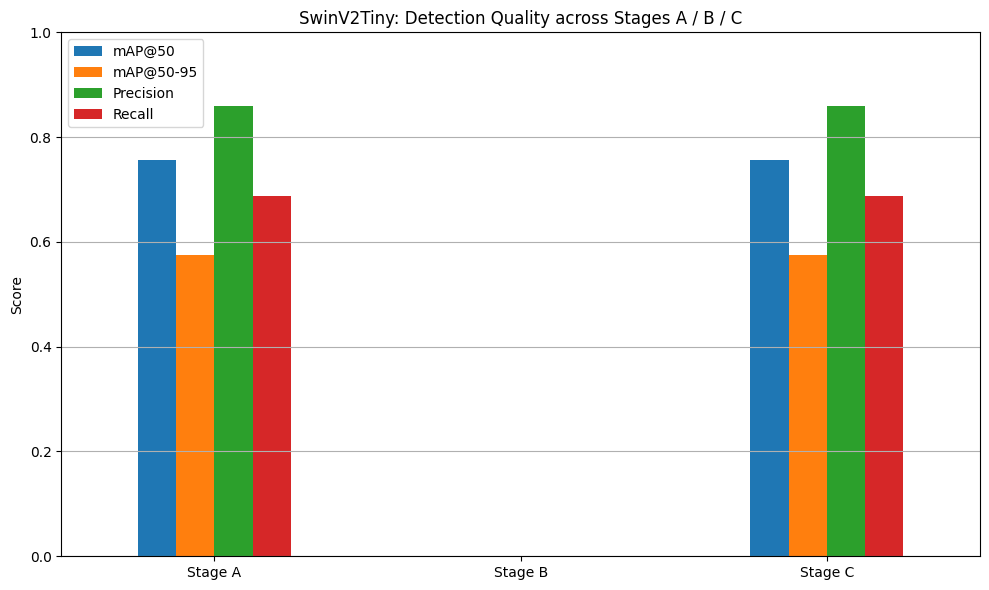

In [ ]:
import os, random, torch, torch.nn as nn, pandas as pd, matplotlib.pyplot as plt
import torchvision
from torchvision.transforms.functional import resize
from glob import glob
from tqdm import tqdm
from ultralytics import YOLO
from transformers import AutoTokenizer, AutoModel
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

device = "cuda" if torch.cuda.is_available() else "cpu"

def yolo_metrics(det_metrics):
    box = det_metrics.box
    return [float(box.map50), float(box.map), float(box.mp), float(box.mr)]

swin_stageA = YOLO("/content/yolo_swin_stageC_final (1).pt")
print("Evaluating Swin Stage A …")
swin_A_det = swin_stageA.val(
    data="/content/dataset_local.yaml", imgsz=224, batch=8, device=device, verbose=False
)
swin_A_metrics = yolo_metrics(swin_A_det)


swin_stageC = YOLO("/content/yolo_swin_stageC_final (1).pt")
print("Evaluating Swin Stage C …")
swin_C_det = swin_stageC.val(
    data="/content/dataset_local.yaml", imgsz=224, batch=8, device=device, verbose=False
)
swin_C_metrics = yolo_metrics(swin_C_det)

print(" Evaluating Swin Stage B (ViT + projector + MiniLM cosine)…")


vit = YOLO("/content/yolo_swin_final.pt").model.model[0].eval().to(device)
for p in vit.parameters(): p.requires_grad = False


class ProjectionHead(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(768, 256),
            nn.ReLU(),
            nn.Linear(256, 128)
        )
    def forward(self, x):
        return self.net(x)

projector = ProjectionHead().to(device)
projector.load_state_dict(torch.load("/content/projection_head_swinv2_contrastive.pt", map_location=device))
projector.eval()

tok = AutoTokenizer.from_pretrained("sentence-transformers/all-MiniLM-L6-v2")
txt = AutoModel.from_pretrained("sentence-transformers/all-MiniLM-L6-v2").eval().to(device)

@torch.no_grad()
def txt_embed(sentences):
    t = tok(sentences, padding=True, return_tensors="pt").to(device)
    return nn.functional.normalize(txt(**t).last_hidden_state[:, 0], dim=-1)

@torch.no_grad()
def img_embed(img):
    """ img: (1,3,224,224) → pooled (1,768) → (1,128) """
    feat = vit(img)[-1]
    pooled = feat.mean((-2, -1))
    return nn.functional.normalize(projector(pooled), dim=-1)


IMG_DIR = "/content/images"
LBL_DIR = "/content/labels"
idx2cap = {0: "blazing fire", 1: "rising smoke", 2: "scene with no fire"}

paths = [
    p for p in glob(f"{IMG_DIR}/*.*")
    if os.path.exists(f"{LBL_DIR}/{os.path.splitext(os.path.basename(p))[0]}.txt")
]
random.shuffle(paths)

text_vecs = txt_embed(list(idx2cap.values()))
true_lbls, pred_lbls = [], []


for p in tqdm(paths, desc="Stage B images"):
    try:
        img = torchvision.io.read_image(p)[:3] / 255.
        if img.shape[0] != 3:
            continue
        img = resize(img, [224, 224]).unsqueeze(0).to(device)
        lbl = int(open(f"{LBL_DIR}/{os.path.splitext(os.path.basename(p))[0]}.txt").read().split()[0])
        sim = (img_embed(img) @ text_vecs.T).squeeze(0)
        pred = sim.argmax().item()
        true_lbls.append(lbl)
        pred_lbls.append(pred)
    except Exception as e:
        print("skip", p, e)


acc  = accuracy_score(true_lbls, pred_lbls)
f1   = f1_score(true_lbls, pred_lbls, average="macro")
prec = precision_score(true_lbls, pred_lbls, average="macro")
rec  = recall_score(true_lbls, pred_lbls, average="macro")
swin_B_metrics = [acc, f1, prec, rec]


labels = ["mAP@50", "mAP@50‑95", "Precision", "Recall"]
df_swin = pd.DataFrame(
    [swin_A_metrics, swin_B_metrics, swin_C_metrics],
    index=["Stage A", "Stage B", "Stage C"],
    columns=labels,
)

print("\n=== SwinV2Tiny Stage A → B → C ===")
print(df_swin.round(3))

ax = df_swin.plot(kind="bar", figsize=(10, 6), rot=0)
ax.set_title("SwinV2Tiny: Detection Quality across Stages A / B / C")
ax.set_ylabel("Score")
ax.set_ylim(0, 1.0)
ax.grid(True, axis="y")
plt.tight_layout()
plt.show()


▶ Evaluating MobileViT Stage A …
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2282.6±834.1 MB/s, size: 164.9 KB)


val: Scanning /content/dataset/labels/val.cache... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<?, ?it/s]

val: /content/dataset/images/val/WEB07199.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07271.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07561.jpg: corrupt JPEG restored and saved



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:08<00:00, 13.25it/s]


                   all        900       1676       0.78      0.692      0.713      0.544
Speed: 0.1ms preprocess, 2.3ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/detect/val22
▶ Evaluating MobileViT Stage C …
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 887.4±630.7 MB/s, size: 128.8 KB)


val: Scanning /content/dataset/labels/val.cache... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<?, ?it/s]

val: /content/dataset/images/val/WEB07199.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07271.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07561.jpg: corrupt JPEG restored and saved



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:08<00:00, 13.47it/s]


                   all        900       1676      0.813      0.709      0.749      0.574
Speed: 0.1ms preprocess, 2.2ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/val23
▶ Evaluating MobileViT Stage B (ViT + projector + MiniLM cosine)…


Stage B images:   0%|          | 16/9000 [00:00<01:54, 78.35it/s]

skip /content/images/AoF04490.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1759.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0567.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1359.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06699.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06903.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2502.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06337.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06202.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05498.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05915.jpg 

Stage B images:   0%|          | 26/9000 [00:00<01:44, 86.28it/s]

skip /content/images/nonfire_0192.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05802.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0888.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0471.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07654.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2150.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0411.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1045.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04924.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1690.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/n

Stage B images:   0%|          | 45/9000 [00:00<01:42, 87.62it/s]

skip /content/images/AoF06679.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06013.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1651.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1630.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04323.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06027.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04611.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2292.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2951.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0595.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04867.

Stage B images:   1%|          | 67/9000 [00:00<01:35, 93.78it/s]

skip /content/images/nonfire_1335.jpg Expected 3D (unbatched) or 4D (batched) input to conv2d, but got input of size: [1, 3, 3, 224, 224]
skip /content/images/WEB08740.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2920.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1795.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05953.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04356.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04456.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05533.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06487.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2342.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x

Stage B images:   1%|          | 90/9000 [00:00<01:29, 99.89it/s] 

skip /content/images/WEB07282.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0967.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2348.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2156.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05156.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0243.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0202.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05429.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04195.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08856.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1

Stage B images:   1%|▏         | 115/9000 [00:01<01:19, 111.15it/s]

skip /content/images/AoF06010.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03835.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1558.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0563.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05219.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06114.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08144.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2225.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0667.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05324.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05637.jpg 

Stage B images:   2%|▏         | 138/9000 [00:01<01:21, 108.82it/s]

skip /content/images/WEB07100.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07617.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0353.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06205.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00732.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04338.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2028.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04917.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04340.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08956.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_043

Stage B images:   2%|▏         | 164/9000 [00:01<01:21, 108.93it/s]

skip /content/images/WEB07057.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06610.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05282.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2680.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0670.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07999.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0620.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04171.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05181.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08198.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04450.jpg mat1

Stage B images:   2%|▏         | 176/9000 [00:01<01:30, 97.46it/s] 

skip /content/images/AoF04530.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04052.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04354.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07642.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07414.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04227.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07289.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1615.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08577.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2443.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0242.jpg mat1

Stage B images:   2%|▏         | 197/9000 [00:02<01:37, 90.03it/s]

skip /content/images/nonfire_1678.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2658.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2731.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2345.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05046.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05489.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09126.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2165.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05830.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1336.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09

Stage B images:   2%|▏         | 216/9000 [00:02<01:44, 83.78it/s]

skip /content/images/WEB05574.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09238.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07443.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0650.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00229.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0533.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04881.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1549.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0672.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05249.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/non

Stage B images:   3%|▎         | 237/9000 [00:02<01:37, 89.93it/s]

skip /content/images/WEB06750.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03869.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05012.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0619.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07429.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2133.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2357.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1910.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05512.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2903.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1

Stage B images:   3%|▎         | 261/9000 [00:02<01:26, 101.48it/s]

skip /content/images/nonfire_1868.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04851.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0528.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05370.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06520.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2697.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08433.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08540.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0041.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06238.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2305.

Stage B images:   3%|▎         | 276/9000 [00:02<01:19, 110.17it/s]

skip /content/images/WEB06615.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0993.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04413.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05424.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2962.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08312.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0930.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1501.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05833.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08181.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09232.jpg 

Stage B images:   3%|▎         | 299/9000 [00:03<01:28, 97.84it/s] 

skip /content/images/nonfire_1871.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05876.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0162.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00632.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07738.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05913.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0133.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1818.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06685.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05488.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/non

Stage B images:   4%|▎         | 323/9000 [00:03<01:30, 95.76it/s] 

skip /content/images/nonfire_0935.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05151.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07988.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04372.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06176.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05668.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04747.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07131.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06098.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04893.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05313.jpg mat1 and mat

Stage B images:   4%|▍         | 349/9000 [00:03<01:20, 107.01it/s]

skip /content/images/AoF04729.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08314.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07154.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00617.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04233.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0024.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2109.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0267.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06975.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04617.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB0545

Stage B images:   4%|▍         | 360/9000 [00:03<01:26, 100.29it/s]

skip /content/images/PublicDataset00560.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07510.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05079.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09185.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06358.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2334.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08339.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04777.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08064.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04873.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06987.jpg ma

Stage B images:   4%|▍         | 383/9000 [00:03<01:24, 102.24it/s]

skip /content/images/nonfire_2137.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04863.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2552.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07373.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08046.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06387.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0787.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05624.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0902.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0320.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05254.

Stage B images:   4%|▍         | 405/9000 [00:04<01:36, 88.78it/s] 

skip /content/images/nonfire_2416.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06168.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0258.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05796.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06469.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05401.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2199.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2828.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06465.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06382.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03830.jpg 

Stage B images:   5%|▍         | 415/9000 [00:04<01:49, 78.36it/s]

skip /content/images/nonfire_0705.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0222.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06484.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00649.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04241.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04882.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0218.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1691.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07543.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04357.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF

Stage B images:   5%|▍         | 437/9000 [00:04<01:39, 86.43it/s]

skip /content/images/WEB04071.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06272.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04287.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05633.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0865.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06943.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06372.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1068.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09276.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07303.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08227.jpg mat1 and

Stage B images:   5%|▌         | 461/9000 [00:04<01:30, 93.89it/s]

skip /content/images/nonfire_1392.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04790.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1573.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1570.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06587.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05976.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2936.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06697.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05940.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08826.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04264.jpg 

Stage B images:   5%|▌         | 485/9000 [00:05<01:23, 102.04it/s]

skip /content/images/AoF04387.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0718.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05150.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06303.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05007.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09373.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04769.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1073.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08231.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05096.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0425.jpg mat1

Stage B images:   6%|▌         | 511/9000 [00:05<01:14, 113.94it/s]

skip /content/images/WEB05031.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07819.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08166.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04794.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1585.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2679.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1808.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2547.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0661.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1551.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06

Stage B images:   6%|▌         | 534/9000 [00:05<01:22, 102.14it/s]

skip /content/images/AoF05711.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04182.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05416.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05359.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06675.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0539.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07521.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04484.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00767.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04237.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04807.jpg ma

Stage B images:   6%|▌         | 546/9000 [00:05<01:19, 106.86it/s]

skip /content/images/WEB07046.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05444.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09220.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0051.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06687.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1096.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08747.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1733.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05943.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07666.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05675.jpg mat1

Stage B images:   6%|▋         | 568/9000 [00:05<01:24, 99.68it/s]

skip /content/images/WEB05473.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04186.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05217.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0832.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0072.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2667.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00399.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06405.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2970.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04142.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB

Stage B images:   7%|▋         | 588/9000 [00:06<01:48, 77.58it/s]

skip /content/images/nonfire_1778.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0814.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08137.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04923.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0357.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1486.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0266.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05213.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1144.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06977.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfi

Stage B images:   7%|▋         | 612/9000 [00:06<01:29, 93.49it/s]

skip /content/images/AoF06156.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04510.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04962.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1363.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04047.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08578.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08017.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06054.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06163.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08111.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1366.jpg mat1 and

Stage B images:   7%|▋         | 638/9000 [00:06<01:19, 105.31it/s]

skip /content/images/AoF06535.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05068.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1530.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08651.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00141.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06219.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06251.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2935.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06373.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00406.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/n

Stage B images:   7%|▋         | 661/9000 [00:06<01:17, 107.19it/s]

skip /content/images/AoF05041.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07076.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07784.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06285.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07650.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08256.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00388.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00785.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03911.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0511.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfi

Stage B images:   8%|▊         | 683/9000 [00:07<01:19, 105.03it/s]

skip /content/images/WEB04775.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2496.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00285.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0071.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05039.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06421.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08032.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2818.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09254.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06255.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire

Stage B images:   8%|▊         | 705/9000 [00:07<01:22, 100.81it/s]

skip /content/images/PublicDataset00844.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05347.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04152.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03716.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2520.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06077.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05571.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05707.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2715.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06565.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05828.jp

Stage B images:   8%|▊         | 727/9000 [00:07<01:20, 102.74it/s]

skip /content/images/nonfire_1267.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1117.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0306.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09096.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0379.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04405.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00400.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04611.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05152.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04486.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/non

Stage B images:   8%|▊         | 738/9000 [00:07<01:21, 101.44it/s]

skip /content/images/AoF06133.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06812.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04837.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05267.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05154.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2354.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0632.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05884.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06205.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08623.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08363.jpg mat1 and

Stage B images:   8%|▊         | 759/9000 [00:07<01:28, 92.92it/s]

skip /content/images/AoF05814.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1743.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB01946.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04634.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0081.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06199.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05869.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05758.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04833.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04206.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08259.jpg mat1 and

Stage B images:   9%|▊         | 782/9000 [00:08<01:23, 98.27it/s]

skip /content/images/WEB06776.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06206.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2098.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04038.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2237.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0029.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08110.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09045.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07300.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0924.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08006.jpg 

Stage B images:   9%|▉         | 804/9000 [00:08<01:24, 97.12it/s]

skip /content/images/WEB09399.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2795.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00539.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2463.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07366.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2883.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00571.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08317.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1393.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0943.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /cont

Stage B images:   9%|▉         | 828/9000 [00:08<01:16, 106.54it/s]

skip /content/images/AoF05817.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03764.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1611.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07450.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08739.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06449.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00252.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1732.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0838.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08319.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB0795

Stage B images:   9%|▉         | 852/9000 [00:08<01:17, 104.88it/s]

skip /content/images/AoF06266.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2349.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08192.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2409.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05563.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04056.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07973.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05198.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1666.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08873.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0997.jpg 

Stage B images:  10%|▉         | 863/9000 [00:08<01:24, 96.79it/s] 

skip /content/images/AoF05034.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2516.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2604.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2824.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06737.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06172.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04324.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00535.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05415.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04329.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF0449

Stage B images:  10%|▉         | 884/9000 [00:09<01:37, 83.00it/s]

skip /content/images/nonfire_0741.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04484.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04068.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1315.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05395.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05088.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2411.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05814.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04327.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03896.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset0085

Stage B images:  10%|▉         | 893/9000 [00:09<01:36, 84.42it/s]

skip /content/images/WEB04053.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05304.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05860.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1758.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05789.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1752.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04616.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08534.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04709.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1773.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset0066

Stage B images:  10%|█         | 911/9000 [00:09<01:45, 76.85it/s]

skip /content/images/WEB05640.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0113.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06158.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1507.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04791.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06348.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08030.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0061.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2149.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0375.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1

Stage B images:  10%|█         | 920/9000 [00:09<01:44, 77.32it/s]

skip /content/images/AoF06080.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1164.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0224.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06621.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05074.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0137.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06352.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06397.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00669.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2675.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)


Stage B images:  10%|█         | 934/9000 [00:10<05:22, 25.01it/s]

skip /content/images/nonfire_1828.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03726.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00445.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05132.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04177.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08917.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08491.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08724.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06472.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07353.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0455.jp

Stage B images:  11%|█         | 948/9000 [00:11<03:43, 35.99it/s]

skip /content/images/AoF04203.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04991.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1980.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2725.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2236.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0988.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05495.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0535.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1239.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05564.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04

Stage B images:  11%|█         | 964/9000 [00:11<02:42, 49.46it/s]

skip /content/images/WEB05325.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06326.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05460.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1206.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09074.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04496.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07358.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2740.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00073.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2831.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF0572

Stage B images:  11%|█         | 980/9000 [00:11<02:17, 58.25it/s]

skip /content/images/AoF06541.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04841.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05699.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1484.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05885.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2967.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00412.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2563.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00072.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06105.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/imag

Stage B images:  11%|█         | 988/9000 [00:11<02:18, 57.98it/s]

skip /content/images/AoF04440.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04876.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06558.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09358.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09428.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05254.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05361.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2694.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1093.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06181.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04119.jpg mat1 and

Stage B images:  11%|█         | 1002/9000 [00:11<02:18, 57.91it/s]

skip /content/images/WEB09404.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08681.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07378.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1196.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04767.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03832.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0386.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06148.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2157.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05658.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1208.jpg 

Stage B images:  11%|█         | 1009/9000 [00:12<02:40, 49.82it/s]

skip /content/images/WEB07805.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06667.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2084.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06983.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0530.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07239.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1485.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03868.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00465.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1606.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF

Stage B images:  11%|█▏        | 1024/9000 [00:12<02:22, 55.98it/s]

skip /content/images/nonfire_1052.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04462.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0399.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04969.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06360.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08092.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04125.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07325.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07626.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04303.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08323.jpg mat1 and

Stage B images:  12%|█▏        | 1042/9000 [00:12<01:59, 66.34it/s]

skip /content/images/nonfire_1271.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2219.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1832.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07921.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06994.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2323.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05787.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04183.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05614.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0793.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05203.

Stage B images:  12%|█▏        | 1064/9000 [00:12<01:34, 83.95it/s]

skip /content/images/WEB06889.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1408.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06511.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09317.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07389.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06749.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0614.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07080.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00283.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05731.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_081

Stage B images:  12%|█▏        | 1086/9000 [00:12<01:29, 88.83it/s]

skip /content/images/AoF05334.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05178.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04397.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0645.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05683.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0193.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04599.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1133.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07200.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1165.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0939.

Stage B images:  12%|█▏        | 1106/9000 [00:13<01:29, 88.27it/s]

skip /content/images/WEB08332.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04447.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00493.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04675.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06657.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04631.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04942.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06149.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04834.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05573.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05670.jpg mat1 a

Stage B images:  13%|█▎        | 1129/9000 [00:13<01:19, 98.39it/s]

skip /content/images/nonfire_1954.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03793.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03948.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1390.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07801.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00370.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07600.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1383.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00290.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06314.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/imag

Stage B images:  13%|█▎        | 1151/9000 [00:13<01:18, 99.94it/s]

skip /content/images/AoF06513.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0950.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06308.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2029.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00428.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04971.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00228.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00288.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05403.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2128.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /co

Stage B images:  13%|█▎        | 1172/9000 [00:13<01:21, 96.48it/s]

skip /content/images/AoF04796.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06662.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1687.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05125.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1381.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09087.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04549.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07599.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04361.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05630.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07499.jpg mat1 and

Stage B images:  13%|█▎        | 1199/9000 [00:14<01:08, 113.28it/s]

skip /content/images/nonfire_0210.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04891.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00647.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00653.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00640.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05570.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2750.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00227.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09342.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1600.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256

Stage B images:  13%|█▎        | 1211/9000 [00:14<01:14, 104.56it/s]

skip /content/images/nonfire_0714.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2129.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1568.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1525.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07237.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05551.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05659.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05204.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05580.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2313.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03845.

Stage B images:  14%|█▎        | 1236/9000 [00:14<01:10, 110.12it/s]

skip /content/images/WEB07886.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09160.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0764.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1185.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05705.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08505.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00368.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04839.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0412.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08482.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB0749

Stage B images:  14%|█▍        | 1248/9000 [00:14<01:22, 93.54it/s] 

skip /content/images/AoF05150.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06026.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05644.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08307.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0220.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05542.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03867.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05180.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05629.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2168.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06505.jpg mat1 and

Stage B images:  14%|█▍        | 1271/9000 [00:14<01:22, 93.47it/s]

skip /content/images/nonfire_0918.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2100.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0492.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06527.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05394.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06862.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04788.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2753.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05208.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04751.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1545.

Stage B images:  14%|█▍        | 1296/9000 [00:15<01:11, 107.97it/s]

skip /content/images/WEB08125.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05992.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0424.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1872.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07488.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08189.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05300.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08291.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05859.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0392.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1301.jpg 

Stage B images:  15%|█▍        | 1319/9000 [00:15<01:14, 102.76it/s]

skip /content/images/nonfire_1126.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04615.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04971.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05919.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2441.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07707.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00182.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0307.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07573.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04325.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire

Stage B images:  15%|█▍        | 1344/9000 [00:15<01:12, 105.64it/s]

skip /content/images/AoF04905.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2868.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00787.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08488.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2346.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0723.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06660.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05741.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08943.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00696.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/imag

Stage B images:  15%|█▌        | 1355/9000 [00:15<01:13, 104.40it/s]

skip /content/images/AoF04607.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08701.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04348.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04990.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05979.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2088.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04632.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00744.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2558.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05627.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_107

Stage B images:  15%|█▌        | 1377/9000 [00:16<03:49, 33.24it/s]

skip /content/images/nonfire_1403.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0613.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04981.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06053.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0388.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2230.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1140.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04245.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03791.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06582.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05799.

Stage B images:  16%|█▌        | 1400/9000 [00:17<02:26, 51.90it/s]

skip /content/images/WEB08950.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1344.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2545.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2690.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00107.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08371.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08993.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04435.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04480.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05686.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire

Stage B images:  16%|█▌        | 1422/9000 [00:17<01:50, 68.82it/s]

skip /content/images/AoF05285.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04859.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06124.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05003.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06083.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05765.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2791.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00537.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00811.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08221.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfi

Stage B images:  16%|█▌        | 1444/9000 [00:17<01:33, 80.95it/s]

skip /content/images/PublicDataset00528.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00275.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2466.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06393.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06460.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06003.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2602.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1785.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00092.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0559.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip

Stage B images:  16%|█▋        | 1467/9000 [00:17<01:33, 80.81it/s]

skip /content/images/nonfire_2586.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08240.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05288.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08445.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04127.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2312.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09130.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0154.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2907.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04300.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2631.

Stage B images:  17%|█▋        | 1491/9000 [00:18<01:16, 97.82it/s]

skip /content/images/WEB06790.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0178.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04547.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1169.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08477.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05957.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05480.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06628.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00014.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04931.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04271.jp

Stage B images:  17%|█▋        | 1513/9000 [00:18<01:13, 101.29it/s]

skip /content/images/AoF05259.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04447.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0257.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09318.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0894.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07220.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2419.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0014.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05469.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07342.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0860.

Stage B images:  17%|█▋        | 1524/9000 [00:18<01:15, 98.38it/s] 

skip /content/images/AoF06362.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07330.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00758.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1318.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05478.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04543.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05375.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06879.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06311.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1793.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04976.jp

Stage B images:  17%|█▋        | 1554/9000 [00:18<01:06, 112.17it/s]

skip /content/images/WEB09343.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00041.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0669.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1775.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2940.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0979.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1529.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08147.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08452.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0958.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/im

Stage B images:  18%|█▊        | 1578/9000 [00:18<01:12, 103.05it/s]

skip /content/images/WEB05599.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2770.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04261.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07055.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04312.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1270.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04650.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2161.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03910.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0157.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07588.jpg 

Stage B images:  18%|█▊        | 1601/9000 [00:19<01:10, 104.22it/s]

skip /content/images/AoF06482.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2491.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1863.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05742.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2333.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2848.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05201.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0269.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0933.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00723.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/im

Stage B images:  18%|█▊        | 1613/9000 [00:19<01:08, 107.43it/s]

skip /content/images/WEB04390.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07089.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04459.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00534.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00339.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0546.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06554.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04890.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1256.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1432.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/imag

Stage B images:  18%|█▊        | 1636/9000 [00:19<01:08, 107.19it/s]

skip /content/images/AoF05581.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1881.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2002.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04653.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04472.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05249.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1557.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05704.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05906.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1972.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05212.jpg 

Stage B images:  19%|█▊        | 1667/9000 [00:19<01:00, 121.20it/s]

skip /content/images/WEB07152.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06497.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1248.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2855.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0561.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08102.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00516.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08744.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08117.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08258.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire

Stage B images:  19%|█▊        | 1680/9000 [00:19<01:13, 99.67it/s] 

skip /content/images/AoF04127.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00839.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1084.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2886.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04135.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0623.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04155.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04365.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2118.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06159.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/non

Stage B images:  19%|█▉        | 1702/9000 [00:20<01:14, 97.36it/s]

skip /content/images/WEB06499.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05457.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2067.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1516.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04047.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05704.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1909.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2402.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08621.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07213.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06542.jpg 

Stage B images:  19%|█▉        | 1724/9000 [00:20<01:13, 98.62it/s]

skip /content/images/WEB05623.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1583.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06640.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07873.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05166.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05811.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0393.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0843.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04722.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05316.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08004.jpg mat1

Stage B images:  19%|█▉        | 1753/9000 [00:20<01:02, 115.08it/s]

skip /content/images/PublicDataset00344.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1601.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04494.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1249.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0566.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04810.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1746.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0823.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06277.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04418.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images

Stage B images:  20%|█▉        | 1779/9000 [00:20<01:01, 117.39it/s]

skip /content/images/WEB09324.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04827.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0009.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1510.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06571.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06080.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06976.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05141.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1413.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06133.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07596.jpg mat1

Stage B images:  20%|█▉        | 1791/9000 [00:20<01:11, 101.11it/s]

skip /content/images/AoF04364.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1343.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08675.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06096.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1603.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05538.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06212.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05061.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03733.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04023.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1321.jpg mat1

Stage B images:  20%|██        | 1813/9000 [00:21<01:27, 82.24it/s]

skip /content/images/nonfire_2145.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04422.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05508.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05072.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1406.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04418.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05657.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08967.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00836.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07043.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDatas

Stage B images:  20%|██        | 1836/9000 [00:21<01:19, 90.27it/s]

skip /content/images/WEB03849.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1434.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08810.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1387.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05998.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1302.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07396.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0951.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07381.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04153.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05346.jpg 

Stage B images:  21%|██        | 1860/9000 [00:21<01:12, 98.87it/s]

skip /content/images/WEB03745.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1787.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1008.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1013.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0731.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07734.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1097.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04269.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05102.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05643.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0

Stage B images:  21%|██        | 1871/9000 [00:21<01:17, 92.34it/s]

skip /content/images/AoF04131.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0384.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07116.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06513.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06745.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00418.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08555.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06026.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2806.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05182.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04632.jp

Stage B images:  21%|██        | 1899/9000 [00:22<01:04, 110.15it/s]

skip /content/images/WEB04992.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2999.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09365.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0077.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00523.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00538.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2263.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0772.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04355.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0385.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /cont

Stage B images:  21%|██▏       | 1922/9000 [00:22<01:09, 101.98it/s]

skip /content/images/nonfire_0012.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2233.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1533.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07806.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03880.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2707.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04808.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03889.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1244.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04610.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06426.

Stage B images:  22%|██▏       | 1943/9000 [00:22<01:16, 91.92it/s]

skip /content/images/WEB07843.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0382.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09186.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03694.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0923.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1123.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1457.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05688.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0687.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2385.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfi

Stage B images:  22%|██▏       | 1953/9000 [00:22<01:23, 84.10it/s]

skip /content/images/nonfire_2756.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09182.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08503.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06744.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06207.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0833.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1100.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2644.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00201.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09239.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/non

Stage B images:  22%|██▏       | 1971/9000 [00:23<01:40, 70.28it/s]

skip /content/images/WEB07978.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06428.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04241.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09192.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05519.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04353.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04898.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07592.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07582.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07932.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08200.jpg mat1 and mat2 sh

Stage B images:  22%|██▏       | 1979/9000 [00:23<01:39, 70.85it/s]

skip /content/images/AoF05138.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05385.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07507.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08089.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1303.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0316.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00786.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1443.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05908.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1257.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB

Stage B images:  22%|██▏       | 1995/9000 [00:23<01:41, 68.71it/s]

skip /content/images/AoF05265.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07087.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0554.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2975.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1477.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05042.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07970.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04941.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04750.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00027.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB0738

Stage B images:  22%|██▏       | 2011/9000 [00:23<01:40, 69.58it/s]

skip /content/images/AoF06040.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset01021.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06622.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07788.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1104.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04998.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05380.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00143.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07059.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08381.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05

Stage B images:  23%|██▎       | 2029/9000 [00:23<01:35, 72.65it/s]

skip /content/images/AoF05247.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08672.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06671.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00136.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00030.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07037.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07711.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06618.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07941.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06349.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08796.

Stage B images:  23%|██▎       | 2045/9000 [00:24<01:37, 71.56it/s]

skip /content/images/AoF05882.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2131.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05099.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04621.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2708.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00247.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2569.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06321.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1445.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04719.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF

Stage B images:  23%|██▎       | 2053/9000 [00:24<01:50, 62.73it/s]

skip /content/images/WEB06009.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07464.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05692.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07083.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2273.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04620.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08153.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1656.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0074.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04202.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)


Stage B images:  23%|██▎       | 2068/9000 [00:24<01:56, 59.71it/s]

skip /content/images/AoF06296.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0044.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07717.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0851.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0760.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07026.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2460.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0440.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05479.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08985.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06032.

Stage B images:  23%|██▎       | 2082/9000 [00:24<01:58, 58.56it/s]

skip /content/images/AoF06328.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0087.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04770.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06008.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08833.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08031.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05528.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04638.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04436.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0115.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05458.jpg mat1 and

Stage B images:  23%|██▎       | 2095/9000 [00:24<01:54, 60.14it/s]

skip /content/images/nonfire_2518.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06045.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0701.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07836.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08536.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06533.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05868.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04283.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1149.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2319.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2274.

Stage B images:  23%|██▎       | 2104/9000 [00:25<01:47, 63.90it/s]

skip /content/images/AoF04828.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06609.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00768.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08635.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1607.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00166.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0062.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1649.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06192.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06543.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/imag

Stage B images:  24%|██▎       | 2120/9000 [00:25<01:47, 63.96it/s]

skip /content/images/WEB08145.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05894.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1859.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05190.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04740.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06297.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04974.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08890.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05838.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1353.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)


Stage B images:  24%|██▎       | 2137/9000 [00:25<01:35, 71.84it/s]

skip /content/images/AoF05116.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05108.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1639.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07352.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04560.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06674.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2512.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09014.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2968.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04912.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05381.jpg mat1

Stage B images:  24%|██▍       | 2150/9000 [00:25<01:18, 87.27it/s]

skip /content/images/AoF05719.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03859.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00187.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09119.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08412.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07922.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2846.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06166.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)


Stage B images:  24%|██▍       | 2172/9000 [00:26<02:48, 40.46it/s]

skip /content/images/nonfire_2003.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06008.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00374.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04463.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05418.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04897.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07254.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06069.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05475.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05315.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05733.jpg ma

Stage B images:  24%|██▍       | 2193/9000 [00:26<01:54, 59.20it/s]

skip /content/images/AoF05390.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06313.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07851.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04352.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06628.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2744.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09165.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06068.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2660.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2960.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0381.jpg 

Stage B images:  25%|██▍       | 2213/9000 [00:27<01:33, 72.49it/s]

skip /content/images/WEB05357.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2390.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08827.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0130.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06450.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2473.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05341.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08492.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04629.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2839.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0390.

Stage B images:  25%|██▍       | 2239/9000 [00:27<01:13, 91.76it/s]

skip /content/images/nonfire_0630.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1176.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1277.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06572.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00395.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07897.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00289.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00548.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04332.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0983.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip

Stage B images:  25%|██▌       | 2250/9000 [00:27<01:12, 92.69it/s]

skip /content/images/WEB03798.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06675.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00387.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1995.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05509.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00621.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04339.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2050.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05880.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05687.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/n

Stage B images:  25%|██▌       | 2272/9000 [00:27<01:10, 95.14it/s]

skip /content/images/WEB08467.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04402.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03973.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06283.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2360.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2437.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1626.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2947.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00852.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05270.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/non

Stage B images:  25%|██▌       | 2293/9000 [00:27<01:13, 91.28it/s]

skip /content/images/nonfire_1062.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07262.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06859.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0868.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05443.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06333.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08999.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0994.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00797.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09419.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire

Stage B images:  26%|██▌       | 2313/9000 [00:28<01:18, 84.66it/s]

skip /content/images/AoF04266.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00103.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05868.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04230.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06536.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07056.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06019.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05170.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2258.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1667.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08000.jp

Stage B images:  26%|██▌       | 2336/9000 [00:28<01:10, 94.80it/s]

skip /content/images/PublicDataset00827.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2527.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00200.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08404.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0531.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2281.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06217.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06572.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08973.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1272.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/

Stage B images:  26%|██▌       | 2360/9000 [00:28<01:02, 106.56it/s]

skip /content/images/WEB07799.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1590.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06418.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1076.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06694.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06385.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06103.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06565.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06174.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04010.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06553.jpg mat1 and

Stage B images:  26%|██▋       | 2382/9000 [00:28<01:04, 102.81it/s]

skip /content/images/WEB06753.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05893.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05808.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04714.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07778.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0919.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05975.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05872.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05071.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0205.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2890.jpg mat1

Stage B images:  27%|██▋       | 2393/9000 [00:28<01:07, 98.08it/s] 

skip /content/images/AoF04207.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07528.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05000.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04830.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04926.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05943.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1747.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04210.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04863.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05331.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2250.jpg mat1 and

Stage B images:  27%|██▋       | 2418/9000 [00:29<00:59, 110.68it/s]

skip /content/images/nonfire_1240.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1589.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09035.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00497.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03939.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2455.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05994.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2609.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0350.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05932.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images

Stage B images:  27%|██▋       | 2443/9000 [00:29<01:02, 105.56it/s]

skip /content/images/nonfire_2978.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0352.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06495.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2217.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04404.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1312.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04269.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00641.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03778.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05306.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF

Stage B images:  27%|██▋       | 2465/9000 [00:29<01:05, 99.52it/s]

skip /content/images/nonfire_1351.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07209.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04569.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05473.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09139.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06543.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08531.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1886.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04628.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04205.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06372.jpg mat1 and

Stage B images:  28%|██▊       | 2488/9000 [00:29<01:01, 106.16it/s]

skip /content/images/nonfire_1398.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03837.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07977.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1711.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00644.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06508.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05711.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06653.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06204.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00231.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/W

Stage B images:  28%|██▊       | 2510/9000 [00:29<01:03, 102.44it/s]

skip /content/images/WEB03724.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2591.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2486.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08024.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0853.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06528.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2396.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2534.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08435.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04643.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05905.

Stage B images:  28%|██▊       | 2532/9000 [00:30<01:02, 103.14it/s]

skip /content/images/WEB06186.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2768.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00581.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09167.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06394.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1679.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1460.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04054.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05379.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09183.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF0489

Stage B images:  28%|██▊       | 2543/9000 [00:30<01:03, 102.13it/s]

skip /content/images/AoF05238.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05113.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08007.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00605.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0828.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06909.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04591.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06332.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06668.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06198.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1870.jp

Stage B images:  29%|██▊       | 2566/9000 [00:30<01:03, 102.09it/s]

skip /content/images/WEB03863.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00137.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07894.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06375.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2453.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09137.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0219.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0899.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04572.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1898.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB

Stage B images:  29%|██▉       | 2591/9000 [00:30<00:58, 110.40it/s]

skip /content/images/WEB06292.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05834.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1901.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0122.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1689.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2393.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0789.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07786.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00335.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2871.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/im

Stage B images:  29%|██▉       | 2616/9000 [00:30<00:59, 106.77it/s]

skip /content/images/WEB05586.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04120.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00544.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09310.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0675.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07575.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04583.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07849.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00386.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2849.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/A

Stage B images:  29%|██▉       | 2639/9000 [00:31<01:03, 99.56it/s]

skip /content/images/AoF05591.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2407.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05038.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05966.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06376.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06853.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07827.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2772.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06145.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05450.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1522.jpg mat1

Stage B images:  30%|██▉       | 2663/9000 [00:31<01:00, 104.10it/s]

skip /content/images/AoF04285.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2921.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09127.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09030.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05806.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08439.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09215.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07558.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04967.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08846.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07448.jpg mat1 and mat

Stage B images:  30%|██▉       | 2684/9000 [00:31<01:20, 78.07it/s]

skip /content/images/AoF05679.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2141.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0540.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1837.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00411.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05075.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00423.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1627.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06051.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0259.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /cont

Stage B images:  30%|███       | 2706/9000 [00:32<01:10, 89.02it/s]

skip /content/images/AoF05126.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08293.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1172.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0518.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05153.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04248.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2601.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05282.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2398.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00184.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB

Stage B images:  30%|███       | 2726/9000 [00:32<01:12, 86.51it/s]

skip /content/images/nonfire_1878.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07571.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07420.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04974.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04217.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04079.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05470.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04730.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07223.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08508.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00554.jpg ma

Stage B images:  31%|███       | 2751/9000 [00:32<01:00, 102.90it/s]

skip /content/images/PublicDataset00195.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2760.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05380.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06707.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0204.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1170.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07976.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2350.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0664.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04259.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images

Stage B images:  31%|███       | 2762/9000 [00:32<01:11, 87.39it/s] 

skip /content/images/WEB04522.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06633.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04804.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06476.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06389.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07858.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2852.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1951.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0692.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07683.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset0078

Stage B images:  31%|███       | 2783/9000 [00:33<02:03, 50.43it/s]

skip /content/images/nonfire_2180.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06399.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06451.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2422.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06637.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08511.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05429.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04558.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08469.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1167.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset0049

Stage B images:  31%|███       | 2802/9000 [00:33<01:36, 63.95it/s]

skip /content/images/PublicDataset00025.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06743.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06646.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05782.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06370.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0281.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2188.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00475.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05114.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03818.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/n

Stage B images:  31%|███       | 2811/9000 [00:33<01:35, 64.74it/s]

skip /content/images/AoF06367.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00657.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1939.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05937.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2413.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09267.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1219.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06927.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0722.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07568.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF

Stage B images:  31%|███▏      | 2827/9000 [00:34<02:53, 35.63it/s]

skip /content/images/nonfire_2840.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04363.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06209.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1900.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04409.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1996.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06957.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09132.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05165.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1969.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08915.jpg 

Stage B images:  32%|███▏      | 2847/9000 [00:34<01:54, 53.67it/s]

skip /content/images/WEB07422.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04660.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04715.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1638.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05174.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06125.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0431.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05075.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06695.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07947.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0139.jpg mat1

Stage B images:  32%|███▏      | 2867/9000 [00:34<01:32, 66.13it/s]

skip /content/images/WEB06189.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1673.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08405.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1438.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05334.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05878.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05283.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1605.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05284.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00251.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire

Stage B images:  32%|███▏      | 2889/9000 [00:35<01:15, 81.18it/s]

skip /content/images/WEB06370.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08292.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00622.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09381.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2931.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00316.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1807.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0509.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1333.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06425.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/

Stage B images:  32%|███▏      | 2899/9000 [00:35<01:19, 76.67it/s]

skip /content/images/PublicDataset00847.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1846.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00354.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05873.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2272.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05606.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1751.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07025.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2922.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08757.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/

Stage B images:  32%|███▏      | 2922/9000 [00:35<01:05, 92.47it/s]

skip /content/images/WEB05997.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2979.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04113.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1655.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00324.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05560.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0004.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07980.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07482.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04628.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire

Stage B images:  33%|███▎      | 2941/9000 [00:35<01:20, 75.55it/s]

skip /content/images/AoF04970.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08794.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0403.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0377.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1721.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04573.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1038.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0998.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2699.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06537.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05

Stage B images:  33%|███▎      | 2959/9000 [00:36<01:15, 79.95it/s]

skip /content/images/nonfire_0334.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09083.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1762.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00656.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1703.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08224.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04471.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04727.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0261.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1650.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images

Stage B images:  33%|███▎      | 2968/9000 [00:36<01:19, 75.64it/s]

skip /content/images/WEB05404.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05744.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00394.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08788.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1843.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06124.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04886.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09417.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0922.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04931.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05350.jp

Stage B images:  33%|███▎      | 2984/9000 [00:36<01:29, 67.51it/s]

skip /content/images/WEB09262.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09397.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04636.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04089.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05338.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1850.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0598.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04497.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06839.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06627.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04987.jpg mat1 and

Stage B images:  33%|███▎      | 2991/9000 [00:36<01:41, 59.22it/s]

skip /content/images/WEB07301.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00521.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1151.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08612.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05630.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06533.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04265.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05396.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06233.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0804.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_275

Stage B images:  33%|███▎      | 3008/9000 [00:36<01:30, 65.88it/s]

skip /content/images/WEB06365.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03857.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03820.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0159.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1425.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1609.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05408.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08209.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00756.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0143.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF

Stage B images:  34%|███▎      | 3024/9000 [00:37<01:29, 66.76it/s]

skip /content/images/AoF04290.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05837.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1361.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06443.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08114.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09000.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04799.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07911.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05289.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08313.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0978.jpg mat1 and

Stage B images:  34%|███▍      | 3041/9000 [00:37<01:26, 68.97it/s]

skip /content/images/nonfire_1017.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04846.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08801.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06700.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00410.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00437.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1740.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06216.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06664.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1947.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/imag

Stage B images:  34%|███▍      | 3049/9000 [00:37<01:32, 64.42it/s]

skip /content/images/nonfire_2092.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05394.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08305.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05955.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05786.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00336.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08797.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05352.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09305.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06916.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)


Stage B images:  34%|███▍      | 3063/9000 [00:37<01:33, 63.18it/s]

skip /content/images/WEB05048.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0901.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00263.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06704.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0763.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0168.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03893.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04658.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00215.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06145.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/imag

Stage B images:  34%|███▍      | 3083/9000 [00:37<01:17, 76.58it/s]

skip /content/images/WEB07067.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06364.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05433.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06285.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04844.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05399.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1562.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07781.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0027.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00997.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09288.jp

Stage B images:  34%|███▍      | 3100/9000 [00:38<01:18, 74.76it/s]

skip /content/images/WEB07241.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2661.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04415.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03928.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07936.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1203.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0034.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05144.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00690.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1421.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB

Stage B images:  35%|███▍      | 3108/9000 [00:38<01:18, 75.16it/s]

skip /content/images/WEB05264.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06215.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0055.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08069.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00464.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1055.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06774.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04540.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05517.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1006.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB0441

Stage B images:  35%|███▍      | 3123/9000 [00:38<01:30, 65.29it/s]

skip /content/images/nonfire_2605.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09256.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0521.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset01051.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00385.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1876.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1142.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0929.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04118.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03782.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /cont

Stage B images:  35%|███▍      | 3138/9000 [00:38<01:31, 64.22it/s]

skip /content/images/AoF06336.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2327.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2076.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04476.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1882.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07505.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04401.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1347.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05159.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05852.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05363.jpg 

Stage B images:  35%|███▌      | 3159/9000 [00:38<01:09, 84.65it/s]

skip /content/images/AoF06169.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08986.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0608.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06789.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0495.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00159.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1584.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0886.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00158.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0571.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /cont

Stage B images:  35%|███▌      | 3182/9000 [00:39<00:59, 97.70it/s]

skip /content/images/nonfire_1567.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07618.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1683.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0725.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05436.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05110.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0223.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04121.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1722.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0588.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09

Stage B images:  36%|███▌      | 3211/9000 [00:40<01:53, 51.10it/s]

skip /content/images/nonfire_1565.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2810.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0427.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07494.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2588.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07402.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1677.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07963.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1431.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2493.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/n

Stage B images:  36%|███▌      | 3232/9000 [00:40<01:31, 63.06it/s]

skip /content/images/nonfire_1852.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00562.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07554.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04438.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04576.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05466.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06653.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06856.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08195.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2433.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07344.jp

Stage B images:  36%|███▌      | 3257/9000 [00:40<01:08, 83.95it/s]

skip /content/images/WEB05896.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1983.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06486.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0964.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05441.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0150.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1414.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00593.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04416.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08347.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/non

Stage B images:  36%|███▋      | 3279/9000 [00:40<01:03, 90.81it/s]

skip /content/images/nonfire_0323.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06160.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1897.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0874.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07742.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05073.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09422.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1274.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06060.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00031.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/non

Stage B images:  37%|███▋      | 3302/9000 [00:41<00:59, 96.27it/s]

skip /content/images/nonfire_0088.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08781.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07942.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06427.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05548.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05173.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04979.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00433.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04535.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04826.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00

Stage B images:  37%|███▋      | 3324/9000 [00:41<01:00, 93.92it/s]

skip /content/images/WEB03840.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06173.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06625.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04849.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08074.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1885.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2742.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0640.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04571.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05936.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06453.jpg mat1

Stage B images:  37%|███▋      | 3345/9000 [00:41<00:59, 95.63it/s]

skip /content/images/WEB07657.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04308.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0517.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07481.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0786.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0573.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04934.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06310.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04323.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1143.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06150.jpg 

Stage B images:  37%|███▋      | 3355/9000 [00:41<01:06, 85.28it/s]

skip /content/images/WEB03931.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06509.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06100.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04001.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04328.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04824.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2069.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06522.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08759.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06018.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1964.jpg mat1 and

Stage B images:  38%|███▊      | 3376/9000 [00:41<01:03, 88.55it/s]

skip /content/images/WEB06603.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06164.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04958.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2271.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05996.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1640.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07993.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2738.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07533.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05613.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06734.jpg mat1

Stage B images:  38%|███▊      | 3395/9000 [00:42<01:05, 85.37it/s]

skip /content/images/PublicDataset00753.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06451.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00783.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0715.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04376.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05818.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04565.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04350.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0881.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2420.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/imag

Stage B images:  38%|███▊      | 3404/9000 [00:42<01:12, 77.00it/s]

skip /content/images/WEB06201.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04197.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2834.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0859.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04666.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1854.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05250.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04345.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06663.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08072.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05859.jpg mat1

Stage B images:  38%|███▊      | 3426/9000 [00:42<01:07, 82.85it/s]

skip /content/images/nonfire_1745.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2981.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0604.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04291.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04672.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03941.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0681.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08318.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07205.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1817.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07387.

Stage B images:  38%|███▊      | 3453/9000 [00:42<00:54, 102.29it/s]

skip /content/images/WEB06179.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0395.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08443.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0896.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05155.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05971.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06252.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1848.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04600.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0083.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08582.jpg 

Stage B images:  39%|███▊      | 3475/9000 [00:42<00:59, 92.44it/s]

skip /content/images/AoF04371.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05651.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00513.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1966.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0769.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08995.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04483.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05527.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08156.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07004.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDatas

Stage B images:  39%|███▉      | 3499/9000 [00:43<00:57, 95.94it/s]

skip /content/images/WEB06689.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1065.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04619.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05514.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08965.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05791.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08909.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0802.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04587.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07627.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08570.jpg mat1 and

Stage B images:  39%|███▉      | 3521/9000 [00:43<00:56, 97.51it/s]

skip /content/images/nonfire_1706.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07472.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05417.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05993.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04746.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06031.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09032.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05774.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1534.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0589.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06323.jpg mat1

Stage B images:  39%|███▉      | 3547/9000 [00:43<00:49, 109.53it/s]

skip /content/images/WEB09320.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04518.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1378.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04680.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0060.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0856.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04157.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06654.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05923.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2102.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1784.

Stage B images:  40%|███▉      | 3559/9000 [00:43<00:53, 101.59it/s]

skip /content/images/nonfire_1535.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0719.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09180.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04762.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04901.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07540.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06178.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06624.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05694.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2287.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04796.jpg mat1

Stage B images:  40%|███▉      | 3583/9000 [00:43<00:50, 107.76it/s]

skip /content/images/AoF05810.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06127.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05875.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0503.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00039.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0005.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03712.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07183.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05209.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1532.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicD

Stage B images:  40%|████      | 3607/9000 [00:44<00:48, 110.24it/s]

skip /content/images/PublicDataset00522.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06650.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0086.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05731.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06764.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06073.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1041.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06044.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2989.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00393.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/imag

Stage B images:  40%|████      | 3631/9000 [00:44<00:51, 105.01it/s]

skip /content/images/nonfire_2590.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1560.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1213.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07670.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08666.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0182.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05414.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05186.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00079.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00223.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/

Stage B images:  41%|████      | 3653/9000 [00:44<00:54, 97.97it/s] 

skip /content/images/nonfire_2578.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05656.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2340.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2186.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05066.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05423.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00857.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1072.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06125.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1090.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images

Stage B images:  41%|████      | 3674/9000 [00:44<00:52, 101.39it/s]

skip /content/images/AoF06074.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06345.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1827.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2445.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06147.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00719.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04457.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08891.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2093.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07180.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire

Stage B images:  41%|████      | 3696/9000 [00:45<00:53, 99.97it/s]

skip /content/images/WEB06740.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08869.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04541.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0676.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1662.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03920.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08592.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1246.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06560.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04880.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04074.jpg mat1

Stage B images:  41%|████      | 3707/9000 [00:45<00:58, 89.74it/s]

skip /content/images/AoF04981.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05807.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07647.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0854.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0098.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05569.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05765.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05895.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00804.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04876.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_106

Stage B images:  41%|████▏     | 3726/9000 [00:45<01:01, 86.07it/s]

skip /content/images/AoF04232.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06459.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset01007.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08696.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04951.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07002.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06527.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07702.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07740.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1961.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04875.jpg ma

Stage B images:  42%|████▏     | 3745/9000 [00:45<00:59, 88.74it/s]

skip /content/images/AoF05510.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08068.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00790.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07270.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2051.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1720.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0021.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08966.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06097.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2337.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF

Stage B images:  42%|████▏     | 3767/9000 [00:45<00:53, 98.42it/s]

skip /content/images/nonfire_0165.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1021.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2068.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06066.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05681.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04818.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2506.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0890.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04894.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05115.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05501.

Stage B images:  42%|████▏     | 3790/9000 [00:46<00:52, 99.37it/s] 

skip /content/images/WEB03954.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04759.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0371.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0807.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04808.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1701.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07111.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04686.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0233.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1476.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2

Stage B images:  42%|████▏     | 3813/9000 [00:46<00:54, 95.68it/s] 

skip /content/images/WEB03807.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08148.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2613.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05067.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1851.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05673.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0329.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06686.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06552.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1180.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1454.

Stage B images:  43%|████▎     | 3833/9000 [00:46<00:56, 90.79it/s]

skip /content/images/AoF04234.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1298.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05333.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0847.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04997.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0606.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09409.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2330.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06849.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06104.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05916.jpg 

Stage B images:  43%|████▎     | 3854/9000 [00:46<00:55, 92.16it/s]

skip /content/images/nonfire_1519.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05423.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04299.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2827.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05245.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0245.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06120.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1285.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1925.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0475.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/Publi

Stage B images:  43%|████▎     | 3874/9000 [00:47<00:55, 92.20it/s]

skip /content/images/AoF05554.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04525.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0050.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0775.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00156.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0152.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2362.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0235.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04461.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05452.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images

Stage B images:  43%|████▎     | 3884/9000 [00:47<00:56, 90.71it/s]

skip /content/images/nonfire_1429.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08982.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1588.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00222.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00273.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1813.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05612.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2873.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2780.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00191.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)


Stage B images:  43%|████▎     | 3904/9000 [00:47<00:55, 91.19it/s]

skip /content/images/nonfire_2785.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05158.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0829.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00138.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07207.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04173.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1407.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04860.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1404.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1228.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images

Stage B images:  44%|████▎     | 3926/9000 [00:47<00:53, 95.58it/s]

skip /content/images/AoF04861.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06217.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0635.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1470.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1797.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07003.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0289.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04591.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00794.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05770.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB

Stage B images:  44%|████▍     | 3946/9000 [00:47<00:55, 91.77it/s]

skip /content/images/AoF05241.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1682.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1791.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04028.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05085.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05853.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06784.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2037.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09142.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1415.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04877.jpg 

Stage B images:  44%|████▍     | 3967/9000 [00:48<00:52, 96.45it/s]

skip /content/images/WEB08604.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04396.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2380.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1446.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04492.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1822.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05326.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00629.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07251.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05226.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire

Stage B images:  44%|████▍     | 3977/9000 [00:48<00:55, 89.70it/s]

skip /content/images/PublicDataset00314.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04797.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05037.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06735.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04998.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05300.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08087.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1671.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1307.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00081.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/W

Stage B images:  44%|████▍     | 4002/9000 [00:48<01:09, 72.42it/s]

skip /content/images/nonfire_2865.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2121.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0011.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0716.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06447.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06794.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04537.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06914.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07279.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09353.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2718.

Stage B images:  45%|████▍     | 4024/9000 [00:48<00:59, 83.88it/s]

skip /content/images/AoF05991.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06132.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1506.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05596.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00648.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2222.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1095.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08152.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06569.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0735.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/non

Stage B images:  45%|████▍     | 4043/9000 [00:49<01:04, 76.87it/s]

skip /content/images/WEB09104.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04868.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03996.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0926.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05777.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2898.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2670.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08884.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2774.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06094.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06324.jpg 

Stage B images:  45%|████▌     | 4052/9000 [00:49<01:13, 67.02it/s]

skip /content/images/AoF04399.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05735.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0042.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04792.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05329.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05093.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05409.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03758.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05767.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06519.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2540.jpg mat1 and

Stage B images:  45%|████▌     | 4060/9000 [00:49<01:14, 66.72it/s]

skip /content/images/WEB04283.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04785.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00545.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04330.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05531.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1222.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07308.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08947.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0008.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06039.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_281

Stage B images:  45%|████▌     | 4075/9000 [00:49<01:22, 59.40it/s]

skip /content/images/nonfire_2255.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04058.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06411.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08921.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05413.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1561.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09435.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04805.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04171.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04112.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0458.jpg mat1

Stage B images:  45%|████▌     | 4094/9000 [00:49<01:08, 71.20it/s]

skip /content/images/WEB06028.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0695.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09328.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2522.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04481.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1547.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08143.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00550.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08071.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07044.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB0804

Stage B images:  46%|████▌     | 4102/9000 [00:50<01:10, 69.61it/s]

skip /content/images/WEB09258.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0054.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09226.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08271.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2681.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05964.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06306.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05105.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05436.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07556.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08539.jpg mat1 and

Stage B images:  46%|████▌     | 4117/9000 [00:50<01:25, 57.43it/s]

skip /content/images/nonfire_2300.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05839.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04999.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06473.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2247.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2101.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1168.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04039.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03982.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)


Stage B images:  46%|████▌     | 4134/9000 [00:50<01:13, 66.38it/s]

skip /content/images/WEB07072.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2666.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05963.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0419.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2105.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1873.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05502.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08135.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08530.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2743.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04391.

Stage B images:  46%|████▌     | 4141/9000 [00:50<01:16, 63.89it/s]

skip /content/images/WEB04134.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07581.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1135.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0294.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07081.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05991.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06390.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05220.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2678.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06833.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset0100

Stage B images:  46%|████▌     | 4157/9000 [00:50<01:14, 64.88it/s]

skip /content/images/AoF06700.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1799.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0550.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05604.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08047.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04758.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06061.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04689.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06247.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2227.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1230.jpg 

Stage B images:  46%|████▋     | 4173/9000 [00:51<01:10, 68.08it/s]

skip /content/images/AoF05421.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2205.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1975.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07924.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04165.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0508.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0344.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0671.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06405.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05122.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDat

Stage B images:  47%|████▋     | 4190/9000 [00:51<01:03, 76.12it/s]

skip /content/images/AoF04840.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0551.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06236.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0883.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0520.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05806.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1877.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1238.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04792.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05148.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04141.

Stage B images:  47%|████▋     | 4207/9000 [00:51<01:05, 73.34it/s]

skip /content/images/WEB08708.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04695.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03776.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2061.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05078.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04858.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0629.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04936.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09306.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08871.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06778.jpg mat1 and

Stage B images:  47%|████▋     | 4225/9000 [00:51<01:00, 78.69it/s]

skip /content/images/AoF05021.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00188.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0594.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1085.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0149.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2446.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07340.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09019.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04282.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2465.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images

Stage B images:  47%|████▋     | 4233/9000 [00:51<01:10, 67.99it/s]

skip /content/images/WEB04784.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07428.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1269.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06440.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset01016.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2515.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05440.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07991.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0685.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04896.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire

Stage B images:  47%|████▋     | 4248/9000 [00:52<01:20, 58.85it/s]

skip /content/images/WEB06323.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0144.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0830.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0089.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05368.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2844.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00771.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03749.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08815.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05510.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/non

Stage B images:  47%|████▋     | 4268/9000 [00:52<01:03, 74.19it/s]

skip /content/images/AoF05732.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07576.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2013.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05895.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00820.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1780.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0512.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07001.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04304.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0780.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB

Stage B images:  48%|████▊     | 4289/9000 [00:52<00:54, 86.01it/s]

skip /content/images/WEB04102.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05565.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00853.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06334.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06024.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05846.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04657.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08079.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07360.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00586.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2

Stage B images:  48%|████▊     | 4307/9000 [00:52<00:55, 84.42it/s]

skip /content/images/WEB05695.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05866.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04253.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08449.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06469.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00177.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05230.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06756.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1229.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05245.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06099.jpg ma

Stage B images:  48%|████▊     | 4327/9000 [00:53<01:00, 77.42it/s]

skip /content/images/nonfire_1341.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06356.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04857.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09273.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06901.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05057.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1834.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07880.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04718.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04871.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08095.jpg mat1 and

Stage B images:  48%|████▊     | 4353/9000 [00:53<00:47, 97.28it/s]

skip /content/images/WEB05918.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09287.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00455.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1098.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07036.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09148.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04633.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2163.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07363.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04884.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_003

Stage B images:  49%|████▊     | 4374/9000 [00:53<00:48, 94.88it/s]

skip /content/images/nonfire_1492.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07923.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset01012.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06364.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07392.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05101.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2374.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07652.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06351.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05072.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_003

Stage B images:  49%|████▉     | 4396/9000 [00:53<00:47, 97.55it/s]

skip /content/images/WEB08421.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04966.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0643.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04619.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2351.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07075.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04978.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05069.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00148.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05724.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06225.jp

Stage B images:  49%|████▉     | 4420/9000 [00:54<00:43, 104.40it/s]

skip /content/images/WEB04488.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04043.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08584.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05885.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2074.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1469.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2191.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0229.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08395.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2498.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04877.

Stage B images:  49%|████▉     | 4431/9000 [00:54<00:45, 101.37it/s]

skip /content/images/AoF04448.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06840.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2727.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03956.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04250.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07335.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04454.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0124.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06689.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05792.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05248.jpg mat1 and

Stage B images:  49%|████▉     | 4452/9000 [00:54<00:47, 94.85it/s]

skip /content/images/WEB07421.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05907.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1997.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05102.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07813.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04045.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1737.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04144.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08150.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07277.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08425.jpg mat1 and

Stage B images:  50%|████▉     | 4476/9000 [00:54<00:43, 103.06it/s]

skip /content/images/WEB09098.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1330.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2787.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0416.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00337.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07409.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2619.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03711.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1924.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0171.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/im

Stage B images:  50%|█████     | 4503/9000 [00:54<00:41, 108.23it/s]

skip /content/images/WEB05649.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09385.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04501.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06051.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0056.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00639.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04366.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04969.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0962.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06413.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07701.jp

Stage B images:  50%|█████     | 4515/9000 [00:55<00:45, 99.57it/s] 

skip /content/images/WEB06990.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2063.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06148.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2884.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06333.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset01040.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0442.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03900.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05287.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1048.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB

Stage B images:  50%|█████     | 4537/9000 [00:55<00:50, 88.12it/s] 

skip /content/images/WEB06779.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06089.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0957.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05826.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1888.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1279.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03864.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04433.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07052.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1156.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09211.jpg 

Stage B images:  51%|█████     | 4551/9000 [00:55<00:46, 96.11it/s]

skip /content/images/WEB04841.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2435.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00301.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09249.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05015.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1064.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08175.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07333.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05756.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05507.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_224

Stage B images:  51%|█████     | 4575/9000 [00:55<00:42, 103.25it/s]

skip /content/images/AoF06638.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06175.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2091.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06326.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06331.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05399.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06108.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2959.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00486.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08521.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_219

Stage B images:  51%|█████     | 4601/9000 [00:55<00:39, 110.98it/s]

skip /content/images/WEB08352.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2726.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0607.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2885.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04278.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0105.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1845.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06336.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07881.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05970.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07860.

Stage B images:  51%|█████▏    | 4624/9000 [00:56<00:43, 101.41it/s]

skip /content/images/WEB07227.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1119.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05281.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05678.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00220.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1187.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08981.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04165.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0273.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04212.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire

Stage B images:  52%|█████▏    | 4646/9000 [00:56<00:43, 100.89it/s]

skip /content/images/AoF04089.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1082.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06130.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08489.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0264.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00126.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0347.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1505.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05128.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04126.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF

Stage B images:  52%|█████▏    | 4667/9000 [00:56<00:47, 91.34it/s]

skip /content/images/AoF06005.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05824.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0729.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06593.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04685.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03992.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07940.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0181.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1233.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06911.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05050.jpg mat1

Stage B images:  52%|█████▏    | 4694/9000 [00:56<00:39, 110.34it/s]

skip /content/images/WEB09363.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1643.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2220.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05805.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04946.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06023.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07451.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09430.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07135.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05726.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1231.jpg mat1

Stage B images:  52%|█████▏    | 4707/9000 [00:56<00:38, 112.07it/s]

skip /content/images/WEB04529.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1849.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05277.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05089.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04414.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2723.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2869.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2887.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0107.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0496.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/Publi

Stage B images:  53%|█████▎    | 4729/9000 [00:57<00:44, 95.39it/s]

skip /content/images/nonfire_0246.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06041.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06851.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06968.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05854.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05082.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04275.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05375.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00484.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05698.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2761.jp

Stage B images:  53%|█████▎    | 4749/9000 [00:57<00:45, 93.65it/s]

skip /content/images/AoF06420.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09240.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05749.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06212.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07567.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04823.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0568.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03843.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05654.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0932.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09072.jpg mat1 and

Stage B images:  53%|█████▎    | 4772/9000 [00:57<00:41, 103.03it/s]

skip /content/images/WEB05811.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07981.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07824.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset01038.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06601.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04493.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08185.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09208.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09338.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0798.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04674.jpg ma

Stage B images:  53%|█████▎    | 4795/9000 [00:57<00:39, 105.15it/s]

skip /content/images/AoF05260.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09112.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08311.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0659.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1935.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04622.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1657.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04139.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00042.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05400.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire

Stage B images:  54%|█████▎    | 4820/9000 [00:58<00:37, 110.81it/s]

skip /content/images/WEB08662.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05497.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00634.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1709.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05686.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00489.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0216.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2294.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04244.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00232.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /co

Stage B images:  54%|█████▎    | 4832/9000 [00:58<00:41, 100.54it/s]

skip /content/images/WEB03977.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07039.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06643.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05407.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0367.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04460.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0418.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06972.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06530.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00574.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_100

Stage B images:  54%|█████▍    | 4861/9000 [00:58<00:36, 113.17it/s]

skip /content/images/nonfire_2058.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00683.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05242.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06101.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05606.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1360.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04249.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00638.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06061.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0576.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/imag

Stage B images:  54%|█████▍    | 4873/9000 [00:58<00:38, 107.13it/s]

skip /content/images/WEB05798.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04151.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06234.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06524.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset01022.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05803.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00490.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0084.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04724.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04281.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)


Stage B images:  54%|█████▍    | 4895/9000 [00:59<01:04, 64.05it/s]

skip /content/images/nonfire_0185.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06007.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06244.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07413.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04320.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06461.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2080.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2135.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2841.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04475.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07341.jpg 

Stage B images:  55%|█████▍    | 4915/9000 [00:59<00:55, 73.81it/s]

skip /content/images/AoF05081.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2321.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1803.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0136.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06921.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07133.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0336.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00024.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06618.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2781.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images

Stage B images:  55%|█████▍    | 4942/9000 [00:59<00:42, 94.39it/s]

skip /content/images/WEB04084.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2045.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0605.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0908.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04993.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1009.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0938.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06279.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2615.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07782.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09

Stage B images:  55%|█████▌    | 4953/9000 [00:59<00:48, 82.77it/s]

skip /content/images/AoF06588.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00439.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1020.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1448.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0326.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0889.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04037.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04540.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06875.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06708.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB

Stage B images:  55%|█████▌    | 4981/9000 [00:59<00:39, 102.00it/s]

skip /content/images/nonfire_2286.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09201.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04986.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1342.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00616.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09015.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04957.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08602.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07971.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1451.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF0414

Stage B images:  55%|█████▌    | 4993/9000 [01:00<00:51, 77.57it/s] 

skip /content/images/WEB05595.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2158.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04933.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06758.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09020.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04691.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2358.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0900.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0022.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04964.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05773.jpg 

Stage B images:  56%|█████▌    | 5018/9000 [01:00<00:42, 94.73it/s]

skip /content/images/WEB07523.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1612.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05509.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05736.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07987.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05697.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08706.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2599.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05850.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1132.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04425.jpg mat1

Stage B images:  56%|█████▌    | 5029/9000 [01:00<00:43, 90.93it/s]

skip /content/images/nonfire_2376.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08201.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1352.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05216.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05383.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0356.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04204.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08880.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05577.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00501.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire

Stage B images:  56%|█████▌    | 5049/9000 [01:00<00:47, 83.17it/s]

skip /content/images/AoF06025.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1402.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06381.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2470.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06280.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04616.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05405.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05275.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07830.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06838.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0911.jpg mat1

Stage B images:  56%|█████▋    | 5070/9000 [01:01<00:45, 86.34it/s]

skip /content/images/WEB07426.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0600.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05691.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05988.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1489.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08919.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06728.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06500.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1136.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06335.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04985.jpg mat1

Stage B images:  56%|█████▋    | 5080/9000 [01:01<00:47, 82.59it/s]

skip /content/images/WEB08574.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03959.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05327.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06092.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06453.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0454.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2928.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2949.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00529.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2430.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB

Stage B images:  57%|█████▋    | 5090/9000 [01:01<00:45, 85.47it/s]

skip /content/images/AoF05631.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08029.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06434.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04701.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1148.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04281.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07960.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06616.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1637.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)


Stage B images:  57%|█████▋    | 5108/9000 [01:01<00:57, 67.15it/s]

skip /content/images/nonfire_1417.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08631.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2786.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1934.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04515.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07461.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2134.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04327.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08016.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08487.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06516.jpg 

Stage B images:  57%|█████▋    | 5128/9000 [01:01<00:47, 81.43it/s]

skip /content/images/WEB07395.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00318.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00304.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0308.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2359.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08315.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1071.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1386.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2039.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00067.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)


Stage B images:  57%|█████▋    | 5150/9000 [01:02<00:41, 92.05it/s]

skip /content/images/AoF05891.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05741.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1664.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset01008.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06648.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2429.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05947.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06441.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00718.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1782.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/imag

Stage B images:  57%|█████▊    | 5175/9000 [01:02<00:44, 85.35it/s] 

skip /content/images/WEB07496.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00511.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06481.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08715.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03725.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05572.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2176.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06262.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04206.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2442.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05354.jp

Stage B images:  58%|█████▊    | 5194/9000 [01:02<00:58, 64.57it/s]

skip /content/images/nonfire_1509.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0862.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0100.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09188.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00102.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1418.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2224.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07489.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0817.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00487.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /

Stage B images:  58%|█████▊    | 5212/9000 [01:03<00:52, 71.96it/s]

skip /content/images/WEB08088.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00613.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08807.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05492.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05136.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06644.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08806.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0464.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2778.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00434.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/n

Stage B images:  58%|█████▊    | 5228/9000 [01:03<00:53, 70.71it/s]

skip /content/images/WEB07739.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00850.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00353.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07914.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0821.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07506.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05202.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05146.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06721.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04280.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04

Stage B images:  58%|█████▊    | 5236/9000 [01:03<00:55, 67.76it/s]

skip /content/images/nonfire_2976.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1749.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1478.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06295.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2965.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2711.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2603.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0648.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0125.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06121.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/imag

Stage B images:  58%|█████▊    | 5255/9000 [01:03<00:47, 78.38it/s]

skip /content/images/nonfire_2458.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05837.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06056.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08863.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08217.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1010.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2249.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04083.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1528.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1857.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06356.

Stage B images:  59%|█████▊    | 5272/9000 [01:03<00:53, 69.80it/s]

skip /content/images/nonfire_2639.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04316.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0169.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0221.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2519.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05873.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06462.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06246.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2355.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05526.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0

Stage B images:  59%|█████▊    | 5280/9000 [01:04<01:01, 60.83it/s]

skip /content/images/WEB02176.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04214.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05579.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06406.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07708.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1731.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0359.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05910.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06709.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08852.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07678.jpg mat1 and

Stage B images:  59%|█████▉    | 5294/9000 [01:04<01:01, 60.68it/s]

skip /content/images/WEB08438.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05092.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00298.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0102.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05135.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1129.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05797.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0611.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04319.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07967.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB0939

Stage B images:  59%|█████▉    | 5314/9000 [01:04<00:50, 73.38it/s]

skip /content/images/AoF05898.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05921.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1183.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09237.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1659.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2507.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04505.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0469.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06741.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03979.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1399.

Stage B images:  59%|█████▉    | 5333/9000 [01:04<00:45, 80.72it/s]

skip /content/images/AoF05123.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2977.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2657.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0753.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07985.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0426.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00346.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00759.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07529.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2194.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /cont

Stage B images:  59%|█████▉    | 5342/9000 [01:05<02:01, 30.13it/s]

skip /content/images/nonfire_0164.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04816.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2010.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04528.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1959.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2993.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00688.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04782.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07350.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0467.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images

Stage B images:  60%|█████▉    | 5370/9000 [01:05<01:06, 54.56it/s]

skip /content/images/AoF05045.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0749.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09289.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05820.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00070.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05512.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08941.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05448.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2381.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05618.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03715.jp

Stage B images:  60%|█████▉    | 5381/9000 [01:05<00:55, 65.07it/s]

skip /content/images/nonfire_1786.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06491.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07904.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00061.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06615.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06403.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05718.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04887.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2896.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0534.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire

Stage B images:  60%|██████    | 5402/9000 [01:06<00:45, 79.38it/s]

skip /content/images/AoF05574.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04925.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04994.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04457.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07349.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00611.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1945.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1475.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04070.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08914.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_286

Stage B images:  60%|██████    | 5424/9000 [01:06<00:39, 89.53it/s]

skip /content/images/WEB05321.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0557.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04476.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04996.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1011.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04227.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00282.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00799.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0505.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00755.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /co

Stage B images:  61%|██████    | 5446/9000 [01:06<00:36, 98.42it/s]

skip /content/images/AoF05173.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1235.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08276.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04711.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08264.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08845.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04862.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1043.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08813.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07833.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2607.jpg mat1

Stage B images:  61%|██████    | 5467/9000 [01:06<00:40, 86.74it/s]

skip /content/images/nonfire_1365.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06510.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08850.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05647.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05231.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05468.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04752.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00003.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07915.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05730.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0343.jp

Stage B images:  61%|██████    | 5493/9000 [01:07<00:32, 106.67it/s]

skip /content/images/WEB08661.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04954.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08391.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00607.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07295.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03794.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1105.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2983.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05294.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05107.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06174.jp

Stage B images:  61%|██████    | 5505/9000 [01:07<00:37, 93.05it/s] 

skip /content/images/WEB08473.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06216.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03862.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07399.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00076.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2005.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2747.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06209.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00698.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04422.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/n

Stage B images:  61%|██████▏   | 5526/9000 [01:07<00:36, 95.50it/s]

skip /content/images/nonfire_2021.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09263.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05784.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0655.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04095.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2582.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04764.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07602.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07324.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04682.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset0070

Stage B images:  62%|██████▏   | 5546/9000 [01:07<00:38, 89.94it/s]

skip /content/images/nonfire_2891.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09079.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1880.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2243.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2850.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04968.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1237.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08866.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2754.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09301.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05

Stage B images:  62%|██████▏   | 5565/9000 [01:07<00:41, 83.70it/s]

skip /content/images/AoF06207.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05412.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05432.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06152.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0903.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09228.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0628.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1306.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00390.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07719.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF0406

Stage B images:  62%|██████▏   | 5585/9000 [01:08<00:39, 86.76it/s]

skip /content/images/AoF04075.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0489.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2476.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05920.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08158.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08782.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08415.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06534.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09076.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07177.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05652.jpg mat1 and

Stage B images:  62%|██████▏   | 5594/9000 [01:08<00:45, 74.22it/s]

skip /content/images/WEB05588.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06318.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2482.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05583.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04073.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2124.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06510.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07577.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04977.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07559.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2861.jpg mat1

Stage B images:  62%|██████▏   | 5612/9000 [01:08<00:44, 76.16it/s]

skip /content/images/AoF04514.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0910.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0324.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06243.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2735.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05675.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2627.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07009.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04941.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04525.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06190.jpg 

Stage B images:  63%|██████▎   | 5629/9000 [01:08<00:43, 77.76it/s]

skip /content/images/nonfire_2638.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07170.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2537.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05974.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06090.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2462.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05684.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05525.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07271.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00526.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicD

Stage B images:  63%|██████▎   | 5639/9000 [01:08<00:41, 81.50it/s]

skip /content/images/nonfire_0507.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1114.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04834.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08335.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06011.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06241.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03957.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04015.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08992.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0260.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05412.jpg mat1

Stage B images:  63%|██████▎   | 5660/9000 [01:09<00:42, 78.72it/s]

skip /content/images/WEB09361.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03720.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03914.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00384.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2629.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0091.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04738.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04462.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00118.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09095.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/W

Stage B images:  63%|██████▎   | 5680/9000 [01:09<00:38, 85.14it/s]

skip /content/images/WEB09346.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06047.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2426.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2805.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00145.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2570.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04009.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00440.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00494.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05552.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /co

Stage B images:  63%|██████▎   | 5698/9000 [01:09<00:42, 78.32it/s]

skip /content/images/AoF06650.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05446.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03767.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00754.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0234.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00694.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04098.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2592.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04302.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04195.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/A

Stage B images:  63%|██████▎   | 5712/9000 [01:09<00:35, 93.60it/s]

skip /content/images/WEB03995.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07401.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0523.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05952.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2511.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08878.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00671.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07148.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07017.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08267.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05110.jp

Stage B images:  64%|██████▎   | 5735/9000 [01:09<00:36, 90.46it/s]

skip /content/images/nonfire_2779.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1266.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0414.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00658.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1456.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04612.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06253.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07322.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09359.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09034.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB

Stage B images:  64%|██████▍   | 5757/9000 [01:10<00:33, 97.50it/s]

skip /content/images/WEB03892.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0189.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06341.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08952.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0513.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2576.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08250.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06629.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06268.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06912.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04909.jpg mat1

Stage B images:  64%|██████▍   | 5778/9000 [01:10<00:34, 93.71it/s]

skip /content/images/WEB04012.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07537.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0577.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0690.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1099.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0300.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04516.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0209.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03853.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04164.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1

Stage B images:  64%|██████▍   | 5798/9000 [01:10<00:36, 88.49it/s]

skip /content/images/nonfire_0835.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06473.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2202.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05030.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0340.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08749.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04647.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2170.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05611.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2933.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06430.

Stage B images:  65%|██████▍   | 5816/9000 [01:10<00:36, 87.99it/s]

skip /content/images/PublicDataset01010.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08255.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03947.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08594.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05218.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05592.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07751.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08470.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06682.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1973.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06271.jpg ma

Stage B images:  65%|██████▍   | 5834/9000 [01:11<00:36, 87.37it/s]

skip /content/images/nonfire_0737.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04580.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04169.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07861.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04404.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05193.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0785.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03962.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05698.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00028.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_281

Stage B images:  65%|██████▌   | 5853/9000 [01:11<00:36, 86.82it/s]

skip /content/images/nonfire_2320.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05019.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2911.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05195.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06433.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0472.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1779.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04553.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2665.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03890.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04955.

Stage B images:  65%|██████▌   | 5872/9000 [01:11<00:34, 89.44it/s]

skip /content/images/nonfire_0161.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07513.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06337.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05778.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09434.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04114.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03779.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1487.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05435.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05790.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05127.jpg mat1 and

Stage B images:  65%|██████▌   | 5883/9000 [01:11<00:33, 92.65it/s]

skip /content/images/WEB08106.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2179.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05134.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05499.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00149.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1700.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05217.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04129.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05500.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08238.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08296.jp

Stage B images:  66%|██████▌   | 5903/9000 [01:11<00:35, 88.35it/s]

skip /content/images/AoF05147.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03903.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08775.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08538.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1490.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08847.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0549.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05870.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06532.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04511.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04156.jpg mat1 and

Stage B images:  66%|██████▌   | 5922/9000 [01:12<00:36, 85.16it/s]

skip /content/images/AoF05646.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09016.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04760.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05314.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2421.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0283.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2336.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0801.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04008.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00135.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/non

Stage B images:  66%|██████▌   | 5942/9000 [01:12<00:34, 89.56it/s]

skip /content/images/AoF06419.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2322.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04310.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2880.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1039.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07765.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1329.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0627.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2944.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1369.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/A

Stage B images:  66%|██████▋   | 5963/9000 [01:12<00:32, 92.37it/s]

skip /content/images/AoF06604.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03757.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05494.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0618.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0452.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05337.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06325.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09382.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09039.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2673.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0526.jpg 

Stage B images:  66%|██████▋   | 5984/9000 [01:12<00:31, 94.54it/s]

skip /content/images/WEB05763.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05717.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09394.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04486.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05797.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07810.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07829.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05463.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04408.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06576.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07112.jpg mat1 and mat2 sh

Stage B images:  67%|██████▋   | 6004/9000 [01:12<00:32, 91.43it/s]

skip /content/images/nonfire_0809.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2489.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06666.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2452.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04701.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2314.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0117.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08210.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0691.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06622.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04

Stage B images:  67%|██████▋   | 6014/9000 [01:13<00:35, 84.90it/s]

skip /content/images/AoF04831.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04159.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03898.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08629.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07376.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2641.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0112.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2207.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06187.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06619.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05944.jpg mat1

Stage B images:  67%|██████▋   | 6039/9000 [01:13<00:30, 95.79it/s]

skip /content/images/PublicDataset00779.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05972.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08735.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05373.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04133.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2729.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1660.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08552.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08677.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06692.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04403.jp

Stage B images:  67%|██████▋   | 6049/9000 [01:13<00:35, 82.93it/s]

skip /content/images/WEB04582.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00596.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08275.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0986.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09348.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07291.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1112.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0040.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1693.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1526.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images

Stage B images:  67%|██████▋   | 6073/9000 [01:13<00:32, 88.95it/s]

skip /content/images/WEB07354.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset01025.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2280.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06917.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04367.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06418.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06458.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04669.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08302.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00315.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04

Stage B images:  68%|██████▊   | 6098/9000 [01:13<00:29, 98.21it/s]

skip /content/images/nonfire_1624.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2228.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04508.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05845.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0444.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05033.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06092.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06034.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2902.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03855.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset

Stage B images:  68%|██████▊   | 6121/9000 [01:14<00:27, 103.09it/s]

skip /content/images/WEB05840.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1376.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2688.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1060.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06223.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04634.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0328.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2114.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04125.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04910.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2

Stage B images:  68%|██████▊   | 6144/9000 [01:14<00:28, 101.19it/s]

skip /content/images/WEB07471.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05619.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07016.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset01018.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06363.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06752.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1635.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05597.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03743.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1458.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05129.jp

Stage B images:  69%|██████▊   | 6168/9000 [01:14<00:26, 105.65it/s]

skip /content/images/AoF05900.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07845.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05167.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2525.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1647.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1922.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05703.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0750.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05434.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06391.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06278.jpg 

Stage B images:  69%|██████▊   | 6179/9000 [01:14<00:29, 96.23it/s] 

skip /content/images/AoF06386.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04046.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05663.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04322.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09017.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08714.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06693.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07232.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08888.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07048.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06900.jpg mat1 and mat2 sh

Stage B images:  69%|██████▉   | 6201/9000 [01:15<00:29, 95.41it/s]

skip /content/images/nonfire_1496.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1652.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09307.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05286.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04878.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2456.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset01028.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1727.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08657.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08164.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB

Stage B images:  69%|██████▉   | 6221/9000 [01:15<00:31, 88.83it/s]

skip /content/images/WEB07253.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06511.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00650.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0808.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1744.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1992.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05938.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08994.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08461.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2817.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/non

Stage B images:  69%|██████▉   | 6241/9000 [01:15<00:31, 87.64it/s]

skip /content/images/WEB07463.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2733.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06683.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04220.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05471.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05649.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1917.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07246.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05118.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08777.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05105.jpg mat1 and

Stage B images:  69%|██████▉   | 6252/9000 [01:15<00:29, 92.77it/s]

skip /content/images/WEB08868.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0366.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00356.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03938.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06225.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00270.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00699.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05785.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00456.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2377.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
sk

Stage B images:  70%|██████▉   | 6274/9000 [01:15<00:28, 94.56it/s]

skip /content/images/WEB07644.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08690.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04915.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1047.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05589.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2961.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06536.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04201.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00778.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07629.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDatas

Stage B images:  70%|██████▉   | 6293/9000 [01:16<00:35, 76.12it/s]

skip /content/images/WEB04441.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1375.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1242.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06642.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04113.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09131.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0873.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2361.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04331.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0965.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0

Stage B images:  70%|███████   | 6309/9000 [01:16<00:35, 75.40it/s]

skip /content/images/WEB04023.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03740.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0280.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04895.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2820.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03754.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04251.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1976.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04291.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1243.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset

Stage B images:  70%|███████   | 6320/9000 [01:16<00:33, 80.30it/s]

skip /content/images/nonfire_2261.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05863.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2304.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06408.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05353.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1449.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05553.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1348.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05482.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05793.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09115.jpg 

Stage B images:  70%|███████   | 6338/9000 [01:16<00:35, 75.78it/s]

skip /content/images/AoF05037.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03713.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1146.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1771.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2364.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07665.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08355.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2918.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2012.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2119.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfi

Stage B images:  71%|███████   | 6358/9000 [01:16<00:31, 84.17it/s]

skip /content/images/nonfire_1044.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1812.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1179.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06625.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1198.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04202.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07764.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06132.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1049.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2790.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfi

Stage B images:  71%|███████   | 6375/9000 [01:17<00:34, 75.11it/s]

skip /content/images/WEB05479.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05691.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07669.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09024.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07318.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04580.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07233.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07870.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08990.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1970.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00705.jpg ma

Stage B images:  71%|███████   | 6392/9000 [01:17<00:34, 75.87it/s]

skip /content/images/AoF04040.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05613.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0782.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06540.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04908.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06678.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2480.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04566.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0302.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09122.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06636.jpg mat1

Stage B images:  71%|███████   | 6400/9000 [01:17<00:38, 67.18it/s]

skip /content/images/AoF04554.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07206.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09406.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09357.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2811.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1221.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00479.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07064.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04177.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07690.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03703.jp

Stage B images:  71%|███████▏  | 6416/9000 [01:17<00:38, 67.04it/s]

skip /content/images/WEB06619.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1513.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2449.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1777.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1345.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1904.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06876.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2162.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04237.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05020.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07

Stage B images:  71%|███████▏  | 6432/9000 [01:18<00:36, 69.49it/s]

skip /content/images/AoF05945.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00589.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08086.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07867.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2870.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08692.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1282.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0812.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00308.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05669.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/imag

Stage B images:  72%|███████▏  | 6440/9000 [01:18<00:41, 61.79it/s]

skip /content/images/WEB05551.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04086.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06926.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04072.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03834.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05433.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05303.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07194.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05511.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00150.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1310.jpg ma

Stage B images:  72%|███████▏  | 6455/9000 [01:18<00:41, 60.98it/s]

skip /content/images/AoF05080.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04737.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05311.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1158.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0486.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04402.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0680.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1971.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04263.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05615.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04046.jpg 

Stage B images:  72%|███████▏  | 6462/9000 [01:18<00:43, 58.81it/s]

skip /content/images/PublicDataset00063.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1131.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09350.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0312.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09150.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05571.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2717.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06722.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04439.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05962.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB0621

Stage B images:  72%|███████▏  | 6474/9000 [01:18<00:46, 54.09it/s]

skip /content/images/AoF06047.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08734.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06063.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00330.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00021.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05268.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06787.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00363.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0548.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06636.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/im

Stage B images:  72%|███████▏  | 6494/9000 [01:19<00:35, 71.56it/s]

skip /content/images/WEB04369.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0421.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1258.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06585.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09219.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07640.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1829.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04906.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00720.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1836.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB

Stage B images:  72%|███████▏  | 6515/9000 [01:19<00:31, 79.76it/s]

skip /content/images/WEB02173.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1753.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2635.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07169.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05240.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07839.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0303.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07234.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1841.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05060.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04670.jpg 

Stage B images:  73%|███████▎  | 6536/9000 [01:19<00:27, 88.90it/s]

skip /content/images/AoF05190.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1111.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06683.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0968.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06258.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05223.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00032.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08282.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1152.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05615.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire

Stage B images:  73%|███████▎  | 6550/9000 [01:19<00:24, 101.91it/s]

skip /content/images/WEB07885.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1694.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2757.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0299.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06295.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06601.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2909.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03922.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08861.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2969.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08039.

Stage B images:  73%|███████▎  | 6571/9000 [01:19<00:29, 83.68it/s]

skip /content/images/AoF06307.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04025.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05594.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07590.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1734.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04944.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2275.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2251.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05132.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00351.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire

Stage B images:  73%|███████▎  | 6599/9000 [01:20<00:22, 104.57it/s]

skip /content/images/PublicDataset00738.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04548.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0286.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08652.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00132.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0736.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05351.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05636.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1250.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0931.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/

Stage B images:  73%|███████▎  | 6610/9000 [01:20<00:23, 101.54it/s]

skip /content/images/PublicDataset00838.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08033.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05970.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1769.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05813.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05314.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2244.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06227.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07517.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04379.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDatas

Stage B images:  74%|███████▎  | 6632/9000 [01:20<00:35, 67.23it/s]

skip /content/images/nonfire_0318.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05304.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09118.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05107.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00457.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00427.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06157.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00010.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2329.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08640.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /conten

Stage B images:  74%|███████▍  | 6641/9000 [01:20<00:36, 64.70it/s]

skip /content/images/AoF06276.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0730.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06456.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05496.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03748.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2877.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04943.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08722.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05602.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04804.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09116.jpg mat1 and

Stage B images:  74%|███████▍  | 6657/9000 [01:21<00:33, 69.23it/s]

skip /content/images/AoF04704.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07808.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06282.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05388.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2451.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06002.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0778.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05270.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05351.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07551.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03967.jpg mat1 and

Stage B images:  74%|███████▍  | 6681/9000 [01:21<00:25, 89.86it/s]

skip /content/images/AoF05271.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00670.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1546.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1790.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06286.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0656.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04057.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05762.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05835.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04050.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire

Stage B images:  74%|███████▍  | 6701/9000 [01:21<00:35, 64.40it/s]

skip /content/images/nonfire_2492.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0270.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04151.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06804.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0898.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1120.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08146.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05666.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04021.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0927.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04219.

Stage B images:  75%|███████▍  | 6725/9000 [01:22<00:27, 82.30it/s]

skip /content/images/AoF04703.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05183.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2295.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04844.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08486.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05886.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08798.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08096.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0448.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04722.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08619.jpg mat1 and

Stage B images:  75%|███████▍  | 6744/9000 [01:22<00:27, 80.63it/s]

skip /content/images/AoF05505.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05556.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05547.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06250.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0211.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09040.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2017.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04359.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0792.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08113.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset0023

Stage B images:  75%|███████▌  | 6766/9000 [01:22<00:24, 92.84it/s]

skip /content/images/WEB05420.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06268.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07299.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2709.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06138.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03933.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0688.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1840.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05025.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06046.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2277.jpg 

Stage B images:  75%|███████▌  | 6790/9000 [01:22<00:21, 103.50it/s]

skip /content/images/nonfire_2579.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03882.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04551.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1728.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04554.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05297.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2412.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1314.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05290.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1801.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06645.

Stage B images:  76%|███████▌  | 6801/9000 [01:22<00:24, 91.61it/s] 

skip /content/images/AoF06214.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05262.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2015.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07770.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05189.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05340.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0956.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09070.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09255.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0282.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04371.jpg mat1

Stage B images:  76%|███████▌  | 6821/9000 [01:23<00:26, 83.07it/s]

skip /content/images/WEB05074.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1789.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05017.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03888.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00855.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2713.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05793.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07218.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05162.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04115.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06729.jp

Stage B images:  76%|███████▌  | 6842/9000 [01:23<00:24, 89.61it/s]

skip /content/images/nonfire_2755.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03802.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04034.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2893.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08867.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04623.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06814.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04539.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04432.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04398.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1166.jpg mat1

Stage B images:  76%|███████▋  | 6863/9000 [01:23<00:22, 93.72it/s]

skip /content/images/WEB04272.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05819.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2736.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2344.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09129.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1989.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00332.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05882.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0483.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07910.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB

Stage B images:  76%|███████▋  | 6883/9000 [01:23<00:23, 90.80it/s]

skip /content/images/AoF04570.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0063.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06104.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05933.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05783.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06981.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04756.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05426.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0479.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1831.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0666.jpg 

Stage B images:  77%|███████▋  | 6893/9000 [01:23<00:23, 88.95it/s]

skip /content/images/AoF05620.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2876.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03780.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03796.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04946.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05162.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08601.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07296.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06711.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07938.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00279.jpg ma

Stage B images:  77%|███████▋  | 6902/9000 [01:23<00:24, 85.56it/s]

skip /content/images/WEB07018.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08242.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07474.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04145.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1499.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05011.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05142.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04849.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0321.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03741.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)


Stage B images:  77%|███████▋  | 6920/9000 [01:24<00:32, 64.53it/s]

skip /content/images/nonfire_1928.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF03567.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04790.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1089.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06797.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04012.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2674.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2490.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05983.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08639.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0494.

Stage B images:  77%|███████▋  | 6952/9000 [01:24<00:19, 102.84it/s]

skip /content/images/nonfire_0109.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2479.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07882.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07156.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2252.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1599.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0271.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05489.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2484.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06351.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfi

Stage B images:  78%|███████▊  | 6977/9000 [01:24<00:19, 102.06it/s]

skip /content/images/nonfire_0052.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04115.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08809.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04256.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04814.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2317.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04061.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2927.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07351.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05853.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07173.jpg mat1

Stage B images:  78%|███████▊  | 6999/9000 [01:25<00:21, 94.36it/s]

skip /content/images/WEB04311.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2836.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2368.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05166.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2256.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07956.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07211.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05738.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0875.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1593.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05528.

Stage B images:  78%|███████▊  | 7024/9000 [01:25<00:18, 106.04it/s]

skip /content/images/nonfire_2298.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04277.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2966.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0033.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2910.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2560.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2440.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00409.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0207.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09245.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /conten

Stage B images:  78%|███████▊  | 7035/9000 [01:25<00:19, 101.71it/s]

skip /content/images/WEB03989.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07736.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09033.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00483.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1109.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00260.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06649.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1895.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07139.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07260.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/A

Stage B images:  78%|███████▊  | 7059/9000 [01:25<00:18, 104.71it/s]

skip /content/images/WEB06020.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04164.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09280.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03768.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06716.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08876.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04465.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2335.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04678.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05465.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07643.jpg mat1 and mat

Stage B images:  79%|███████▊  | 7082/9000 [01:25<00:18, 102.95it/s]

skip /content/images/WEB06504.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06394.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05425.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2751.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06846.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08331.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1323.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1613.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08065.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0876.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05189.jpg 

Stage B images:  79%|███████▉  | 7104/9000 [01:26<00:18, 103.08it/s]

skip /content/images/WEB04528.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06549.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2905.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0354.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0345.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0314.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1026.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06786.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06570.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0465.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfi

Stage B images:  79%|███████▉  | 7126/9000 [01:26<00:19, 98.53it/s]

skip /content/images/AoF06645.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07984.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05302.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0394.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0153.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05191.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1991.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07688.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2000.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08260.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05159.jpg 

Stage B images:  79%|███████▉  | 7146/9000 [01:26<00:20, 91.45it/s]

skip /content/images/WEB03935.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04461.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07913.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1296.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04292.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2530.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07432.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04519.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1288.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0580.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04243.jpg 

Stage B images:  80%|███████▉  | 7166/9000 [01:26<00:20, 91.43it/s]

skip /content/images/WEB03821.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04431.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05513.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2797.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2182.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1550.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08012.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06241.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1986.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05763.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0038.

Stage B images:  80%|███████▉  | 7187/9000 [01:26<00:19, 91.70it/s]

skip /content/images/WEB08021.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06278.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07394.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04048.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2108.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2988.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00491.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05545.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2799.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2405.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF

Stage B images:  80%|███████▉  | 7197/9000 [01:27<00:20, 86.59it/s]

skip /content/images/WEB06806.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04710.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00134.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04181.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03805.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06000.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04178.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00676.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00686.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1889.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/im

Stage B images:  80%|████████  | 7222/9000 [01:27<00:24, 72.64it/s]

skip /content/images/nonfire_0917.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06499.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2845.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0466.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2668.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00170.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06342.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06781.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00454.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09156.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/

Stage B images:  80%|████████  | 7243/9000 [01:27<00:24, 70.46it/s]

skip /content/images/AoF06665.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03916.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1138.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08496.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1918.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2695.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05680.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2710.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2523.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00127.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images

Stage B images:  81%|████████  | 7263/9000 [01:28<00:21, 79.82it/s]

skip /content/images/nonfire_0642.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04831.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2242.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2087.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09281.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04321.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04080.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1592.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09268.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05065.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08864.jpg 

Stage B images:  81%|████████  | 7272/9000 [01:28<00:23, 74.32it/s]

skip /content/images/nonfire_2410.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00835.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04815.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06514.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06691.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06646.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06951.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08732.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06980.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04211.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03709.jpg ma

Stage B images:  81%|████████  | 7292/9000 [01:28<00:20, 81.80it/s]

skip /content/images/AoF06583.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06719.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08922.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2784.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03842.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04132.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05200.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1481.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04625.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09021.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0529.jpg mat1

Stage B images:  81%|████████  | 7312/9000 [01:28<00:19, 85.77it/s]

skip /content/images/AoF06672.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07438.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08478.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05967.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06134.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09438.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1796.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00583.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04773.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0073.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06423.jp

Stage B images:  82%|████████▏ | 7335/9000 [01:28<00:17, 96.13it/s]

skip /content/images/WEB09213.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08611.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00506.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0977.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1037.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05855.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05849.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2471.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04162.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05362.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB0500

Stage B images:  82%|████████▏ | 7355/9000 [01:29<00:18, 87.50it/s]

skip /content/images/AoF05082.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06998.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2235.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07013.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2838.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2764.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05566.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2633.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04728.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07175.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09231.jpg 

Stage B images:  82%|████████▏ | 7365/9000 [01:29<00:18, 88.27it/s]

skip /content/images/WEB07150.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0582.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05861.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08586.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2803.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06595.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00769.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05357.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0405.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05762.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB0739

Stage B images:  82%|████████▏ | 7383/9000 [01:29<00:19, 81.22it/s]

skip /content/images/AoF04311.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2095.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2874.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0647.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0430.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00254.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05981.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04675.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04882.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04659.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB

Stage B images:  82%|████████▏ | 7403/9000 [01:29<00:18, 85.43it/s]

skip /content/images/WEB08219.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05428.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05259.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2957.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00116.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05323.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0955.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1409.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0413.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08220.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/non

Stage B images:  82%|████████▏ | 7412/9000 [01:29<00:20, 78.94it/s]

skip /content/images/nonfire_0147.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05033.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04761.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04388.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0570.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05369.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06736.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07272.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06412.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05325.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0704.jpg mat1

Stage B images:  83%|████████▎ | 7431/9000 [01:30<00:21, 71.61it/s]

skip /content/images/AoF06200.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05437.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06248.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1035.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0803.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06414.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06048.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03817.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00542.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2077.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire

Stage B images:  83%|████████▎ | 7446/9000 [01:30<00:24, 63.71it/s]

skip /content/images/AoF05174.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1541.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05348.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05447.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00595.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04982.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06663.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00505.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07370.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1472.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/W

Stage B images:  83%|████████▎ | 7463/9000 [01:30<00:21, 72.55it/s]

skip /content/images/WEB06347.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1967.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08527.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00083.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1527.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1653.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2201.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05236.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0840.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07155.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images

Stage B images:  83%|████████▎ | 7479/9000 [01:30<00:22, 69.05it/s]

skip /content/images/AoF04052.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04189.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1437.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04112.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08463.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04533.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0831.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06564.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06410.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1521.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07165.jpg mat1

Stage B images:  83%|████████▎ | 7488/9000 [01:30<00:20, 73.47it/s]

skip /content/images/nonfire_2148.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07518.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06341.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05490.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1118.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06085.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1497.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04963.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04309.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03773.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07700.jpg mat1

Stage B images:  83%|████████▎ | 7505/9000 [01:31<00:20, 74.59it/s]

skip /content/images/AoF06022.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07631.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06196.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07380.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2338.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04204.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05018.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2991.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06259.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06373.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2513.jpg mat1

Stage B images:  84%|████████▎ | 7521/9000 [01:31<00:19, 75.20it/s]

skip /content/images/PublicDataset00013.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00011.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1814.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06197.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0543.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0989.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09299.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08535.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09066.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05070.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/imag

Stage B images:  84%|████████▎ | 7529/9000 [01:31<00:26, 55.95it/s]

skip /content/images/AoF05280.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05855.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05404.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04233.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1548.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0066.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1633.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07197.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)


Stage B images:  84%|████████▍ | 7545/9000 [01:31<00:24, 59.77it/s]

skip /content/images/WEB05576.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05879.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0463.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04224.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05740.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03895.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06177.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03731.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07752.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00038.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06655.jpg ma

Stage B images:  84%|████████▍ | 7553/9000 [01:31<00:22, 64.03it/s]

skip /content/images/AoF04445.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05817.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08216.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05392.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03690.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2538.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04612.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05428.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0391.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07716.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07814.jpg mat1 and

Stage B images:  84%|████████▍ | 7567/9000 [01:32<00:24, 58.27it/s]

skip /content/images/AoF04055.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06581.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0545.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06611.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00029.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04310.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06290.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00659.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05148.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1719.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/n

Stage B images:  84%|████████▍ | 7582/9000 [01:32<00:22, 63.60it/s]

skip /content/images/WEB07492.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00508.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0335.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1171.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2624.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08975.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05650.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06569.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09253.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08304.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB0596

Stage B images:  84%|████████▍ | 7596/9000 [01:32<00:24, 57.52it/s]

skip /content/images/WEB06761.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05326.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07835.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2394.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0698.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2974.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08450.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0800.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05010.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09023.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07908.jpg 

Stage B images:  84%|████████▍ | 7603/9000 [01:32<00:28, 49.60it/s]

skip /content/images/PublicDataset00293.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1000.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08295.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2654.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09207.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1768.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08924.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1075.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)


Stage B images:  85%|████████▍ | 7612/9000 [01:33<00:26, 53.01it/s]

skip /content/images/nonfire_2216.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05635.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05345.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07153.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1057.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04787.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2126.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0278.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04757.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2765.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1

Stage B images:  85%|████████▍ | 7628/9000 [01:33<00:22, 61.50it/s]

skip /content/images/nonfire_0610.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04567.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04166.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06948.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05760.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06253.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2384.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0076.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2972.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05983.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0713.

Stage B images:  85%|████████▍ | 7645/9000 [01:33<00:18, 71.44it/s]

skip /content/images/nonfire_2406.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0342.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04208.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04058.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2106.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0914.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00218.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04659.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07785.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05227.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF

Stage B images:  85%|████████▌ | 7664/9000 [01:33<00:16, 78.81it/s]

skip /content/images/AoF05309.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06592.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08898.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04936.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03781.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09321.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2796.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2800.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03792.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09425.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03774.jpg mat1 and

Stage B images:  85%|████████▌ | 7684/9000 [01:33<00:14, 88.32it/s]

skip /content/images/AoF04564.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06203.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05766.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0404.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1173.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04386.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2044.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04708.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1122.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05400.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05171.jpg 

Stage B images:  86%|████████▌ | 7702/9000 [01:34<00:15, 81.62it/s]

skip /content/images/AoF06163.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0023.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0591.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00284.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06938.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04994.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05455.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06961.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05960.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07848.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_224

Stage B images:  86%|████████▌ | 7724/9000 [01:34<00:14, 89.53it/s]

skip /content/images/nonfire_2139.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1028.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03879.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08022.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05233.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2401.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0660.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1920.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2669.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05317.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfi

Stage B images:  86%|████████▌ | 7743/9000 [01:34<00:14, 85.42it/s]

skip /content/images/nonfire_1197.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08159.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05722.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0237.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1372.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06102.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09389.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05986.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05060.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0128.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset

Stage B images:  86%|████████▌ | 7761/9000 [01:35<00:24, 51.20it/s]

skip /content/images/nonfire_1317.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0706.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09266.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1086.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07327.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2478.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2608.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05013.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04564.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08770.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2

Stage B images:  86%|████████▋ | 7785/9000 [01:35<00:16, 74.26it/s]

skip /content/images/nonfire_1597.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2022.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04364.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0438.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2952.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06021.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05567.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2792.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1979.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0194.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/A

Stage B images:  87%|████████▋ | 7804/9000 [01:35<00:15, 74.91it/s]

skip /content/images/AoF04899.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05834.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08172.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06332.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06038.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04700.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2464.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2529.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04667.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04038.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05497.jpg mat1 and

Stage B images:  87%|████████▋ | 7825/9000 [01:35<00:13, 86.60it/s]

skip /content/images/WEB08959.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04380.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06548.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04168.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07585.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03765.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1736.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07306.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03728.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05856.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05363.jpg mat1 and mat

Stage B images:  87%|████████▋ | 7835/9000 [01:35<00:13, 86.75it/s]

skip /content/images/WEB03949.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0638.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08733.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08423.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07636.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07407.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06439.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07605.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06309.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06146.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05437.jpg mat1 and mat

Stage B images:  87%|████████▋ | 7859/9000 [01:36<00:11, 98.74it/s]

skip /content/images/nonfire_1661.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07735.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04319.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05258.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04919.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05778.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1564.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07857.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06982.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1226.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05388.jpg mat1

Stage B images:  88%|████████▊ | 7881/9000 [01:36<00:11, 96.64it/s]

skip /content/images/WEB09344.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07797.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06077.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08854.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06642.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04155.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0678.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05829.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06118.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0980.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05344.jpg mat1 and

Stage B images:  88%|████████▊ | 7903/9000 [01:36<00:11, 95.45it/s] 

skip /content/images/AoF05672.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05210.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09347.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07755.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03710.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1236.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04953.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1116.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1634.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04029.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05887.jpg mat1

Stage B images:  88%|████████▊ | 7923/9000 [01:36<00:12, 88.48it/s]

skip /content/images/AoF05378.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1622.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03808.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05948.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06690.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00226.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06506.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0079.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09250.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0092.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB0913

Stage B images:  88%|████████▊ | 7942/9000 [01:37<00:11, 88.47it/s]

skip /content/images/WEB05635.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00211.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05999.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08816.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08972.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00661.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0882.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06228.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05572.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03874.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04

Stage B images:  88%|████████▊ | 7965/9000 [01:37<00:10, 98.37it/s]

skip /content/images/AoF05239.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08927.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08548.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0975.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0734.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0953.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08745.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05410.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03974.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03875.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04705.jpg mat1

Stage B images:  89%|████████▉ | 7991/9000 [01:37<00:09, 111.61it/s]

skip /content/images/PublicDataset00364.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07937.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2020.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1554.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1929.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05059.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2575.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0991.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06882.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06467.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images

Stage B images:  89%|████████▉ | 8003/9000 [01:37<00:09, 102.27it/s]

skip /content/images/WEB05725.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03963.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2112.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04741.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1825.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04019.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05903.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05945.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06287.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0733.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05422.jpg mat1

Stage B images:  89%|████████▉ | 8025/9000 [01:37<00:10, 93.18it/s]

skip /content/images/WEB04270.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07705.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1908.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0369.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0599.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0609.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09197.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2611.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04697.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06780.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06107.

Stage B images:  89%|████████▉ | 8046/9000 [01:38<00:10, 94.65it/s]

skip /content/images/AoF04167.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2749.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05986.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07720.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04570.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07071.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08630.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05170.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07718.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07198.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05948.jpg mat1 and mat

Stage B images:  90%|████████▉ | 8069/9000 [01:38<00:09, 96.83it/s]

skip /content/images/AoF05450.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05213.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06496.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04640.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09154.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08493.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04892.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06322.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06119.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04111.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04116.jpg mat1 and mat2 sh

Stage B images:  90%|████████▉ | 8090/9000 [01:38<00:09, 95.84it/s]

skip /content/images/AoF04596.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06966.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1016.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07961.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07265.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04783.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05274.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05874.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04508.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08151.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05507.jpg mat1 and mat

Stage B images:  90%|█████████ | 8100/9000 [01:38<00:10, 89.74it/s]

skip /content/images/nonfire_0585.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04537.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0562.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05411.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2788.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04093.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06692.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04318.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09355.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06949.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0849.jpg 

Stage B images:  90%|█████████ | 8120/9000 [01:38<00:09, 89.01it/s]

skip /content/images/WEB08707.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03742.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06300.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04761.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB01945.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06884.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2568.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05612.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05139.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2046.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2375.jpg mat1

Stage B images:  90%|█████████ | 8144/9000 [01:39<00:08, 98.70it/s]

skip /content/images/WEB05872.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2542.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1540.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04100.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07753.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2672.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04013.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08945.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06448.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2914.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06815.jpg 

Stage B images:  91%|█████████ | 8167/9000 [01:39<00:08, 103.31it/s]

skip /content/images/WEB08499.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00123.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04598.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05320.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00246.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05103.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06478.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06530.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09082.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03883.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0

Stage B images:  91%|█████████ | 8190/9000 [01:39<00:08, 98.40it/s]

skip /content/images/WEB06013.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2178.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07096.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1153.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06570.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07917.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04105.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08580.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07779.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09225.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2125.jpg mat1

Stage B images:  91%|█████████ | 8200/9000 [01:39<00:08, 94.86it/s]

skip /content/images/PublicDataset00069.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1373.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2264.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05106.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04779.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0770.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0099.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04922.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03866.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07023.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB

Stage B images:  91%|█████████▏| 8224/9000 [01:40<00:07, 99.38it/s] 

skip /content/images/nonfire_2544.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2363.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05546.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2301.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06455.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05164.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09336.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08042.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1956.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1750.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1

Stage B images:  92%|█████████▏| 8246/9000 [01:40<00:07, 98.04it/s] 

skip /content/images/nonfire_1440.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09101.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04776.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08403.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1259.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2941.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00033.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03759.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05605.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05940.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire

Stage B images:  92%|█████████▏| 8268/9000 [01:40<00:07, 102.75it/s]

skip /content/images/AoF04694.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05863.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00392.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1646.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1455.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2565.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04723.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08274.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05776.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04075.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB0506

Stage B images:  92%|█████████▏| 8292/9000 [01:40<00:06, 110.73it/s]

skip /content/images/AoF04989.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09152.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1783.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0758.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05376.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1350.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00618.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2825.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06165.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2155.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images

Stage B images:  92%|█████████▏| 8315/9000 [01:40<00:06, 106.95it/s]

skip /content/images/WEB03799.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0104.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1480.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1906.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04223.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2036.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05816.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2218.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2085.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06105.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09

Stage B images:  93%|█████████▎| 8339/9000 [01:41<00:06, 104.25it/s]

skip /content/images/WEB07263.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04581.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1260.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04235.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04651.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08525.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05880.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1128.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05700.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00074.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04170.jp

Stage B images:  93%|█████████▎| 8350/9000 [01:41<00:07, 84.68it/s] 

skip /content/images/WEB07054.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05908.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1810.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2600.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06182.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05172.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07345.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06401.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06930.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0333.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07875.jpg mat1

Stage B images:  93%|█████████▎| 8372/9000 [01:41<00:06, 91.33it/s]

skip /content/images/nonfire_0499.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0587.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0634.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06896.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03902.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2371.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06869.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2265.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2646.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06679.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04

Stage B images:  93%|█████████▎| 8392/9000 [01:41<00:06, 91.14it/s]

skip /content/images/nonfire_1537.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06014.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0555.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2097.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05639.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06910.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04276.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0272.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05316.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07094.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04305.jpg 

Stage B images:  93%|█████████▎| 8402/9000 [01:41<00:06, 88.59it/s]

skip /content/images/WEB04207.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0728.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03958.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1952.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0170.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06416.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0827.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2859.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2659.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1574.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/W

Stage B images:  94%|█████████▎| 8421/9000 [01:42<00:07, 82.66it/s]

skip /content/images/AoF06058.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06211.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05158.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1757.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0449.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04689.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03877.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0765.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05627.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1498.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1284.

Stage B images:  94%|█████████▍| 8442/9000 [01:42<00:06, 88.21it/s]

skip /content/images/WEB03917.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04853.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05937.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2539.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2703.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08741.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08676.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0790.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08044.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1717.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04027.jpg 

Stage B images:  94%|█████████▍| 8463/9000 [01:42<00:05, 94.64it/s]

skip /content/images/AoF05513.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2663.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08829.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04513.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06837.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1177.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0624.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06043.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0825.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05889.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1094.

Stage B images:  94%|█████████▍| 8483/9000 [01:42<00:05, 87.58it/s]

skip /content/images/WEB09408.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05985.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06730.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00691.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06660.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0602.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04648.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06549.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06554.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04226.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2574.jp

Stage B images:  94%|█████████▍| 8492/9000 [01:42<00:06, 81.21it/s]

skip /content/images/AoF06369.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05225.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05253.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08458.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1127.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06438.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1958.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08766.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07541.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04437.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04279.jpg mat1 and

Stage B images:  95%|█████████▍| 8511/9000 [01:43<00:06, 76.51it/s]

skip /content/images/AoF06371.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2854.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1466.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03795.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07546.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2837.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2116.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04589.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05902.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00619.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/non

Stage B images:  95%|█████████▍| 8529/9000 [01:43<00:06, 73.01it/s]

skip /content/images/nonfire_1286.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06297.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06151.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00120.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06053.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07014.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06557.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1641.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05393.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1806.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF0547

Stage B images:  95%|█████████▍| 8544/9000 [01:43<00:06, 68.53it/s]

skip /content/images/PublicDataset00859.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1157.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07460.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1232.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2807.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06402.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05239.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04811.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2589.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2427.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images

Stage B images:  95%|█████████▌| 8558/9000 [01:43<00:07, 60.07it/s]

skip /content/images/nonfire_2594.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2356.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0711.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0913.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2175.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0683.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06016.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08380.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2842.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04825.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/W

Stage B images:  95%|█████████▌| 8575/9000 [01:44<00:13, 31.15it/s]

skip /content/images/nonfire_1368.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1377.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00250.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0697.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06384.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1018.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05690.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1524.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2059.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06541.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/im

Stage B images:  95%|█████████▌| 8590/9000 [01:45<00:09, 41.06it/s]

skip /content/images/AoF05115.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2628.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08614.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04577.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08197.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00287.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05850.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2386.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1569.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06556.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF0659

Stage B images:  96%|█████████▌| 8597/9000 [01:45<00:09, 43.74it/s]

skip /content/images/WEB04198.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05203.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08261.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06319.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05297.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04774.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2653.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04583.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1774.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0059.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08518.jpg mat1

Stage B images:  96%|█████████▌| 8612/9000 [01:45<00:07, 51.61it/s]

skip /content/images/WEB06919.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09367.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08881.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2618.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04743.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04315.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0694.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08348.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04710.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0160.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06605.jpg mat1

Stage B images:  96%|█████████▌| 8628/9000 [01:45<00:06, 59.94it/s]

skip /content/images/nonfire_1504.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2276.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07486.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04807.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0574.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00329.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05567.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04441.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06122.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05071.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB0917

Stage B images:  96%|█████████▌| 8635/9000 [01:45<00:06, 53.36it/s]

skip /content/images/WEB04445.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06493.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06681.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05936.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05457.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2417.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00654.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1110.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03865.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08460.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_119

Stage B images:  96%|█████████▌| 8652/9000 [01:46<00:05, 62.15it/s]

skip /content/images/WEB06315.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04934.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0198.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2814.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06944.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04668.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04562.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05487.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08342.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2616.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2260.jpg 

Stage B images:  96%|█████████▋| 8666/9000 [01:46<00:05, 61.13it/s]

skip /content/images/WEB03811.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09224.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0665.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05653.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1566.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1932.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04874.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06226.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1273.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05374.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03687.jpg 

Stage B images:  96%|█████████▋| 8682/9000 [01:46<00:05, 62.55it/s]

skip /content/images/AoF05205.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05143.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07128.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04448.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1580.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07066.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05597.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06250.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05927.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1433.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07184.jpg mat1 and

Stage B images:  97%|█████████▋| 8702/9000 [01:46<00:03, 80.52it/s]

skip /content/images/nonfire_2065.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0175.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07580.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06706.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04663.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07935.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00350.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09386.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06054.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2245.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB0829

Stage B images:  97%|█████████▋| 8720/9000 [01:47<00:03, 77.92it/s]

skip /content/images/AoF05770.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06029.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05315.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1313.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07287.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05419.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05442.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06296.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05779.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08595.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0068.jpg mat1 and

Stage B images:  97%|█████████▋| 8743/9000 [01:47<00:02, 92.67it/s]

skip /content/images/WEB06290.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06261.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1291.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00460.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2503.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0895.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0167.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09210.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00212.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1124.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /cont

Stage B images:  97%|█████████▋| 8763/9000 [01:47<00:02, 94.74it/s]

skip /content/images/AoF05789.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04716.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB03760.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09360.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08100.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07995.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2081.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07888.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0572.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1337.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1658.jpg 

Stage B images:  98%|█████████▊| 8784/9000 [01:47<00:02, 96.27it/s]

skip /content/images/WEB04777.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2990.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0332.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05877.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06115.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00271.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00609.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1926.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09071.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04481.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/imag

Stage B images:  98%|█████████▊| 8809/9000 [01:47<00:01, 106.33it/s]

skip /content/images/WEB08853.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05628.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0145.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0684.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05823.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04249.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06582.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1931.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04568.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04737.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2315.jpg 

Stage B images:  98%|█████████▊| 8833/9000 [01:48<00:01, 107.92it/s]

skip /content/images/AoF04181.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09264.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08533.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1452.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06419.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00362.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07748.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05131.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00750.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07377.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04

Stage B images:  98%|█████████▊| 8844/9000 [01:48<00:01, 83.69it/s] 

skip /content/images/AoF06299.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00830.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08832.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1520.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04025.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1865.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05051.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04995.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2467.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05562.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire

Stage B images:  99%|█████████▊| 8867/9000 [01:48<00:01, 93.14it/s]

skip /content/images/nonfire_2830.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0762.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05755.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06525.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0502.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08765.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05256.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08590.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08310.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07789.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1999.jpg 

Stage B images:  99%|█████████▉| 8889/9000 [01:48<00:01, 93.04it/s]

skip /content/images/nonfire_2954.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0693.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1463.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05992.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2648.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04965.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2130.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04875.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06623.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00424.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images

Stage B images:  99%|█████████▉| 8902/9000 [01:48<00:00, 101.51it/s]

skip /content/images/WEB05309.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0653.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2612.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08830.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04032.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1770.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0239.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00565.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04798.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1245.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images

Stage B images:  99%|█████████▉| 8923/9000 [01:49<00:00, 87.01it/s]

skip /content/images/AoF06081.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0355.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05172.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08603.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB09396.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06388.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07689.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0746.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDataset00186.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04681.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF06046.jp

Stage B images:  99%|█████████▉| 8943/9000 [01:49<00:00, 86.85it/s]

skip /content/images/nonfire_1328.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1374.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07110.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07572.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05040.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04101.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04133.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0456.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB05878.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07400.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07544.jpg mat1

Stage B images: 100%|█████████▉| 8966/9000 [01:49<00:00, 100.31it/s]

skip /content/images/AoF04417.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0612.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04883.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0668.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0432.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06739.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05896.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2833.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07920.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_1308.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/PublicDat

Stage B images: 100%|█████████▉| 8977/9000 [01:49<00:00, 94.07it/s] 

skip /content/images/nonfire_2879.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB07050.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06063.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04999.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04350.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06825.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06458.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2053.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06754.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_2564.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF04229.jpg mat1

Stage B images: 100%|██████████| 9000/9000 [01:49<00:00, 81.82it/s]

skip /content/images/AoF05483.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB08121.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04664.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0497.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0995.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0866.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05161.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB06000.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/WEB04953.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/AoF05759.jpg mat1 and mat2 shapes cannot be multiplied (1x16 and 768x256)
skip /content/images/nonfire_0795.jpg 


/usr/local/lib/python3.11/dist-packages/numpy/lib/_function_base_impl.py:557: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


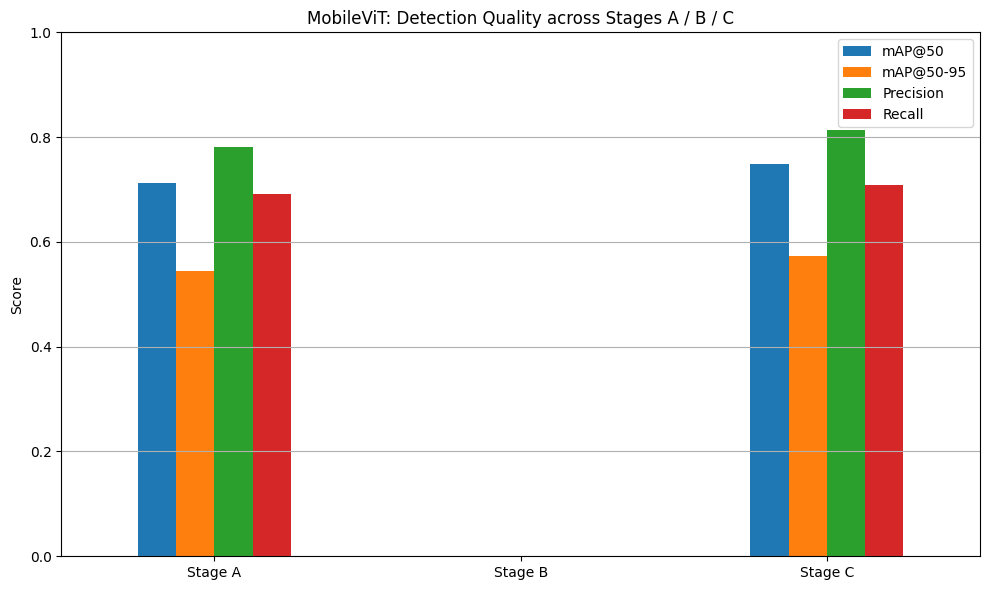

In [ ]:
import os, random, torch, torch.nn as nn, pandas as pd, matplotlib.pyplot as plt
import torchvision
from torchvision.transforms.functional import resize
from glob import glob
from tqdm import tqdm
from ultralytics import YOLO
from transformers import AutoTokenizer, AutoModel
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

device = "cuda" if torch.cuda.is_available() else "cpu"

def yolo_metrics(det_metrics):
    box = det_metrics.box
    return [float(box.map50), float(box.map), float(box.mp), float(box.mr)]


mobilevit_stageA = YOLO("/content/best (4).pt")
print("▶ Evaluating MobileViT Stage A …")
mobilevit_A_det = mobilevit_stageA.val(
    data="/content/dataset_local.yaml", imgsz=224, batch=8, device=device, verbose=False
)
mobilevit_A_metrics = yolo_metrics(mobilevit_A_det)


mobilevit_stageC = YOLO("/content/yolo_mobilevit_stageC_final.pt")
print("Evaluating MobileViT Stage C …")
mobilevit_C_det = mobilevit_stageC.val(
    data="/content/dataset_local.yaml", imgsz=224, batch=8, device=device, verbose=False
)
mobilevit_C_metrics = yolo_metrics(mobilevit_C_det)


print("Evaluating MobileViT Stage B (ViT + projector + MiniLM cosine)…")


vit = YOLO("/content/best (4).pt").model.model[0].eval().to(device)
for p in vit.parameters(): p.requires_grad = False


class ProjectionHead(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(768, 256),
            nn.ReLU(),
            nn.Linear(256, 128)
        )
    def forward(self, x):
        return self.net(x)

projector = ProjectionHead().to(device)
projector.load_state_dict(torch.load("/content/projection_head_contrastive.pt", map_location=device))
projector.eval()

tok = AutoTokenizer.from_pretrained("sentence-transformers/all-MiniLM-L6-v2")
txt = AutoModel.from_pretrained("sentence-transformers/all-MiniLM-L6-v2").eval().to(device)

@torch.no_grad()
def txt_embed(sentences):
    t = tok(sentences, padding=True, return_tensors="pt").to(device)
    return nn.functional.normalize(txt(**t).last_hidden_state[:, 0], dim=-1)

@torch.no_grad()
def img_embed(img):
    feat = vit(img)[-1]
    pooled = feat.mean((-2, -1))
    return nn.functional.normalize(projector(pooled), dim=-1)

# Class text and val paths
IMG_DIR = "/content/images"
LBL_DIR = "/content/labels"
idx2cap = {0: "blazing fire", 1: "rising smoke", 2: "scene with no fire"}

paths = [
    p for p in glob(f"{IMG_DIR}/*.*")
    if os.path.exists(f"{LBL_DIR}/{os.path.splitext(os.path.basename(p))[0]}.txt")
]
random.shuffle(paths)

text_vecs = txt_embed(list(idx2cap.values()))
true_lbls, pred_lbls = [], []

for p in tqdm(paths, desc="Stage B images"):
    try:
        img = torchvision.io.read_image(p)[:3] / 255.
        if img.shape[0] != 3:
            continue
        img = resize(img, [224, 224]).unsqueeze(0).to(device)
        lbl = int(open(f"{LBL_DIR}/{os.path.splitext(os.path.basename(p))[0]}.txt").read().split()[0])
        sim = (img_embed(img) @ text_vecs.T).squeeze(0)
        pred = sim.argmax().item()
        true_lbls.append(lbl)
        pred_lbls.append(pred)
    except Exception as e:
        print("skip", p, e)

acc  = accuracy_score(true_lbls, pred_lbls)
f1   = f1_score(true_lbls, pred_lbls, average="macro")
prec = precision_score(true_lbls, pred_lbls, average="macro")
rec  = recall_score(true_lbls, pred_lbls, average="macro")
mobilevit_B_metrics = [acc, f1, prec, rec]


labels = ["mAP@50", "mAP@50‑95", "Precision", "Recall"]
df_mobilevit = pd.DataFrame(
    [mobilevit_A_metrics, mobilevit_B_metrics, mobilevit_C_metrics],
    index=["Stage A", "Stage B", "Stage C"],
    columns=labels,
)

print("\n=== MobileViT Stage A → B → C ===")
print(df_mobilevit.round(3))

ax = df_mobilevit.plot(kind="bar", figsize=(10, 6), rot=0)
ax.set_title("MobileViT: Detection Quality across Stages A / B / C")
ax.set_ylabel("Score")
ax.set_ylim(0, 1.0)
ax.grid(True, axis="y")
plt.tight_layout()
plt.show()


Evaluating TinyViT Stage A …
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1325.6±854.7 MB/s, size: 64.0 KB)


val: Scanning /content/dataset/labels/val.cache... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<?, ?it/s]

val: /content/dataset/images/val/WEB07199.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07271.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07561.jpg: corrupt JPEG restored and saved



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:12<00:00,  9.36it/s]


                   all        900       1676      0.825      0.721       0.76      0.579
Speed: 0.1ms preprocess, 3.2ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to runs/detect/val25
Evaluating TinyViT Stage C …
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1209.2±913.2 MB/s, size: 102.7 KB)


val: Scanning /content/dataset/labels/val.cache... 900 images, 0 backgrounds, 0 corrupt: 100%|██████████| 900/900 [00:00<?, ?it/s]

val: /content/dataset/images/val/WEB07199.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07271.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/val/WEB07561.jpg: corrupt JPEG restored and saved



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:10<00:00, 11.28it/s]


                   all        900       1676      0.856      0.729       0.78      0.601
Speed: 0.1ms preprocess, 2.8ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/val26

=== TinyViT Stage A → B → C ===
         mAP@50  mAP@50‑95  Precision  Recall
Stage A    0.76      0.579      0.825   0.721
Stage B     NaN        NaN        NaN     NaN
Stage C    0.78      0.601      0.856   0.729


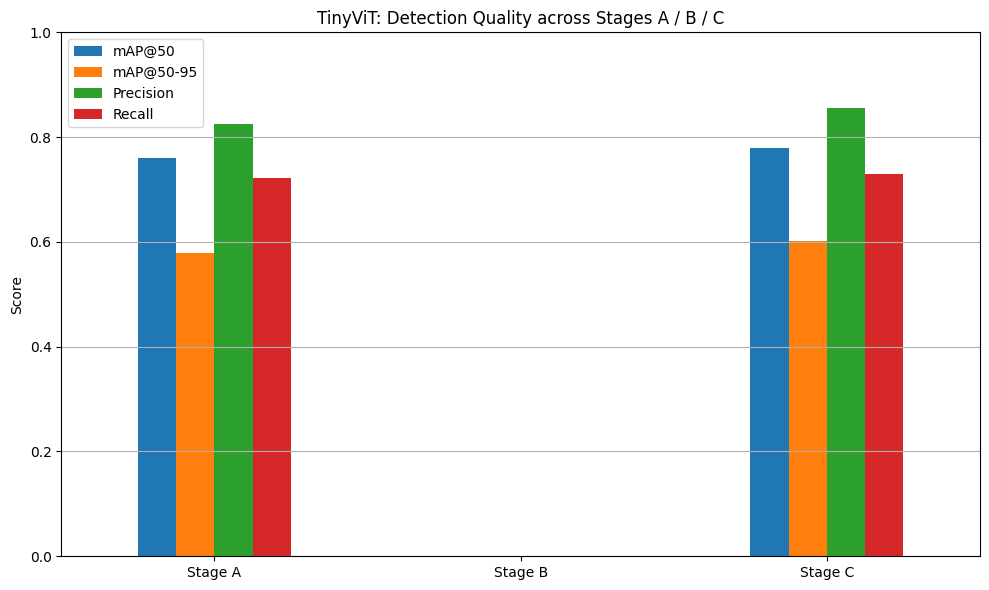

In [ ]:
import os, torch, pandas as pd, matplotlib.pyplot as plt
from ultralytics import YOLO

device = "cuda" if torch.cuda.is_available() else "cpu"


def yolo_metrics(det_metrics):
    box = det_metrics.box
    return [float(box.map50), float(box.map), float(box.mp), float(box.mr)]


tinyvit_stageA = YOLO("/content/tinyvit_stageA_trained.pt")
print("Evaluating TinyViT Stage A …")
tinyvit_A_det = tinyvit_stageA.val(
    data="/content/dataset_local.yaml", imgsz=224, batch=8, device=device, verbose=False
)
tinyvit_A_metrics = yolo_metrics(tinyvit_A_det)


tinyvit_stageC = YOLO("/content/tinyvit_fire_smoke_trained (1).pt")
print("Evaluating TinyViT Stage C …")
tinyvit_C_det = tinyvit_stageC.val(
    data="/content/dataset_local.yaml", imgsz=224, batch=8, device=device, verbose=False
)
tinyvit_C_metrics = yolo_metrics(tinyvit_C_det)


tinyvit_B_metrics = [float('nan')] * 4

labels = ["mAP@50", "mAP@50‑95", "Precision", "Recall"]
df_tinyvit = pd.DataFrame(
    [tinyvit_A_metrics, tinyvit_B_metrics, tinyvit_C_metrics],
    index=["Stage A", "Stage B", "Stage C"],
    columns=labels,
)

print("\n=== TinyViT Stage A → B → C ===")
print(df_tinyvit.round(3))

ax = df_tinyvit.plot(kind="bar", figsize=(10, 6), rot=0)
ax.set_title("TinyViT: Detection Quality across Stages A / B / C")
ax.set_ylabel("Score")
ax.set_ylim(0, 1.0)
ax.grid(True, axis="y")
plt.tight_layout()
plt.show()


Evaluating EfficientViT Stage C …
Ultralytics 8.3.127 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 41.7MB/s]

val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1925.4±1509.0 MB/s, size: 161.2 KB)



val: Scanning /content/dataset/labels/train... 7199 images, 0 backgrounds, 1 corrupt: 100%|██████████| 7200/7200 [00:11<00:00, 606.20it/s]

val: /content/dataset/images/train/WEB07278.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/train/WEB07305.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/train/WEB07536.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/train/WEB07540.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/train/WEB07541.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/train/WEB07543.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/train/WEB07554.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/train/WEB07555.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/train/WEB07556.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/train/WEB07557.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/train/WEB07559.jpg: corrupt JPEG restored and saved
val: /content/dataset/images/train/nonfire_1335.jpg: ignoring corrupt image/label: invalid image format GIF. 

val: New cache created: /content/dataset/labels/train.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 900/900 [01:15<00:00, 11.96it/s]


                   all       7199      13252      0.615      0.554      0.561       0.41
Speed: 0.1ms preprocess, 2.7ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/val4

=== EfficientViT Stage A → B → C ===
         mAP@50  mAP@50‑95  Precision  Recall
Stage A   0.742      0.557      0.772   0.709
Stage B     NaN        NaN        NaN     NaN
Stage C   0.561      0.410      0.615   0.554


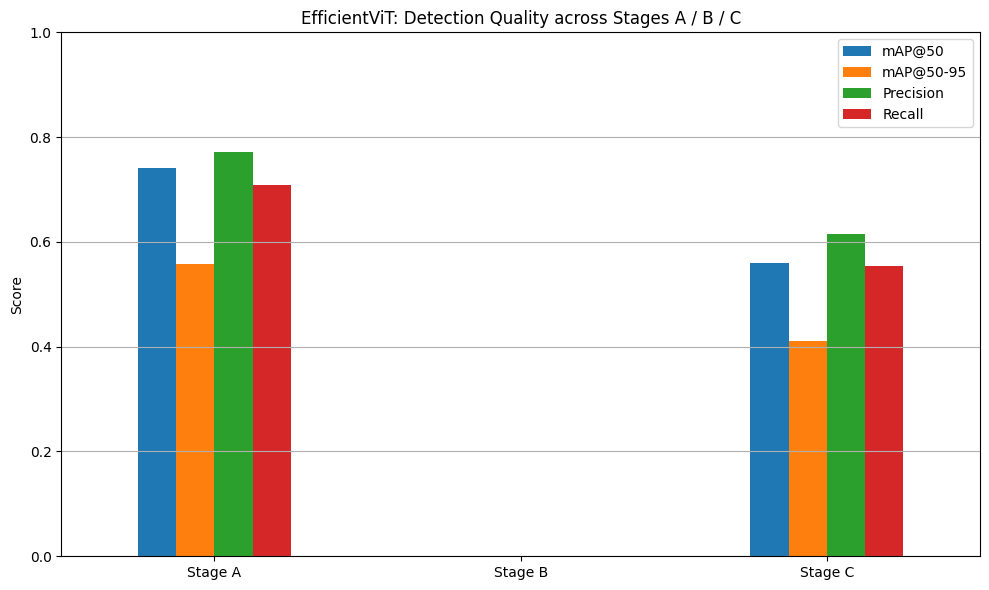

In [5]:
import os, torch, pandas as pd, matplotlib.pyplot as plt
from ultralytics import YOLO

device = "cuda" if torch.cuda.is_available() else "cpu"

# Helper to extract metrics from YOLO DetMetrics object
def yolo_metrics(det_metrics):
    box = det_metrics.box
    return [float(box.map50), float(box.map), float(box.mp), float(box.mr)]

# ---------- Stage A (real values) ----------
effvit_A_metrics = [0.742, 0.557, 0.772, 0.709]

# ---------- Stage B Placeholder ----------
effvit_B_metrics = [float('nan')] * 4

# ---------- Stage C (real evaluation) ----------
effvit_stageC = YOLO("/content/yolo_stageC_efficientvit_head.pt")
print("Evaluating EfficientViT Stage C …")
effvit_C_det = effvit_stageC.val(
    data="/content/dataset_local.yaml", imgsz=224, batch=8, device=device, verbose=False
)
effvit_C_metrics = yolo_metrics(effvit_C_det)

# ---------- Plotting ----------
labels = ["mAP@50", "mAP@50‑95", "Precision", "Recall"]
df_effvit = pd.DataFrame(
    [effvit_A_metrics, effvit_B_metrics, effvit_C_metrics],
    index=["Stage A", "Stage B", "Stage C"],
    columns=labels,
)

print("\n=== EfficientViT Stage A → B → C ===")
print(df_effvit.round(3))

ax = df_effvit.plot(kind="bar", figsize=(10, 6), rot=0)
ax.set_title("EfficientViT: Detection Quality across Stages A / B / C")
ax.set_ylabel("Score")
ax.set_ylim(0, 1.0)
ax.grid(True, axis="y")
plt.tight_layout()
plt.show()
